In [40]:
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import math
import numpy as np
import imageio


def load_all_fitnesses(filename) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        best_fitnesses = []
        avg_fitnesses = []
        pop_size= []
        nb_eval = []
        nb_eval_tot = 0
        for row in csv_data :
            best_fitness = 0
            avg_fitness = 0
            nb_eval_tot += int(row[1])
            for cell in row[2:-1] :
                if(float(cell) > best_fitness) :
                    best_fitness = float(cell)
                avg_fitness += float(cell)
            avg_fitness = avg_fitness/float(row[1])
            avg_fitnesses.append(avg_fitness)
            best_fitnesses.append(best_fitness)
            nb_eval.append(nb_eval_tot)
            pop_size.append(float(row[1]))
            
    return nb_eval, best_fitnesses, avg_fitnesses, pop_size

def histo_nbeval(nbeval,bins) :
    histo = [0 for b in bins]
    for nbe in nbeval :
        for i in range(0,len(bins)) :
            if(nbe < int(bins[i])) :
                histo[i] += 1
                break
    for i in range(0,len(histo)) :
        histo[i] = float(histo[i])/float(len(nbeval))*100
    return histo

def best_fit(fitnesses_vec,from_i) :
    best_fits = []
    for fits in fitnesses_vec :
        best_fits.append(max(fits[from_i:]))
    return best_fits

def load_eval_time(filename) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        durations = []
        eval_nb = []
        for row in csv_data :
            durations.append(float(row[1])*1e-9)
            eval_nb.append(int(row[0]))
    return eval_nb, durations

def load_all_fit_from_fpos(filename,target) :
    best_fitnesses = []
    avg_fitnesses = []
    pop_size= []
    nb_eval = []
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        nb_eval_tot = 0
        for row in csv_data :
            fitnesses = []
            nb_eval_tot+=len(row[2:])/4
            for i in range(2,int(len(row[2:])/4),4) :
                fitnesses.append(compute_reward([float(row[i+1]),float(row[i+2])],target))
            best_fitnesses.append(max(fitnesses))
            avg_fitnesses.append(np.mean(fitnesses))
            pop_size.append(len(row[2:])/4)
            nb_eval.append(nb_eval_tot)
    return nb_eval, best_fitnesses, avg_fitnesses, pop_size

def load_final_pos(filename,pop,gen) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        x = []
        y = []
        for row in csv_data :
            if(float(row[1]) == gen) :
                i = 0
                j = 2
                while(i < pop - 1):
                    if(j >= len(row) -1) :
                        break
                    if(float(row[j]) == i and float(row[j+1]) != i+1) :
                        x.append(float(row[j+1]))
                        y.append(float(row[j+2]))
                        j+=3
                    
                    j+=1
                    i+=1
                break
        return x, y

    
def load_obs(filename) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        x = []
        y = []
        for row in csv_data :
            x.append(float(row[2]))
            y.append(float(row[3]))
    return x, y
    
def compute_reward(final_pos,target) :
    return 1 - math.sqrt((final_pos[0] - target[0])**2 + (final_pos[1] - target[1])**2)/math.sqrt(2**3)

def rewards(positions,target) :
    r = []
    for pos in positions :
        r.append(compute_reward(pos,target))
    return r

def animation_pop(foldername,pop_size,step) :
    plt.ioff()
    images = []
    for i in range(0,len(pop_size),step) :
        x_vec = []
        y_vec = []
        if(not os.path.isdir(foldername)) :
            continue
        x, y = load_final_pos(foldername + "/final_pos.csv",pop_size[i],i)
        x_vec = x_vec + x
        y_vec = y_vec + y   
                
        fig2, ax2 = plt.subplots(figsize=[10,10])
        ax2.set_ylim(-1.,1.)
        ax2.set_xlim(-1.,1.)
        plt.title("Generation " + str(i))
        plt.plot(x_vec,y_vec,'o')
        plt.savefig(foldername + "/pop_" + str(i) + ".jpg")
        plt.close(fig2)
        images.append(imageio.imread(foldername + "/pop_" + str(i) + ".jpg"))
    imageio.mimwrite(foldername + "_pop_gen.gif",images)

bo_cmaes_20_3_12-51-40-899_2821413913


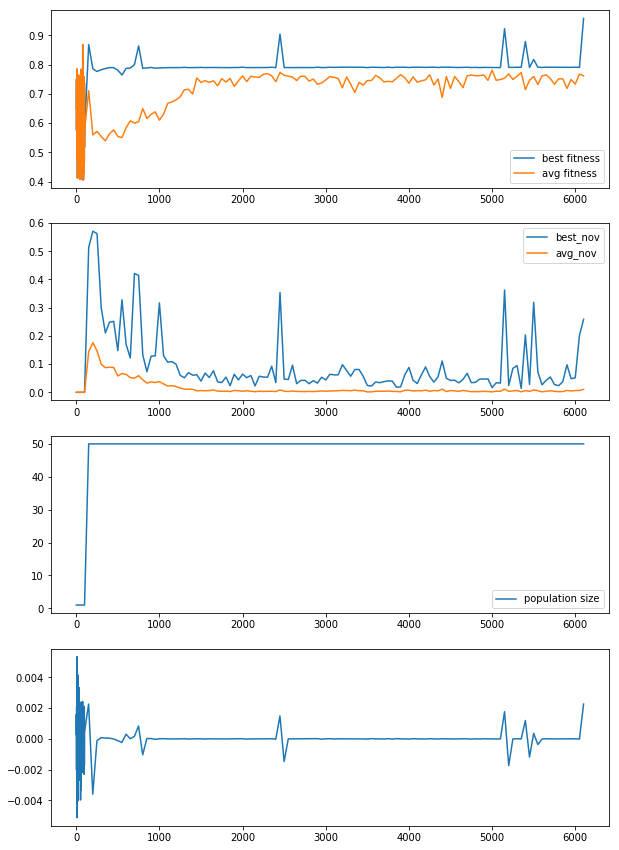

bo_cmaes_20_3_12-51-39-9231_2276785013


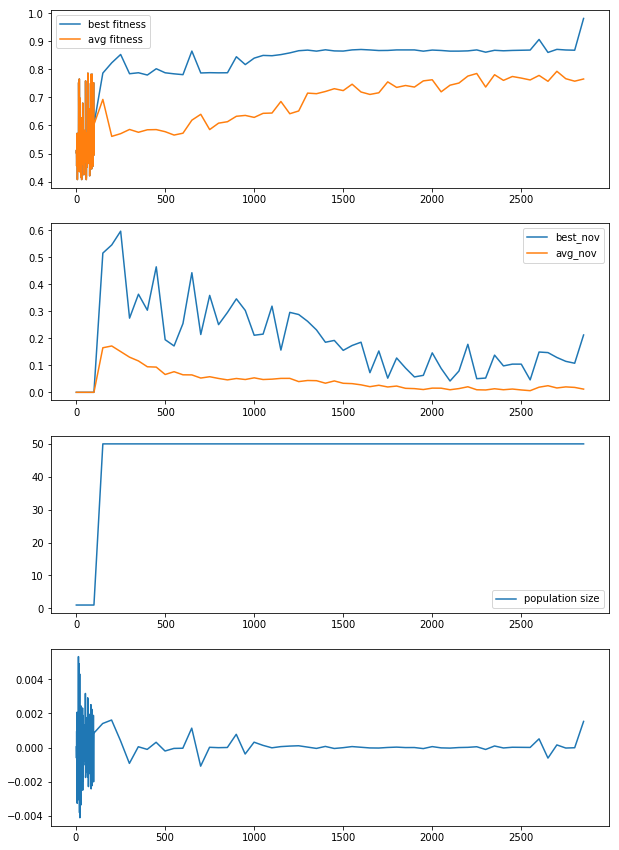

bo_cmaes_20_3_12-51-42-2440_1900696505


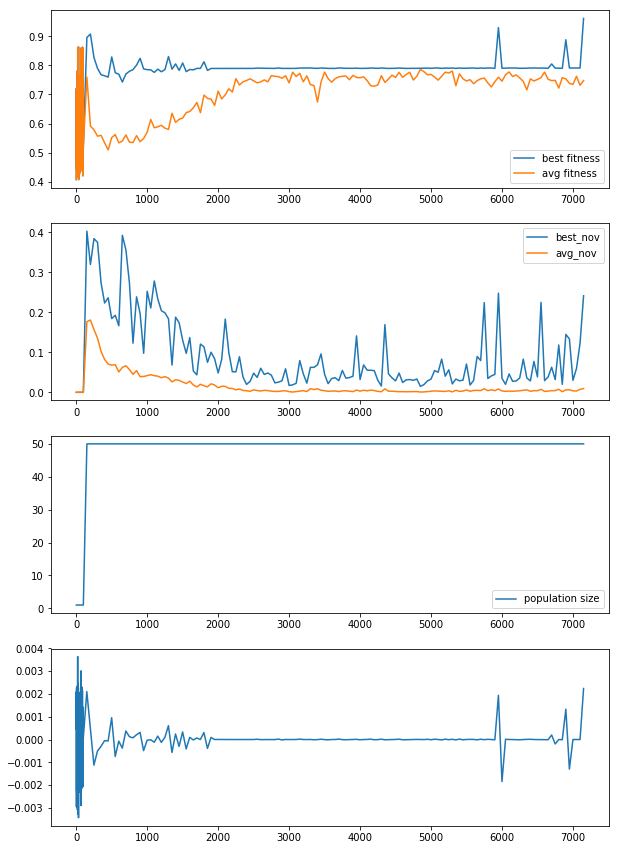

bo_cmaes_20_3_12-51-56-6835_1665878178


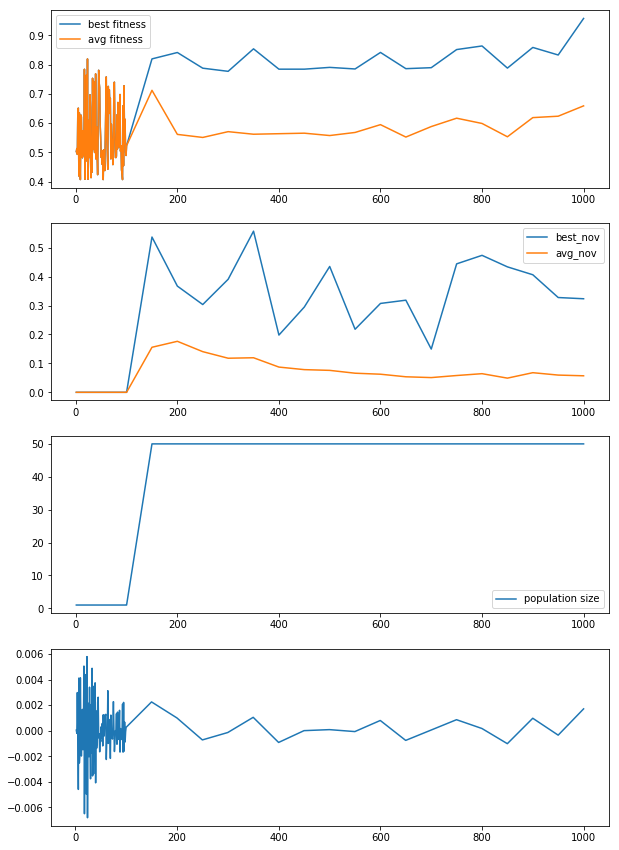

bo_cmaes_20_3_12-51-38-8066_1360293479


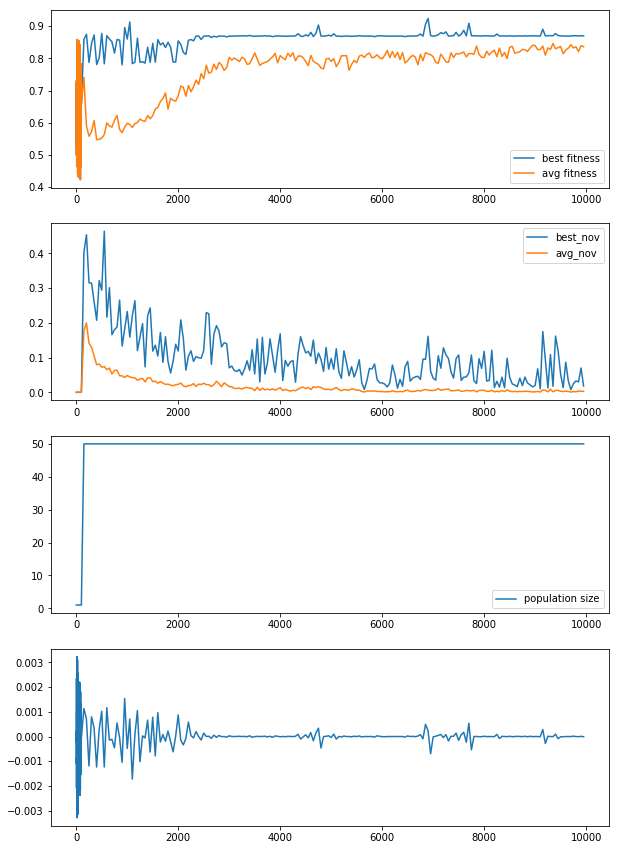

In [17]:
are_bocmaes_middle_gpucb01 = "/home/leni/are-logs/are_bocmaes_middle_gpucb01//"
x_vec = []
y_vec = []
for folder in os.listdir(are_bocmaes_middle_gpucb01) :
    if(not os.path.isdir(are_bocmaes_middle_gpucb01 + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_bocmaes_middle_gpucb01 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_bocmaes_middle_gpucb01 + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_bocmaes_middle_gpucb01 + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
   # animation_pop(are_bocmaes_middle_gpucb01 + folder,pop_size,1)

bo_cmaes_22_3_12-11-55-5165_321656319


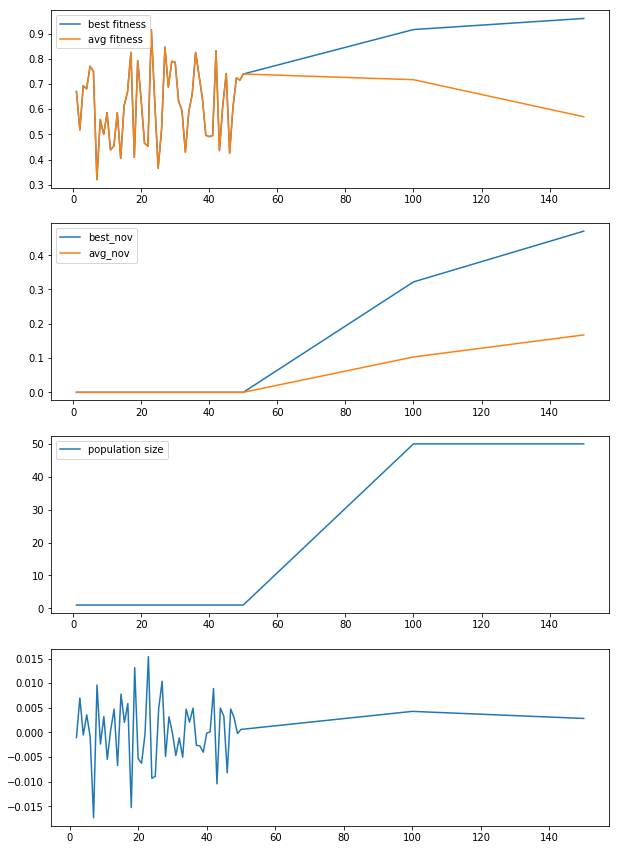

bo_cmaes_22_3_12-11-58-8867_1728500378


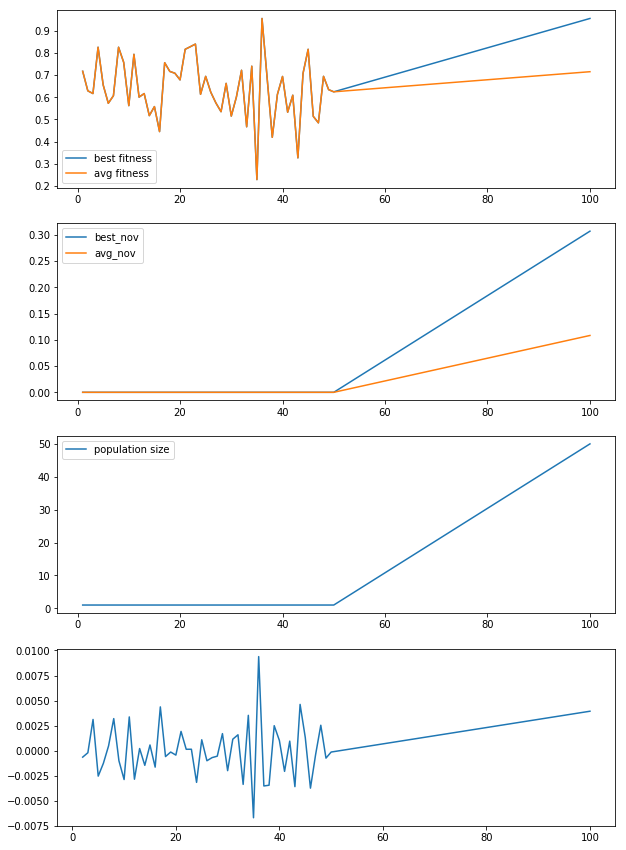

bo_cmaes_22_3_12-12-1-1088_735190817


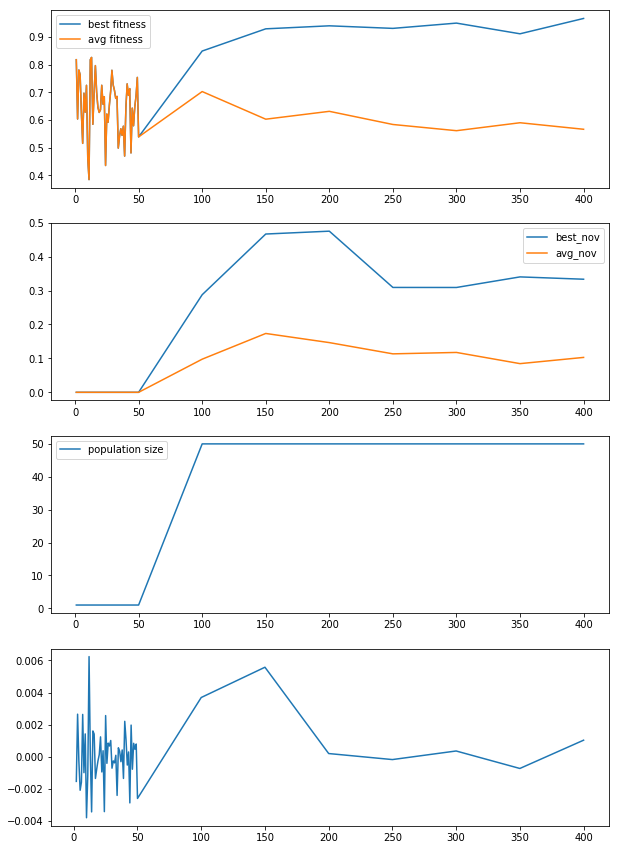

bo_cmaes_22_3_12-11-57-7294_1354714924


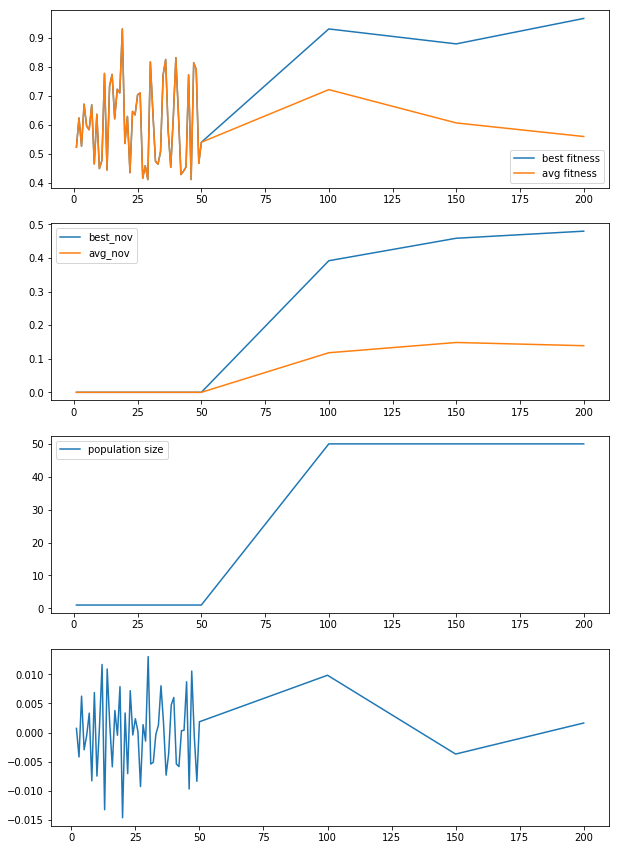

bo_cmaes_22_3_12-11-57-7140_3609736121


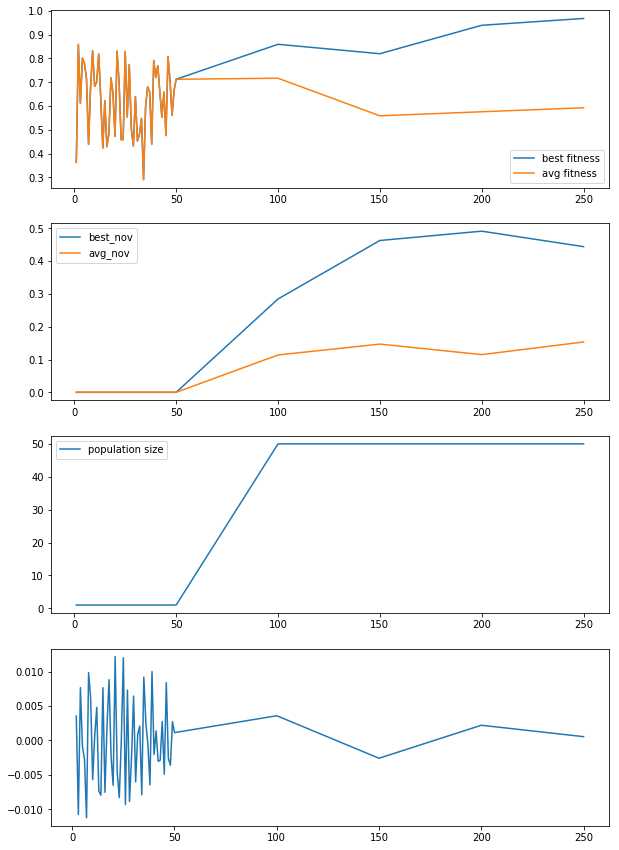

In [40]:
are_bocmaes_escape = "/home/leni/are-logs/are_bocmeas_escape/"
x_vec = []
y_vec = []
for folder in os.listdir(are_bocmaes_escape) :
    if(not os.path.isdir(are_bocmaes_escape + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_bocmaes_escape + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_bocmaes_escape + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_bocmaes_escape + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
   # animation_pop(are_bocmaes_middle_gpucb01 + folder,pop_size,1)

10
[70.0, 10.0, 10.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[50.0, 20.0, 10.0, 10.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 30.0, 20.0, 40.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 60.0, 20.0, 20.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


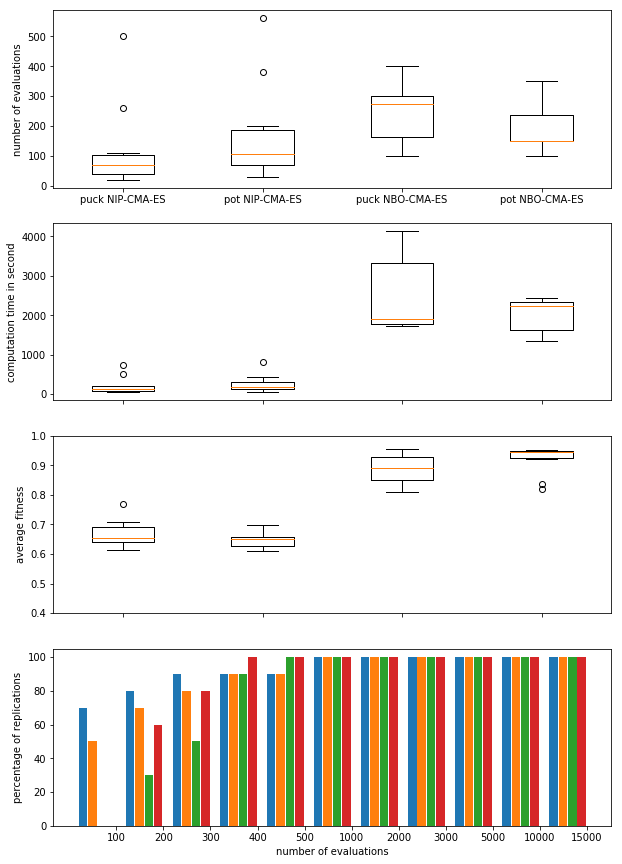

In [47]:
list_dir = [
            "/home/leni/are-logs/are_ipop_escape/",\
            "/home/leni/are-logs/pot_ipop_escape/",\
           "/home/leni/are-logs/are_bocmeas_escape/",
           "/home/leni/are-logs/pot_bocmaes_escape/"]
list_label = ["puck NSCMAES","pot NSCMAES",
              "puck NIPCMAES","pot NIPCMAES",
              "puck BOCMAES", "pot BOCMAES"]
list_label = ["puck NIP-CMA-ES","pot NIP-CMA-ES","puck NBO-CMA-ES", "pot NBO-CMA-ES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','200','300','400','500','1000','2000','3000','5000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,15))
ax1 = plt.subplot(411)
ax2 = plt.subplot(412)
ax3 = plt.subplot(413)
ax4 = plt.subplot(414)

i = -len(list_dir)
j = 0
avg_fitnesses = []
total_times = []
for dire in list_dir :
    nevals = []
    avg_fits = []
    totalT = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop" and folder.split("_")[0] != "bo") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        totalT.append(sum(eval_time))
        avg_fits.append(max(avg_fit))
        nevals.append(neval[-1])
    
    print(len(nevals))
    nbevals.append(nevals)
    avg_fitnesses.append(avg_fits)
    total_times.append(totalT)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax4.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax4.set_xticks(xbar)
ax4.set_xticklabels(bins)


ax1.boxplot(nbevals,labels=list_label)
ax2.boxplot(total_times)
plt.setp(ax2.get_xticklabels(), visible=False)
ax3.boxplot(avg_fitnesses)
ax3.set_ylim(0.4,1)
plt.setp(ax3.get_xticklabels(), visible=False)
ax1.set_ylabel("number of evaluations")
ax4.set_xlabel("number of evaluations")
ax4.set_ylabel("percentage of replications")
ax3.set_ylabel("average fitness")
ax2.set_ylabel("computation time in second")
plt.show()

10
[10.0, 10.0, 0.0, 40.0, 10.0, 20.0, 10.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 10.0, 0.0, 20.0, 20.0, 30.0, 10.0, 10.0, 0.0]
10
[0.0, 40.0, 20.0, 0.0, 0.0, 40.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 20.0, 20.0, 10.0, 0.0, 10.0, 30.0, 0.0, 10.0, 0.0, 0.0]


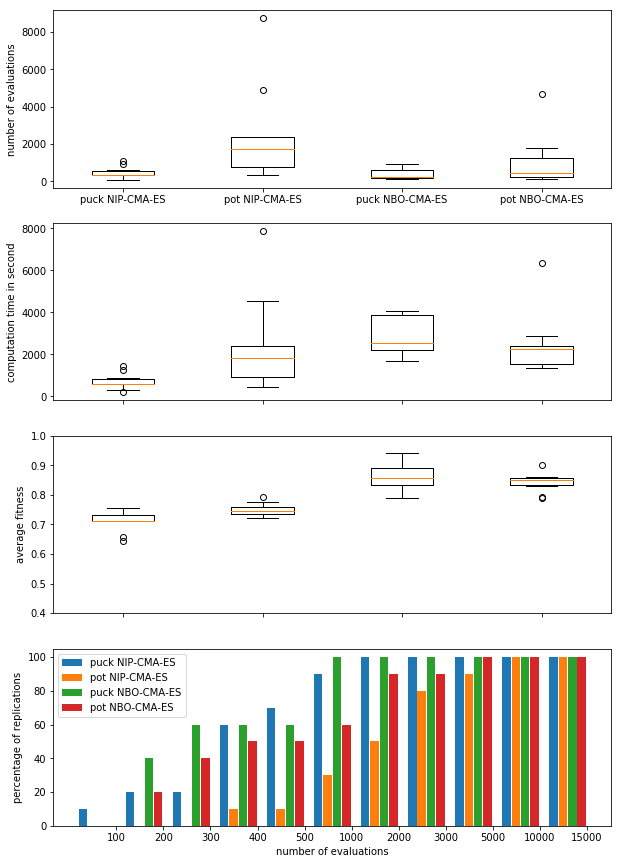

In [44]:
list_dir = [            "/home/leni/are-logs/are_ipop_middle/",\
            "/home/leni/are-logs/pot_ipop_middle/",\
           "/home/leni/are-logs/are_bocmeas_middle/",
           "/home/leni/are-logs/pot_bocmaes_middle/"]
list_label = ["puck NIP-CMA-ES","pot NIP-CMA-ES","puck NBO-CMA-ES", "pot NBO-CMA-ES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','200','300','400','500','1000','2000','3000','5000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,15))
ax1 = plt.subplot(411)
ax2 = plt.subplot(412)
ax3 = plt.subplot(413)
ax4 = plt.subplot(414)

i = -len(list_dir)
j = 0
avg_fitnesses = []
total_times = []
for dire in list_dir :
    nevals = []
    avg_fits = []
    totalT = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop" and folder.split("_")[0] != "bo") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        totalT.append(sum(eval_time))
        avg_fits.append(max(avg_fit))
        nevals.append(neval[-1])
    
    print(len(nevals))
    nbevals.append(nevals)
    avg_fitnesses.append(avg_fits)
    total_times.append(totalT)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax4.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax4.set_xticks(xbar)
ax4.set_xticklabels(bins)
ax4.legend()


ax1.boxplot(nbevals,labels=list_label)
ax2.boxplot(total_times)
plt.setp(ax2.get_xticklabels(), visible=False)
ax3.boxplot(avg_fitnesses)
ax3.set_ylim(0.4,1)
plt.setp(ax3.get_xticklabels(), visible=False)
ax1.set_ylabel("number of evaluations")
ax4.set_xlabel("number of evaluations")
ax4.set_ylabel("percentage of replications")
ax3.set_ylabel("average fitness")
ax2.set_ylabel("computation time in second")
plt.show()

10
[60.0, 20.0, 10.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[80.0, 20.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 0.0, 10.0, 0.0, 20.0, 30.0, 10.0, 0.0, 0.0, 0.0, 30.0]
10
[0.0, 60.0, 30.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


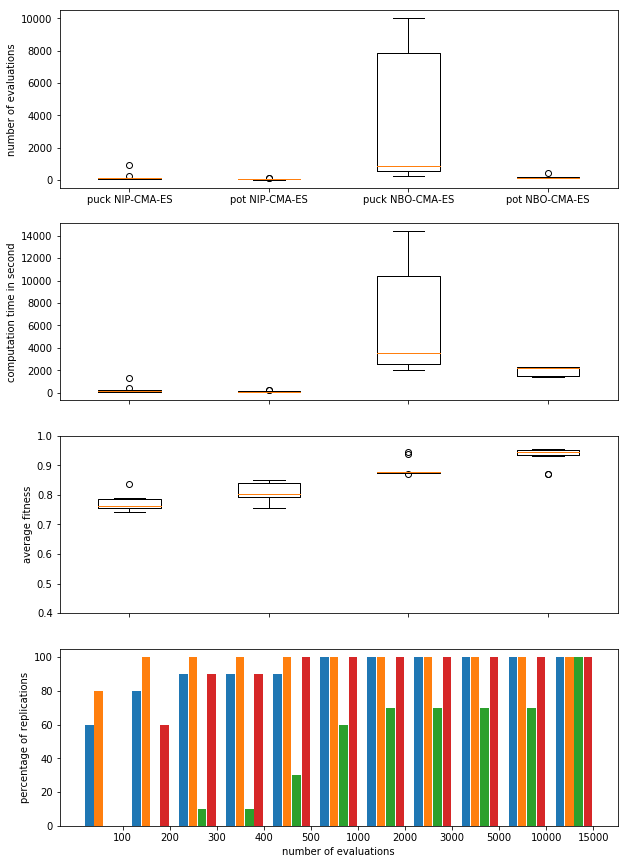

In [43]:
list_dir = ["/home/leni/are-logs/are_ipop_multi/",
            "/home/leni/are-logs/pot_ipop_multi/",
           "/home/leni/are-logs/are_bocmeas_multi/",
           "/home/leni/are-logs/pot_bocmaes_multi/"]
list_label = ["puck NIP-CMA-ES","pot NIP-CMA-ES","puck NBO-CMA-ES", "pot NBO-CMA-ES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','200','300','400','500','1000','2000','3000','5000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,15))
ax1 = plt.subplot(411)
ax2 = plt.subplot(412)
ax3 = plt.subplot(413)
ax4 = plt.subplot(414)

i = -len(list_dir)
j = 0
avg_fitnesses = []
total_times = []
for dire in list_dir :
    nevals = []
    avg_fits = []
    totalT = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop" and folder.split("_")[0] != "bo") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        totalT.append(sum(eval_time))
        avg_fits.append(max(avg_fit))
        nevals.append(neval[-1])
    
    print(len(nevals))
    nbevals.append(nevals)
    avg_fitnesses.append(avg_fits)
    total_times.append(totalT)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax4.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax4.set_xticks(xbar)
ax4.set_xticklabels(bins)


ax1.boxplot(nbevals,labels=list_label)
ax2.boxplot(total_times)
plt.setp(ax2.get_xticklabels(), visible=False)
ax3.boxplot(avg_fitnesses)
ax3.set_ylim(0.4,1)

plt.setp(ax3.get_xticklabels(), visible=False)
ax1.set_ylabel("number of evaluations")
ax4.set_xlabel("number of evaluations")
ax4.set_ylabel("percentage of replications")
ax3.set_ylabel("average fitness")
ax2.set_ylabel("computation time in second")
plt.show()

10
[10.0, 40.0, 10.0, 0.0, 20.0, 0.0, 10.0, 0.0, 10.0, 0.0, 0.0]
10
[10.0, 0.0, 30.0, 0.0, 10.0, 50.0, 0.0, 0.0, 0.0, 0.0, 0.0]
9
[0.0, 0.0, 0.0, 0.0, 0.0, 33.33333333333333, 33.33333333333333, 11.11111111111111, 22.22222222222222, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 20.0, 0.0, 20.0, 40.0, 10.0, 0.0, 10.0, 0.0]


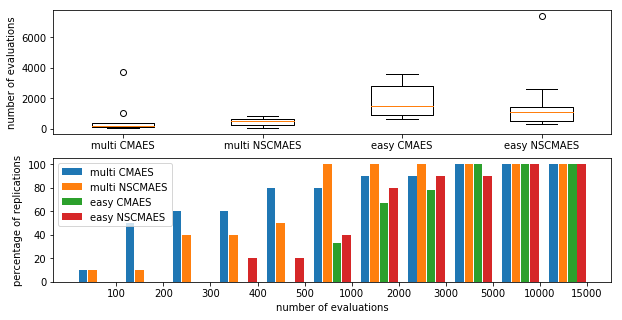

In [19]:
list_dir = ["/home/leni/are-logs/are_cmaes_nonov_multi/",
            "/home/leni/are-logs/are_cmaes_multi/",
           "/home/leni/are-logs/are_cmaes_nonov_easy/",
            "/home/leni/are-logs/are_cmaes_easy/"]
list_label = ["multi CMAES","multi NSCMAES","easy CMAES","easy NSCMAES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','200','300','400','500','1000','2000','3000','5000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

i = -len(list_dir)
j = 0
avg_fitnesses = []
total_times = []
for dire in list_dir :
    nevals = []
    avg_fits = []
    totalT = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop" and folder.split("_")[0] != "bo") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        totalT.append(sum(eval_time))
        avg_fits.append(max(avg_fit))
        nevals.append(neval[-1])

                    

    
    print(len(nevals))
    nbevals.append(nevals)
    avg_fitnesses.append(avg_fits)
    total_times.append(totalT)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax2.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax2.set_xticks(xbar)
ax2.set_xticklabels(bins)
ax2.legend()

ax1.boxplot(nbevals,labels=list_label)
ax1.set_ylabel("number of evaluations")
ax2.set_xlabel("number of evaluations")
ax2.set_ylabel("percentage of replications")
plt.show()

15
[0.0, 6.666666666666667, 0.0, 0.0, 6.666666666666667, 66.66666666666666, 13.333333333333334, 6.666666666666667, 0.0, 0.0, 0.0]
10
[10.0, 0.0, 20.0, 10.0, 0.0, 0.0, 40.0, 10.0, 10.0, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 0.0, 10.0, 10.0, 0.0, 30.0, 30.0, 10.0, 10.0]
10
[0.0, 30.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 50.0]


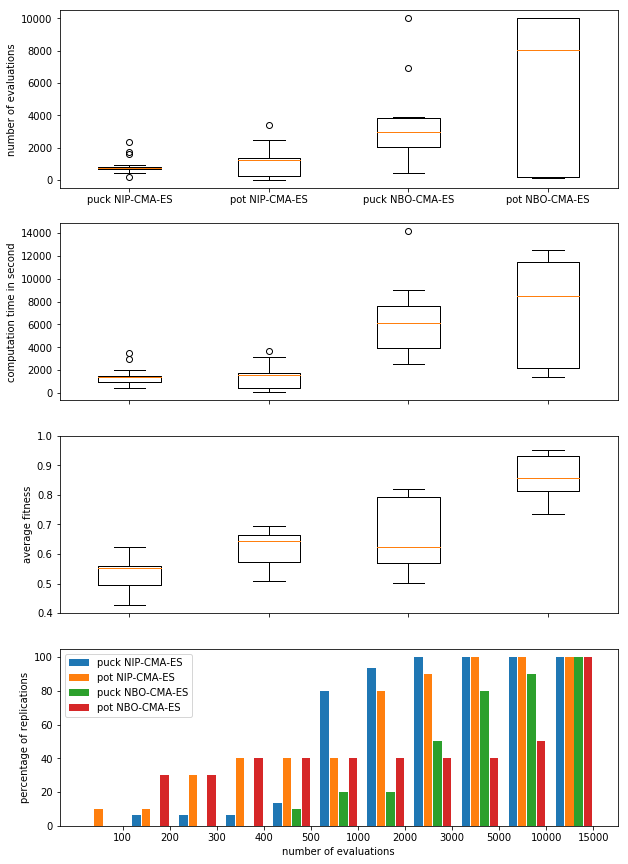

In [42]:
list_dir = ["/home/leni/are-logs/are_ipop_easy/",\
            "/home/leni/are-logs/pot_ipop_easy/",\
           "/home/leni/are-logs/are_bocmeas_easy/",
           "/home/leni/are-logs/pot_bocmaes_easy/",]
list_label = ["puck NIP-CMA-ES","pot NIP-CMA-ES","puck NBO-CMA-ES", "pot NBO-CMA-ES"]
best_fits = []
i = 0   
nbevals = []
bins = ['100','200','300','400','500','1000','2000','3000','5000','10000','15000']
xbar = np.arange(len(bins))
width = 0.8/float(len(list_label))
fig = plt.figure(figsize=(10,15))
ax1 = plt.subplot(411)
ax2 = plt.subplot(412)
ax3 = plt.subplot(413)
ax4 = plt.subplot(414)

i = -len(list_dir)
j = 0
avg_fitnesses = []
total_times = []
for dire in list_dir :
    nevals = []
    avg_fits = []
    totalT = []
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop" and folder.split("_")[0] != "bo") :
            continue
        if(not os.path.isdir(dire + folder)) :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        totalT.append(sum(eval_time))
        avg_fits.append(max(avg_fit))
        nevals.append(neval[-1])
    
    print(len(nevals))
    nbevals.append(nevals)
    avg_fitnesses.append(avg_fits)
    total_times.append(totalT)
    histo = histo_nbeval(nevals,bins)
    histo_cumu = [histo[0]]
    for k in range(1,len(histo)) :
        histo_cumu.append(histo[k] + histo_cumu[k-1])
    print(histo)
    ax4.bar(xbar + width*i,histo_cumu,width - 0.02,label=list_label[j],align="edge")
    i += 1
    j += 1
    
ax4.set_xticks(xbar)
ax4.set_xticklabels(bins)
ax4.legend()


ax1.boxplot(nbevals,labels=list_label)
ax2.boxplot(total_times)
plt.setp(ax2.get_xticklabels(), visible=False)
ax3.boxplot(avg_fitnesses)
ax3.set_ylim(0.4,1)
plt.setp(ax3.get_xticklabels(), visible=False)
ax1.set_ylabel("number of evaluations")
ax4.set_xlabel("number of evaluations")
ax4.set_ylabel("percentage of replications")
ax3.set_ylabel("average fitness")
ax2.set_ylabel("computation time in second")
plt.show()

MFBO Successful runs on  escape room 6
MFBO Successful runs on  middle wall 1
MFBO Successful runs on  multi maze 2
MFBO Successful runs on  easy race 0
NBO-ES Successful runs on  escape room 9
NBO-ES Successful runs on  middle wall 6
NBO-ES Successful runs on  multi maze 1
NBO-ES Successful runs on  easy race 0
N-CMA-ES Successful runs on  escape room 10
N-CMA-ES Successful runs on  middle wall 6
N-CMA-ES Successful runs on  multi maze 4
N-CMA-ES Successful runs on  easy race 2


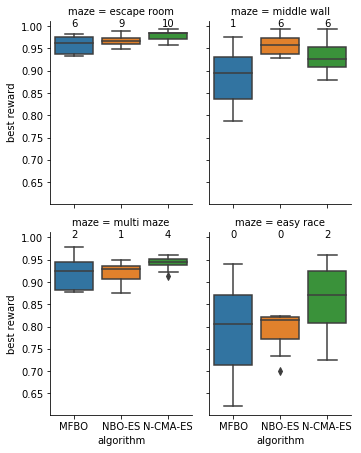

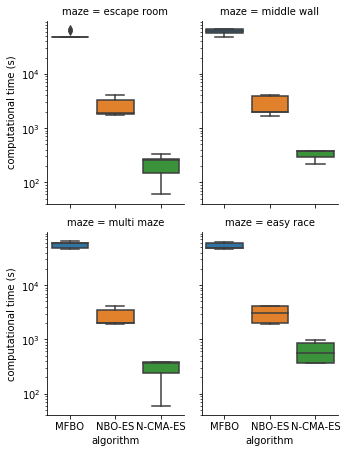

In [52]:
list_dir = [["/home/leni/are-logs/are_mfbo_escape/",
            "/home/leni/are-logs/are_mfbo_middle/",
            "/home/leni/are-logs/are_mfbo_multi/",
            "/home/leni/are-logs/are_mfbo_easy/"],
           ["/home/leni/are-logs/are_bocmeas_escape/",
            "/home/leni/are-logs/are_bocmeas_middle/",
            "/home/leni/are-logs/are_bocmeas_multi/",
            "/home/leni/are-logs/are_bocmeas_easy/"],
            ["/home/leni/are-logs/are_cmaes_escape/",
             "/home/leni/are-logs/are_cmaes_middle/",
             "/home/leni/are-logs/are_cmaes_multi/",
           "/home/leni/are-logs/are_cmaes_easy/"]]
list_label = ["MFBO", "NBO-ES","N-CMA-ES"]
maze_name =  ["escape room","middle wall","multi maze","easy race"]
target = [[0.75,0.75],[0.,0.5],[0,-0.5],[0.75,0.75]]

lines = []
i = 0
count_bo = []
for dire in list_dir[0] :
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "mfbo") :
            continue
        x, y = load_obs(dire + folder + "/bo_data.csv")
        fitnesses = rewards(zip(x,y),target[i])
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        if(max(fitnesses) >= 0.95):
            count+=1
        lines.append([max(fitnesses),sum(eval_time),list_label[0],maze_name[i]])
    print("MFBO Successful runs on ",maze_name[i],count)
    count_bo.append(count)
    i+=1
 

i = 0
count_nbo = []
for dire in list_dir[1] :
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "bo") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        if(max(best_fit[:56]) >= 0.95):
            count+=1
        lines.append([max(best_fit[:56]),sum(eval_time[:56]),list_label[1],maze_name[i]])
    print("NBO-ES Successful runs on ",maze_name[i],count)
    count_nbo.append(count)
    i+=1
   

i = 0
count_es = []
for dire in list_dir[2] :
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        if(max(best_fit[:7]) >= 0.95):
            count+=1
        lines.append([max(best_fit[:7]),sum(eval_time[:7]),list_label[2],maze_name[i]])
    count_es.append(count)
    print("N-CMA-ES Successful runs on ",maze_name[i],count)
    i+=1

counts = [count_bo,count_nbo,count_es]    
d = pd.DataFrame(data=lines,columns=["best reward","computational time (s)","algorithm","maze"])    
    

grid1 = sns.catplot(x="algorithm",y="best reward",data=d,col="maze",kind="box",aspect=0.8,height=3.2,col_wrap=2)
for ax,i in zip(grid1.axes.flat,range(len(maze_name))) :
    pos = range(len(counts))
    for x in pos :
        ax.text(x,1.0,counts[x][i],horizontalalignment='center')
grid2 = sns.catplot(x="algorithm",y="computational time (s)",data=d,col="maze",kind="box",aspect=0.8,height=3.2,col_wrap=2)
grid2.set(yscale="log")


escape room 123.0 141.84851074297538 219.58830522770003 210.61183726785814
NIP-ES puck Successful runs on  escape room 10
middle wall 471.0 299.18054749598946 715.1537055983001 370.7658399664723
NIP-ES puck Successful runs on  middle wall 10
multi maze 170.0 255.53864678361276 289.92515309830003 351.0543707737026
NIP-ES puck Successful runs on  multi maze 10
easy race 904.6666666666666 543.6649294883345 1454.2350646573332 802.9242768427744
NIP-ES puck Successful runs on  easy race 10
escape room 173.0 160.3153143027827 256.91329192829994 212.1803910152644
NIP-ES pota Successful runs on  escape room 10
middle wall 2461.0 2437.110789439003 2410.1303653437 2143.8776061042
NIP-ES pota Successful runs on  middle wall 10
multi maze 66.0 30.397368307141328 116.2488425909 50.741645151270134
NIP-ES pota Successful runs on  multi maze 10
easy race 1194.0 1026.2767657898137 1472.4254278693002 1152.842043844903
NIP-ES pota Successful runs on  easy race 10
escape room 245.0 98.6154146165801 2482.47

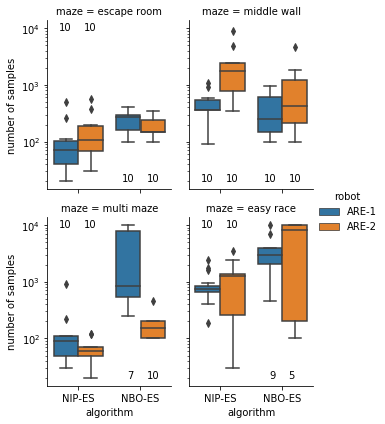

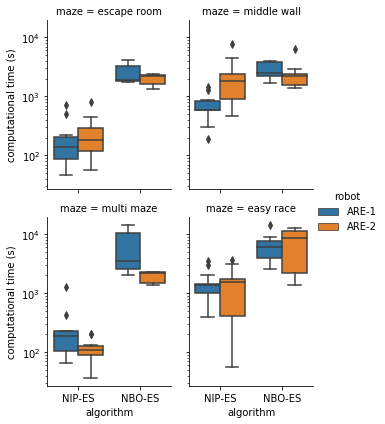

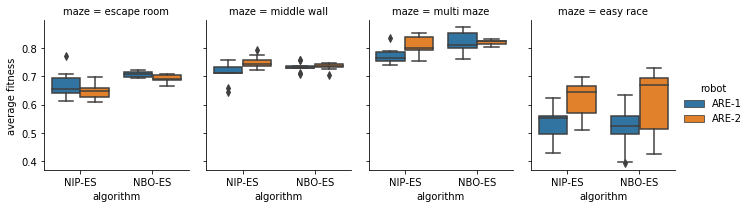

In [49]:
list_dir = [["/home/leni/are-logs/are_ipop_escape/",
            "/home/leni/are-logs/are_ipop_middle/",
            "/home/leni/are-logs/are_ipop_multi/",
            "/home/leni/are-logs/are_ipop_easy/"],
            ["/home/leni/are-logs/pot_ipop_escape/",
            "/home/leni/are-logs/pot_ipop_middle/",
            "/home/leni/are-logs/pot_ipop_multi/",
            "/home/leni/are-logs/pot_ipop_easy/"],
           ["/home/leni/are-logs/are_bocmeas_escape/",
            "/home/leni/are-logs/are_bocmeas_middle/",
            "/home/leni/are-logs/are_bocmeas_multi/",
            "/home/leni/are-logs/are_bocmeas_easy/"],
           ["/home/leni/are-logs/pot_bocmaes_escape/",
            "/home/leni/are-logs/pot_bocmaes_middle/",
            "/home/leni/are-logs/pot_bocmaes_multi/",
            "/home/leni/are-logs/pot_bocmaes_easy/"]]
list_label = ["NIP-ES", "NBO-ES"]
list_robot = ["ARE-1","ARE-2"]
maze_name =  ["escape room","middle wall","multi maze","easy race"]
target = [[0.75,0.75],[0.,0.5],[0,-0.5],[0.75,0.75]]

lines = []
i = 0
count_ipu = []
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        if(max(best_fit) >= 0.95):
            count+=1
        if(count > 10) :
            count = 10
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[0],maze_name[i],list_robot[0]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    count_ipu.append(count)
    print("NIP-ES puck Successful runs on ",maze_name[i],count)
    i+=1
    
 
i = 0
count_ipo = []
for dire in list_dir[1] :
    neval_list = []
    time_list = []
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        if(max(best_fit) >= 0.95):
            count+=1
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[0],maze_name[i],list_robot[1]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    count_ipo.append(count)
    print("NIP-ES pota Successful runs on ",maze_name[i],count)
    i+=1
   
i = 0
count_bou = []
for dire in list_dir[2] :
    neval_list = []
    time_list = []
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "bo") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        if(max(best_fit) >= 0.95):
            count+=1
        lines.append([max(avg_fit[50:]),neval[-1],sum(eval_time),list_label[1],maze_name[i],list_robot[0]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    count_bou.append(count)
    print("NBO-ES puck Successful runs on ",maze_name[i],count)
    i+=1

i = 0
count_boo = []
for dire in list_dir[3] :
    neval_list = []
    time_list = []
    count = 0
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "bo") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        if(max(best_fit) >= 0.95):
            count+=1
        lines.append([max(avg_fit[50:]),neval[-1],sum(eval_time),list_label[1],maze_name[i],list_robot[1]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    eval
    count_boo.append(count)
    print("NBO-ES pota Successful runs on ",maze_name[i],count)
    i+=1

counts = [count_ipu,count_ipo,count_bou,count_boo]    

d = pd.DataFrame(data=lines,columns=["average fitness",
                                     "number of samples",
                                     "computational time (s)",
                                     "algorithm",
                                     "maze",
                                     "robot"])    
    

grid1 = sns.catplot(x="algorithm",y="number of samples",hue="robot",data=d,
                  col="maze",kind="box",aspect=0.8,height=3,col_wrap=2)
grid1.set(yscale = "log")
y = [[9000,9000,20,20],
    [20,20,20,20],
    [9000,9000,20,20],
    [9000,9000,20,20]]
for ax,i in zip(grid1.axes.flat,range(len(maze_name))) :
    for j in range(4) :
        if(j%2 == 0) :
            align = 'right'
        else:
            align = 'left'
        if(j-2 < 0):
            if(align == 'right'):
                x = -0.1
            else : 
                x = 0.1
        else :
            if(align == 'right'):
                x = 0.9
            else : 
                x = 1.1
        ax.text(x,y[i][j],counts[j][i],horizontalalignment=align)

ax2 = sns.catplot(x="algorithm",y="computational time (s)",data=d,
                  hue="robot",col="maze",kind="box",aspect=0.8,height=3,col_wrap=2)
ax2.set(yscale = "log")
ax2 = sns.catplot(x="algorithm",y="average fitness",data=d,hue="robot",col="maze",kind="box",aspect=0.8,height=3)



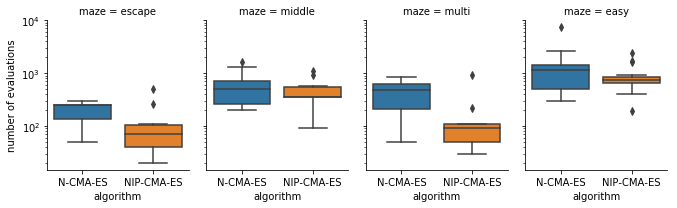

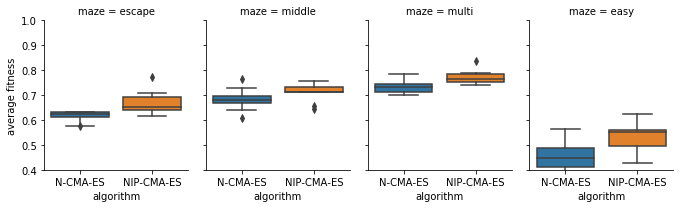

In [176]:
list_dir = [["/home/leni/are-logs/are_cmaes_escape/",
            "/home/leni/are-logs/are_cmaes_middle/",
            "/home/leni/are-logs/are_cmaes_multi/",
            "/home/leni/are-logs/are_cmaes_easy/"],
           ["/home/leni/are-logs/are_ipop_escape/",
            "/home/leni/are-logs/are_ipop_middle/",
            "/home/leni/are-logs/are_ipop_multi/",
            "/home/leni/are-logs/are_ipop_easy/"]]
list_label = ["N-CMA-ES", "NIP-CMA-ES"]
maze_name =  ["escape","middle","multi","easy"]
target = [[0.75,0.75],[0.,0.5],[0,-0.5],[0.75,0.75]]

lines = []
i = 0
for dire in list_dir[0] :
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[0],maze_name[i]])
    i+=1
    
 
i = 0
for dire in list_dir[1] :
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[1],maze_name[i]])
    i+=1
    
    
d = pd.DataFrame(data=lines,columns=["average fitness","number of evaluations","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples",data=d,col="maze",kind="box",aspect=0.8,height=3)
ax1.set(yscale = "log")
ax3 = sns.catplot(x="algorithm",y="average fitness",data=d,col="maze",kind="box",aspect=0.8,height=3)
ax3.set(ylim=[0.4,1])



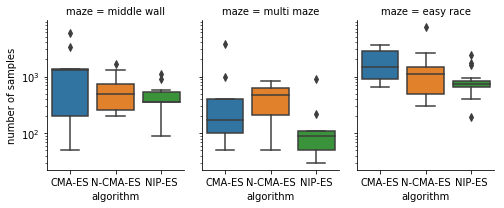

In [41]:
list_dir = [["/home/leni/are-logs/are_cmaes_nonov_middle/",
            "/home/leni/are-logs/are_cmaes_nonov_multi/",
            "/home/leni/are-logs/are_cmaes_nonov_easy/"],
           ["/home/leni/are-logs/are_cmaes_middle/",
            "/home/leni/are-logs/are_cmaes_multi/",
            "/home/leni/are-logs/are_cmaes_easy/"],
           ["/home/leni/are-logs/are_ipop_middle/",
               "/home/leni/are-logs/are_ipop_multi/",
            "/home/leni/are-logs/are_ipop_easy/"]]
list_label = ["CMA-ES", "N-CMA-ES","NIP-ES"]
maze_name =  ["middle wall","multi maze","easy race"]
target = [[0.75,0.75],[0.,0.5],[0,-0.5],[0.75,0.75]]

lines = []
i = 0
for dire in list_dir[0] :
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[0],maze_name[i]])
    i+=1
    
 
i = 0
for dire in list_dir[1] :
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[1],maze_name[i]])
    i+=1
  
i = 0
for dire in list_dir[2] :
    for folder in os.listdir(dire) :
        if(folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        lines.append([max(avg_fit),neval[-1],sum(eval_time),list_label[2],maze_name[i]])
    i+=1
    
d = pd.DataFrame(data=lines,columns=["average fitness","number of samples","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples",data=d,col="maze",kind="box",aspect=0.8,height=3)
ax1.set(yscale = "log")



easy race 3027.0 2842.2211384760335 5738.646141851397 5371.731605980971
race 5981.0 2802.493354140202 9092.363840558599 4293.9852035837075
hard race 7886.0 2200.41905099915 11612.271411371 2823.673205506533


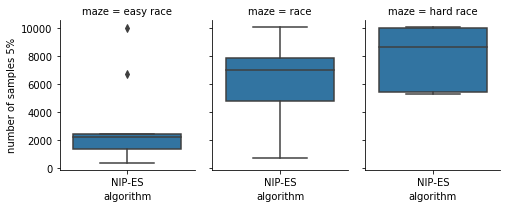

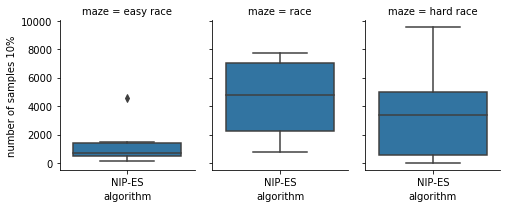

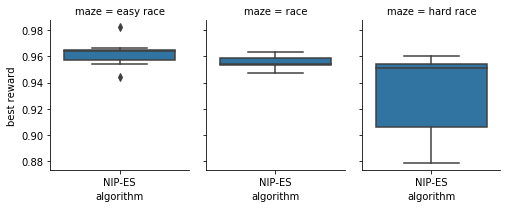

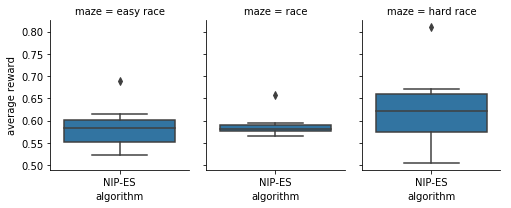

In [10]:
list_dir = [["/home/leni/are-logs/are_ipop_easy/",
            "/home/leni/are-logs/are_ipop_race/",
            "/home/leni/are-logs/are_ipop_hard/"]]
list_label = ["NIP-ES"]
maze_name =  ["easy race","race","hard race"]
target = [[0.75,0.75],[0.75,0.75],[0.75,0.75]]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90) :
                neval_10 = ne
                break
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[0],maze_name[i]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples 5%",data=d,col="maze",kind="box",aspect=0.8,height=3)


ax1 = sns.catplot(x="algorithm",y="number of samples 10%",data=d,col="maze",kind="box",aspect=0.8,height=3)


ax1 = sns.catplot(x="algorithm",y="best reward",data=d,col="maze",kind="box",aspect=0.8,height=3)

ax1 = sns.catplot(x="algorithm",y="average reward",data=d,col="maze",kind="box",aspect=0.8,height=3)



ipop_cmaes_6_4_13-40-16-6065_111684073


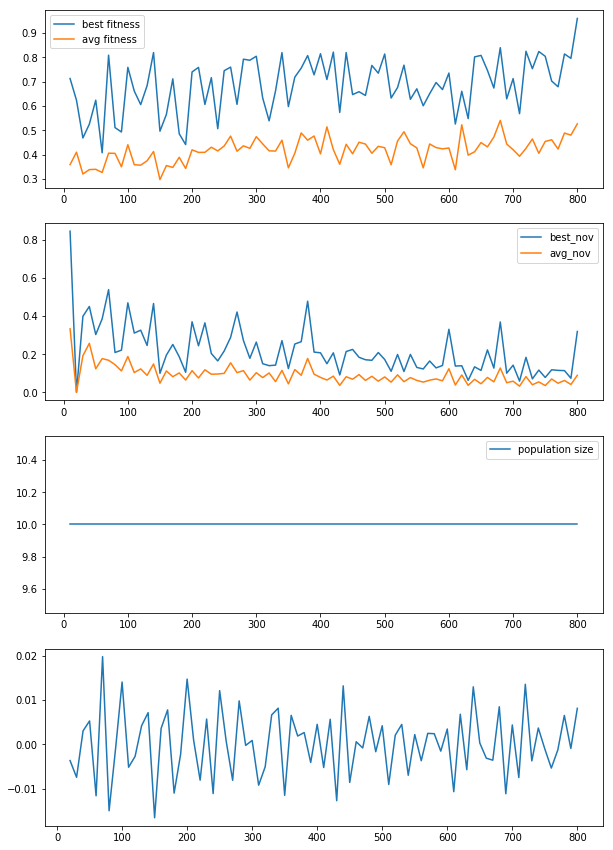

ipop_cmaes_6_4_13-40-16-6317_3565424279


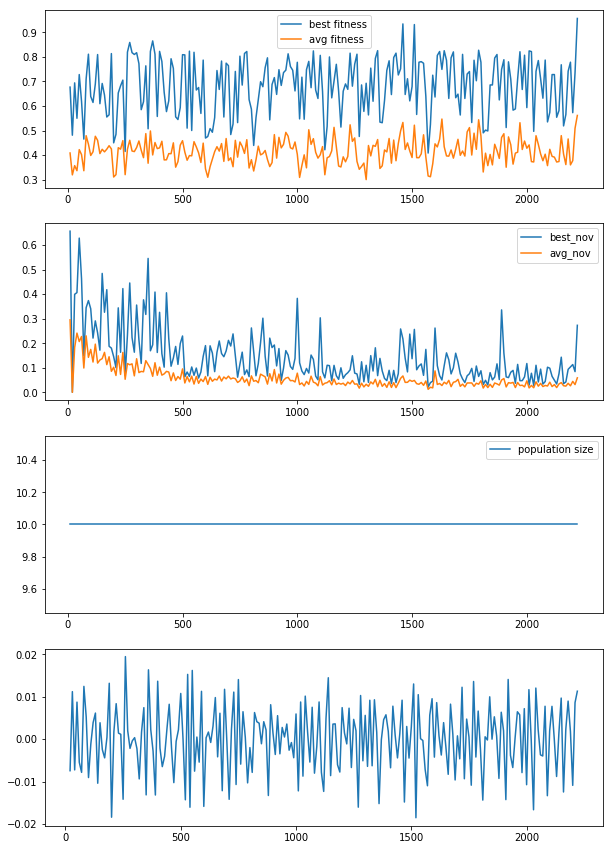

ipop_cmaes_6_4_13-40-18-8157_2128567191


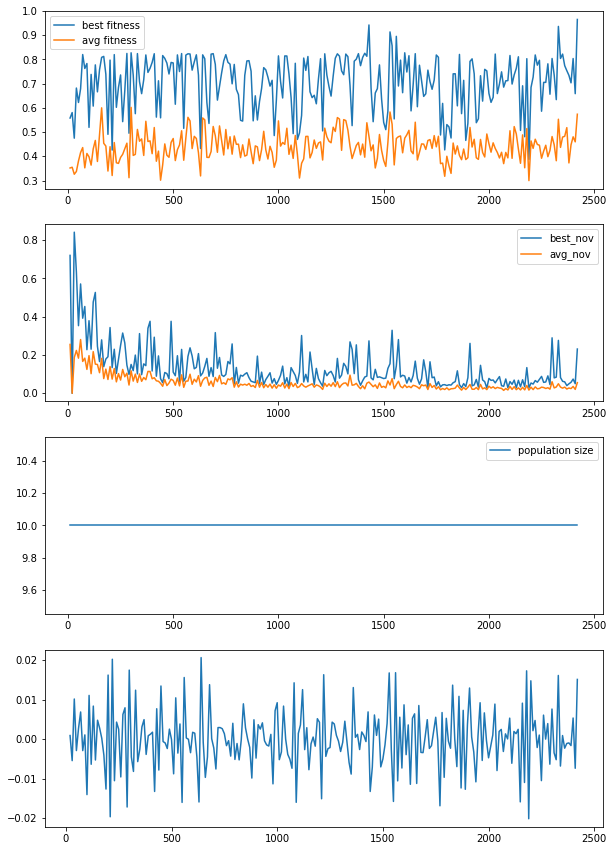

ipop_cmaes_6_4_13-40-22-2914_1160474162


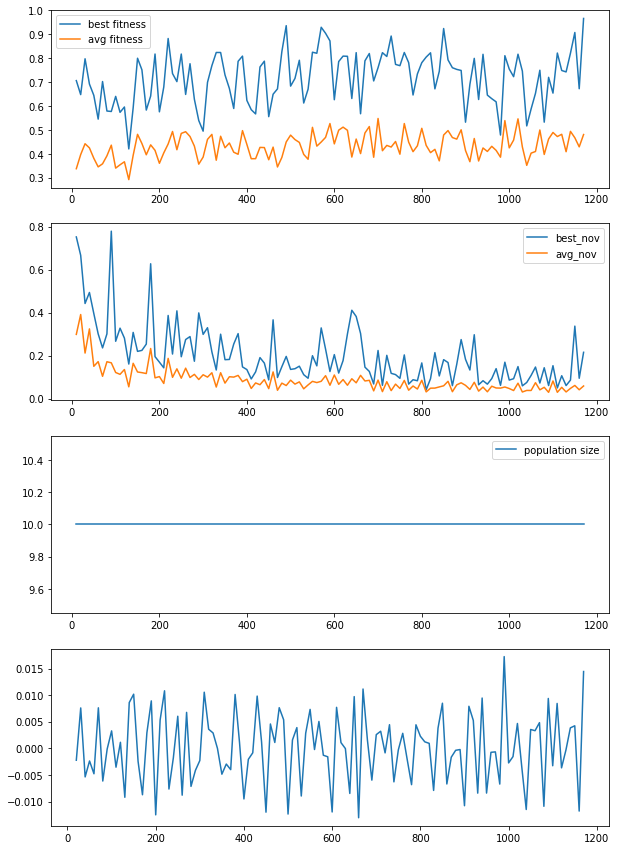

ipop_cmaes_6_4_13-40-3-3260_627544173


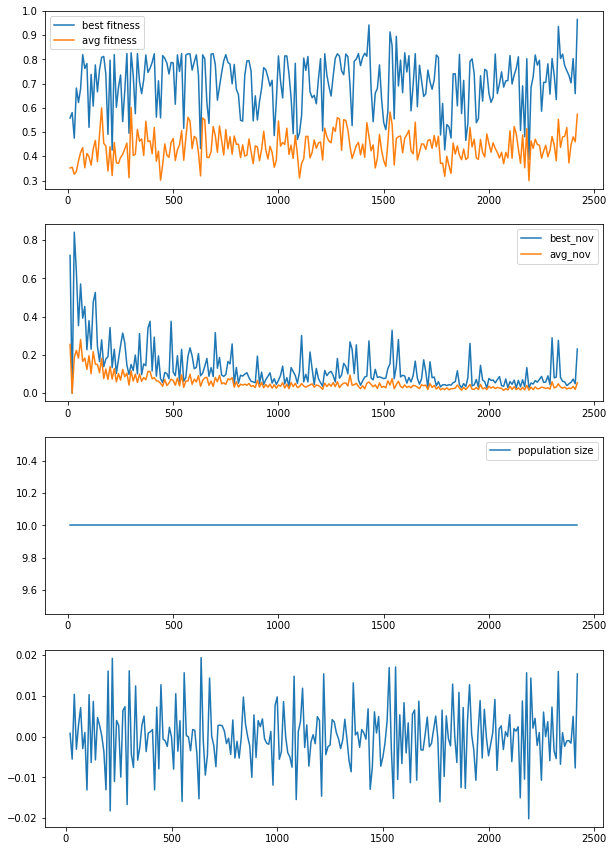

ipop_cmaes_6_4_13-40-1-1240_1537912718


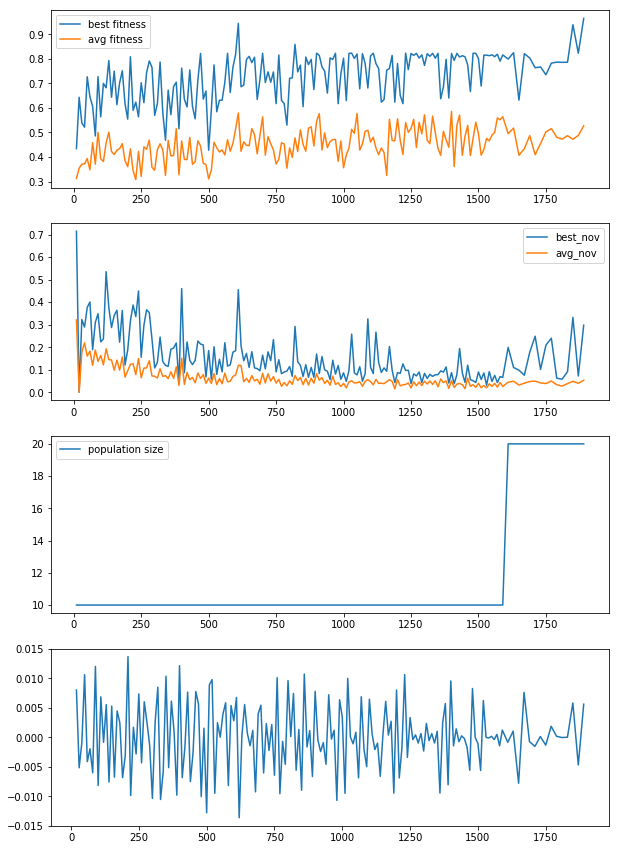

ipop_cmaes_6_4_13-40-21-1224_4180972859


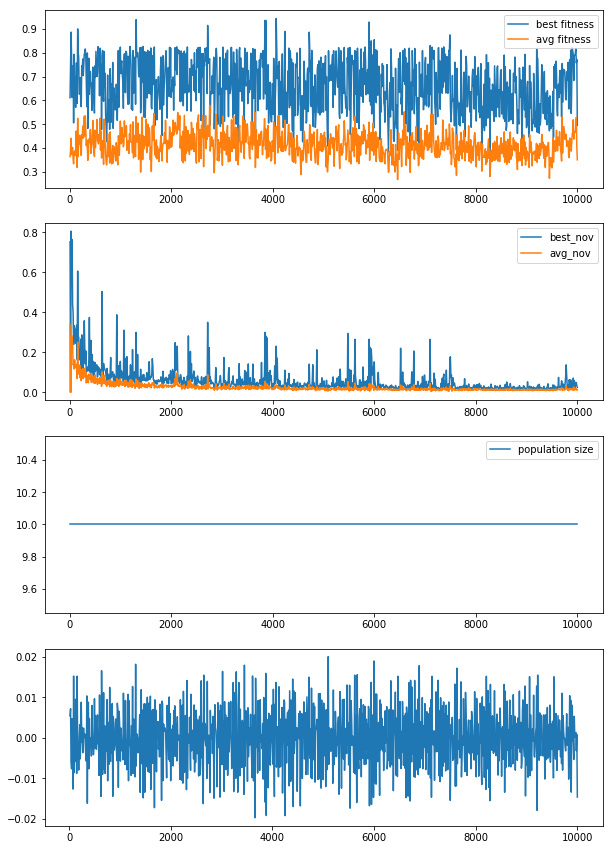

ipop_cmaes_6_4_13-40-25-5183_1327994706


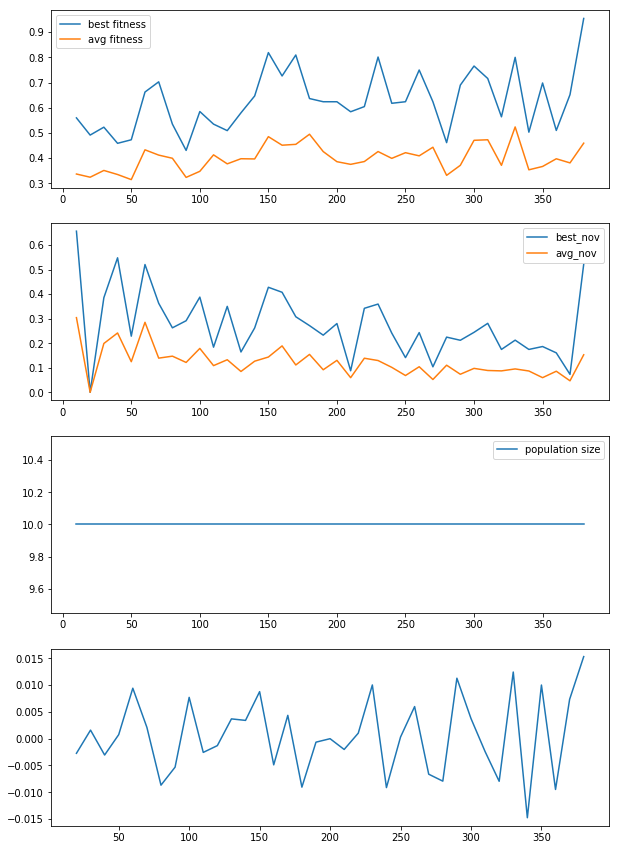

ipop_cmaes_6_4_13-40-20-10_2645861940


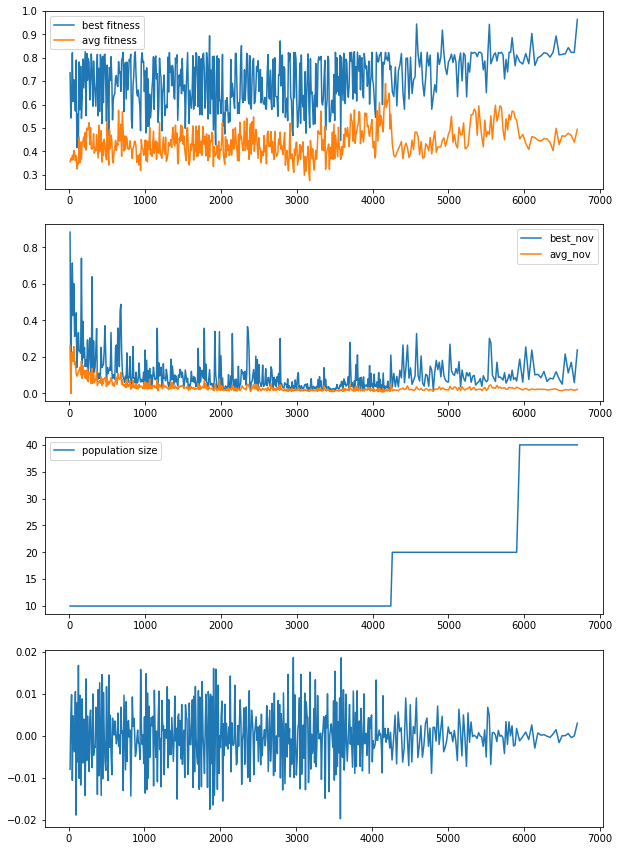

ipop_cmaes_6_4_13-40-12-2467_2651269743


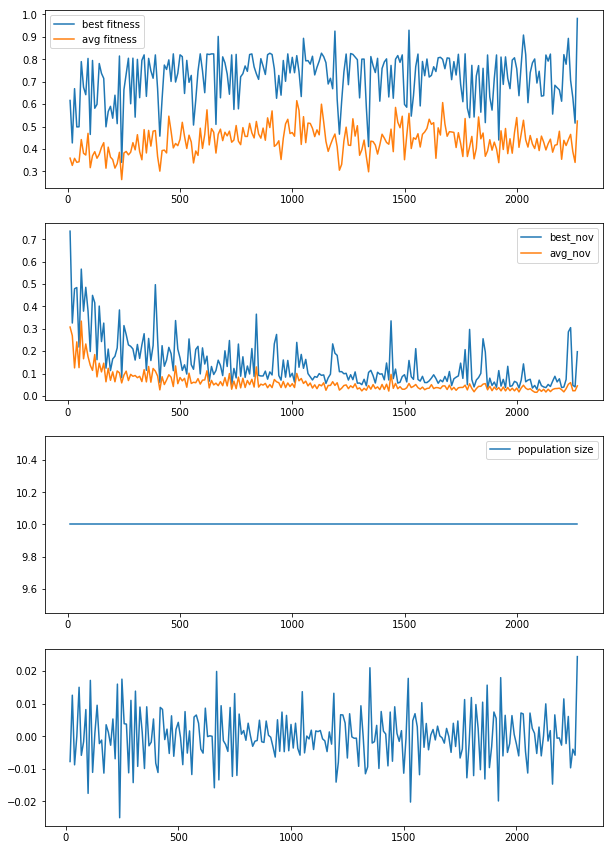

In [10]:
are_ipop_easy = "/home/leni/are-logs/are_ipop_easy/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy) :
    if(not os.path.isdir(are_ipop_easy + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_easy + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_easy + folder,pop_size,1)

ipop_cmaes_6_4_13-41-29-9378_3539034826


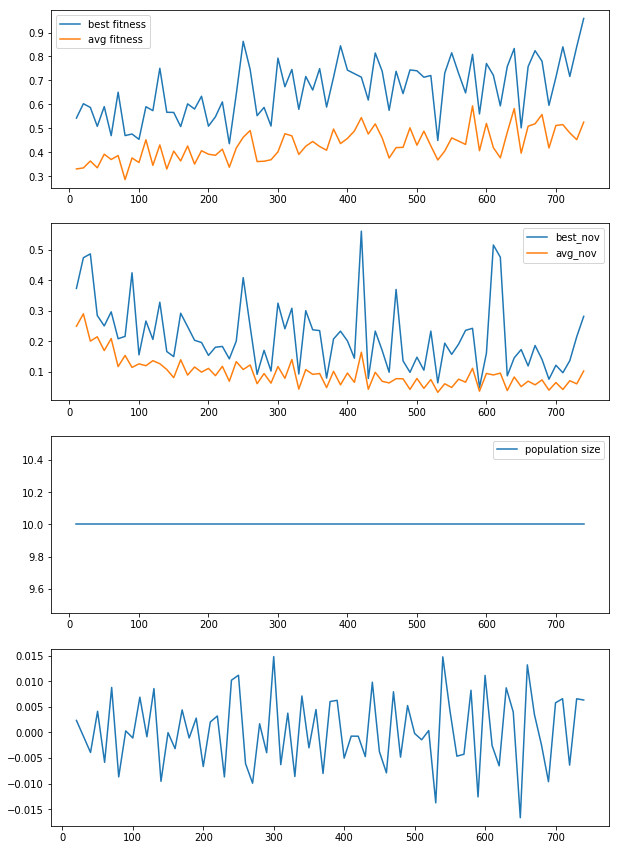

ipop_cmaes_6_4_13-53-59-9417_890126783


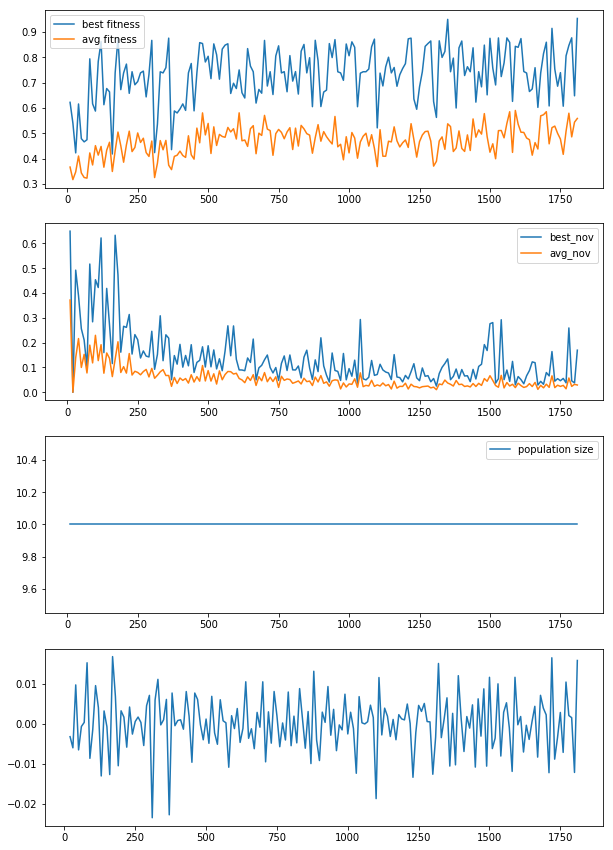

ipop_cmaes_6_4_13-41-36-6225_1900951810


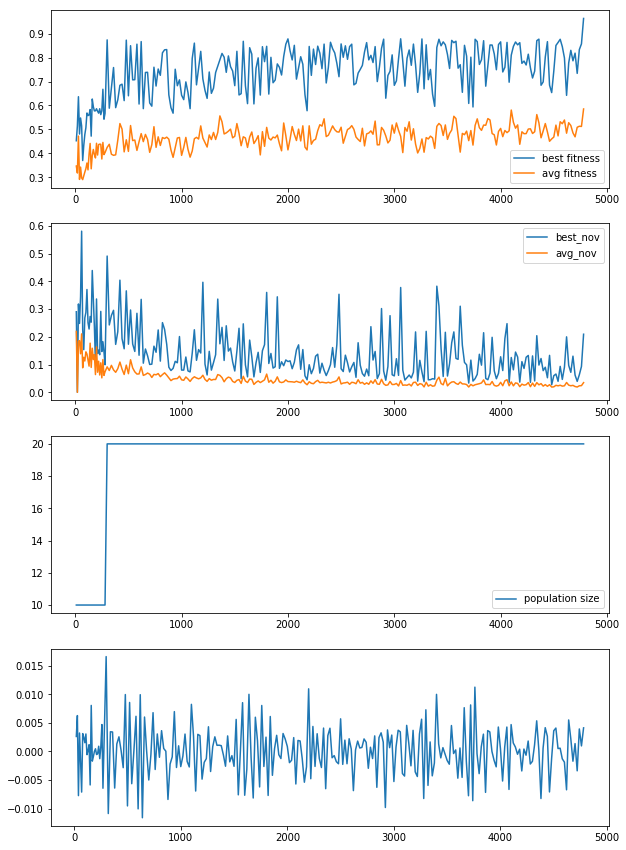

ipop_cmaes_6_4_13-41-21-1836_1029831905


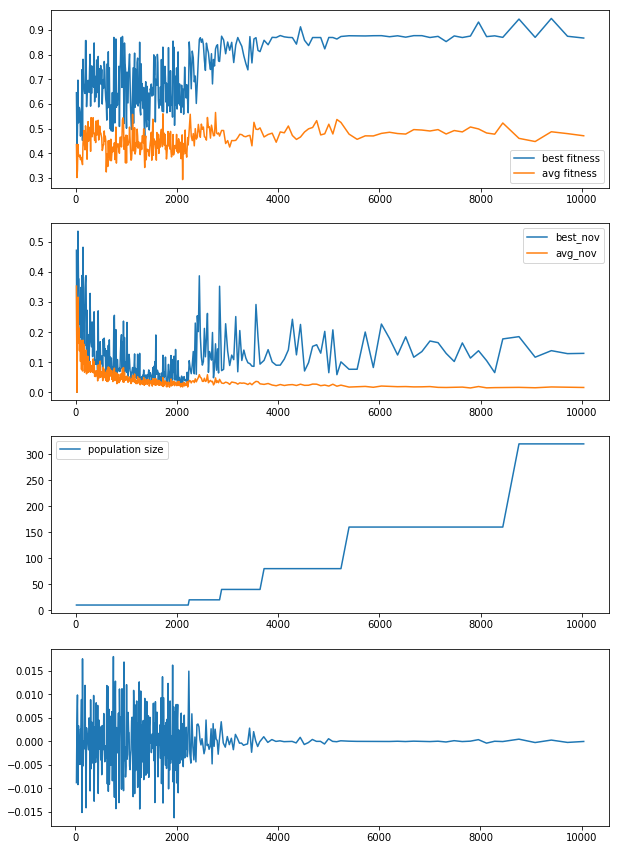

ipop_cmaes_6_4_13-41-15-5894_2704000190


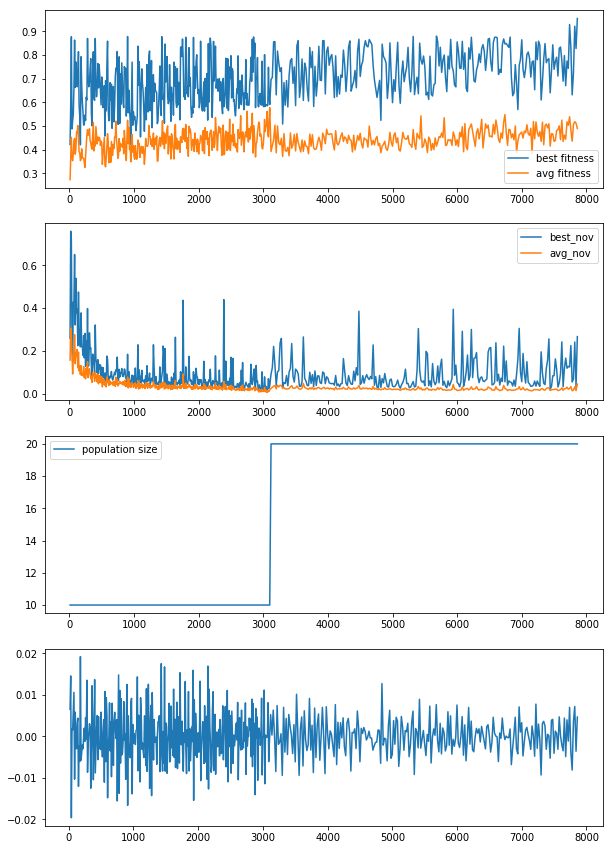

ipop_cmaes_6_4_13-41-7-7279_1552823109


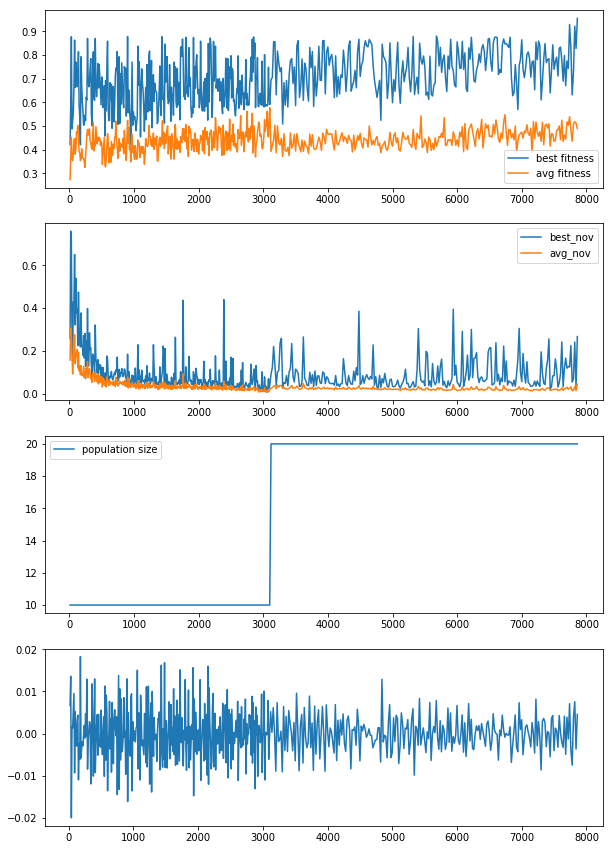

ipop_cmaes_6_4_13-41-25-5211_1335603390


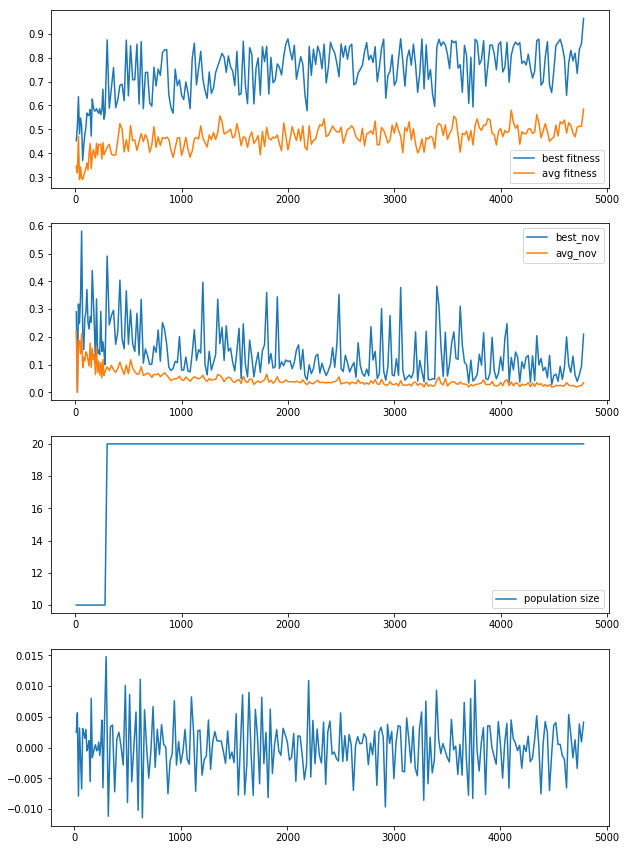

ipop_cmaes_6_4_13-41-15-5767_1115036762


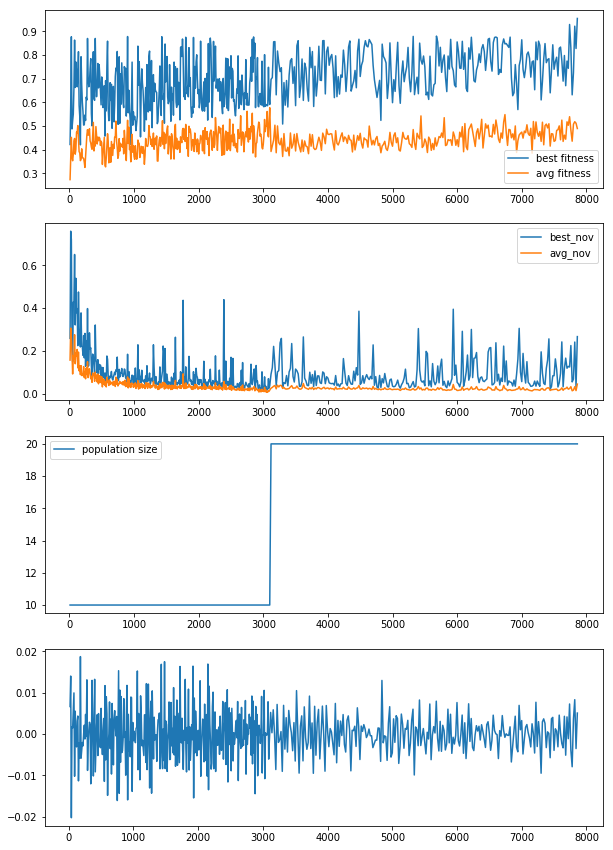

ipop_cmaes_6_4_13-40-56-6297_2045237753


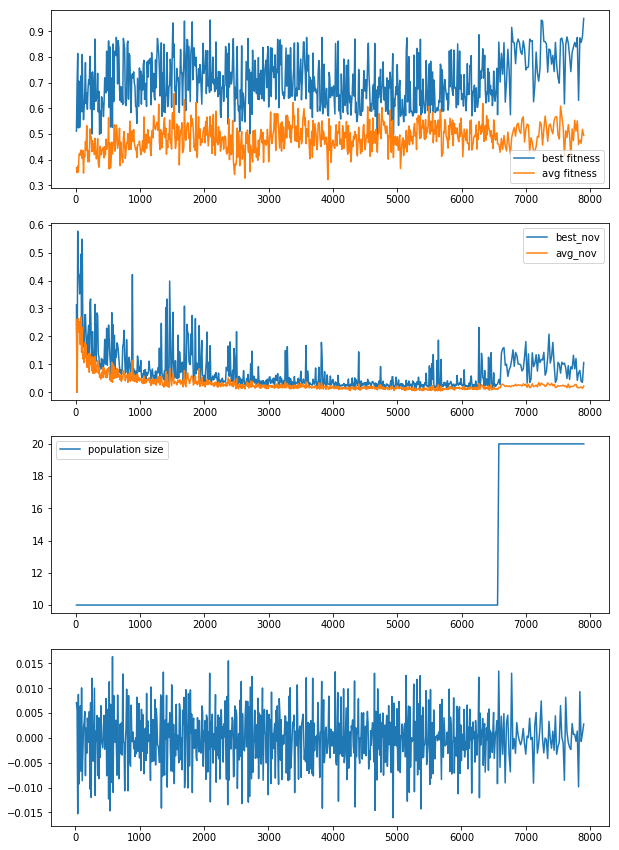

ipop_cmaes_6_4_13-41-26-6418_3572715300


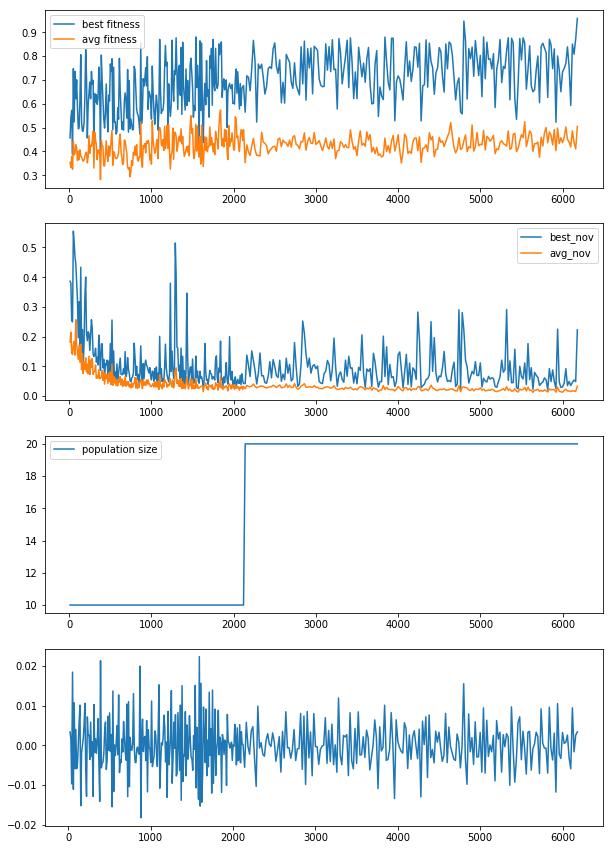

In [9]:
are_ipop_race = "/home/leni/are-logs/are_ipop_race/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_race) :
    if(not os.path.isdir(are_ipop_race + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_race + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_race + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_race + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_race + folder,pop_size,1)

ipop_cmaes_6_4_15-51-4-4298_3869720266


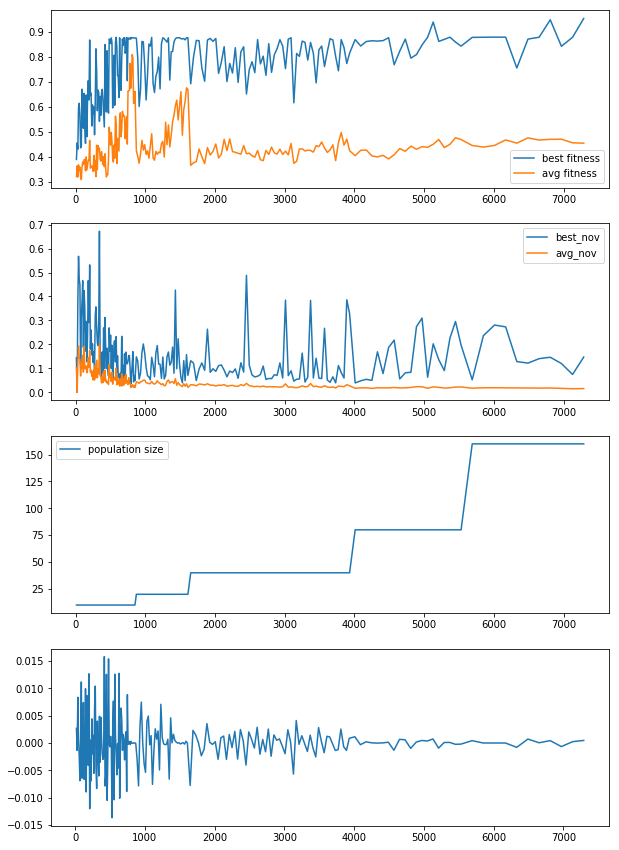

ipop_cmaes_6_4_15-51-36-6472_2428129234


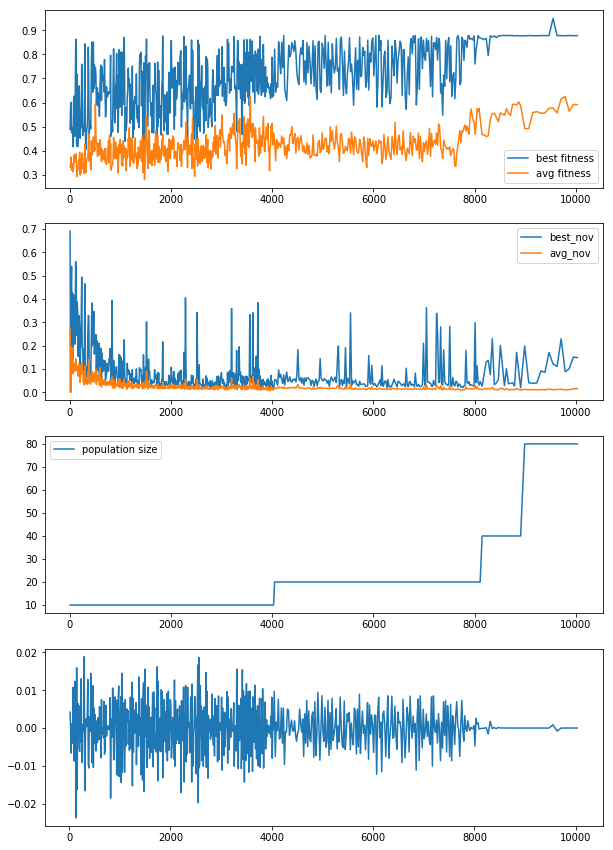

ipop_cmaes_6_4_15-51-14-4237_3085508651


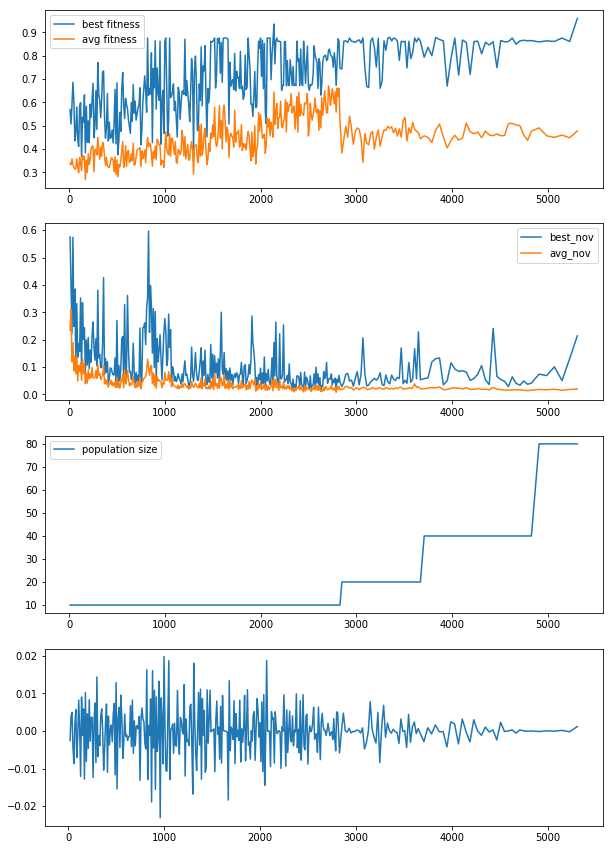

ipop_cmaes_6_4_15-51-35-5046_25665595


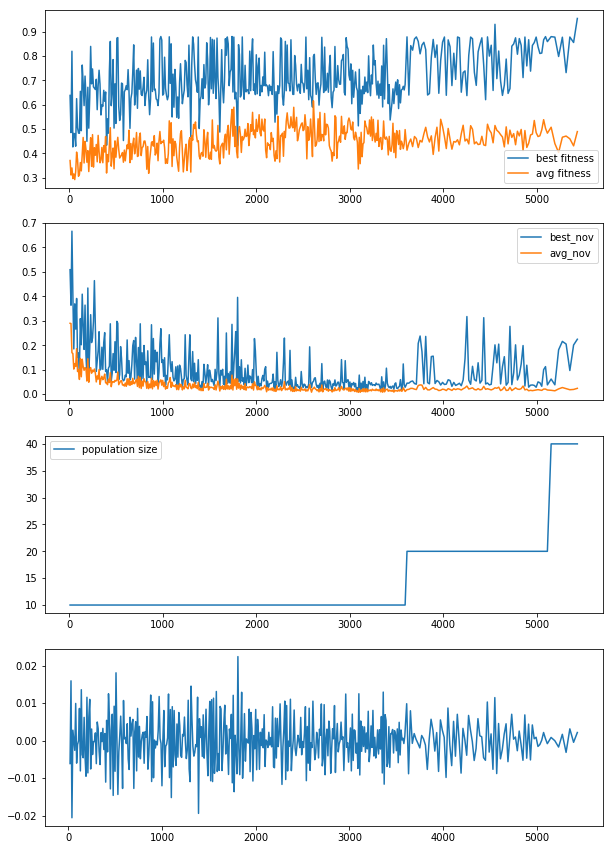

ipop_cmaes_6_4_15-51-26-6153_1320822013


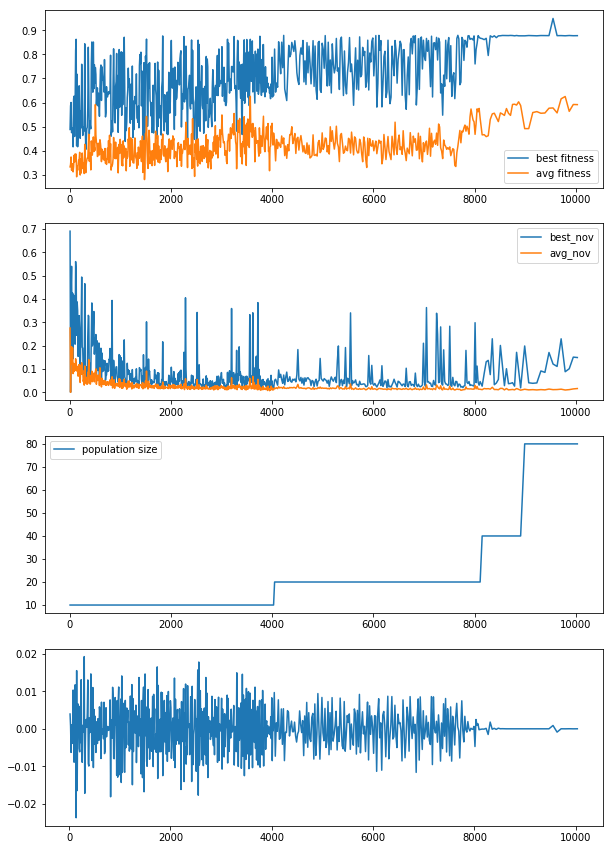

ipop_cmaes_6_4_15-51-18-8536_3178170816


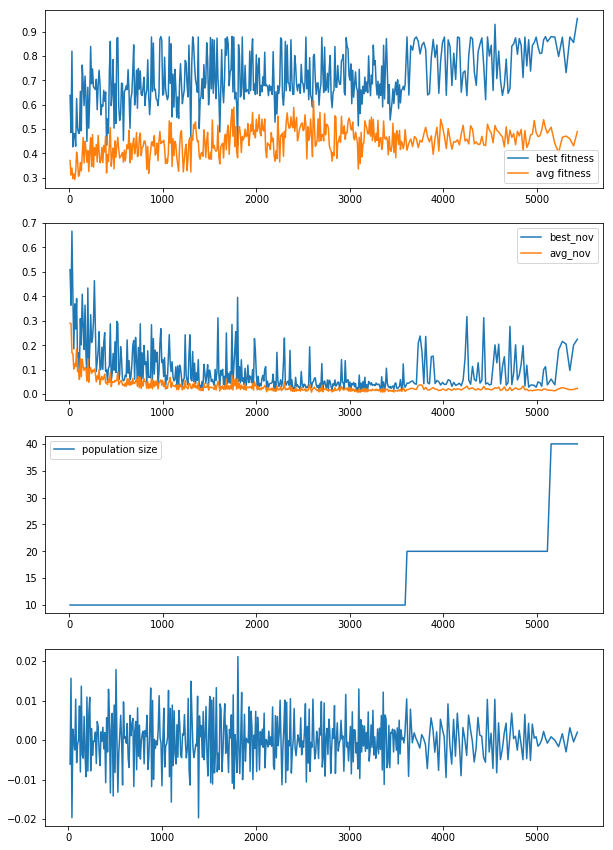

ipop_cmaes_6_4_15-51-34-4204_3972030329


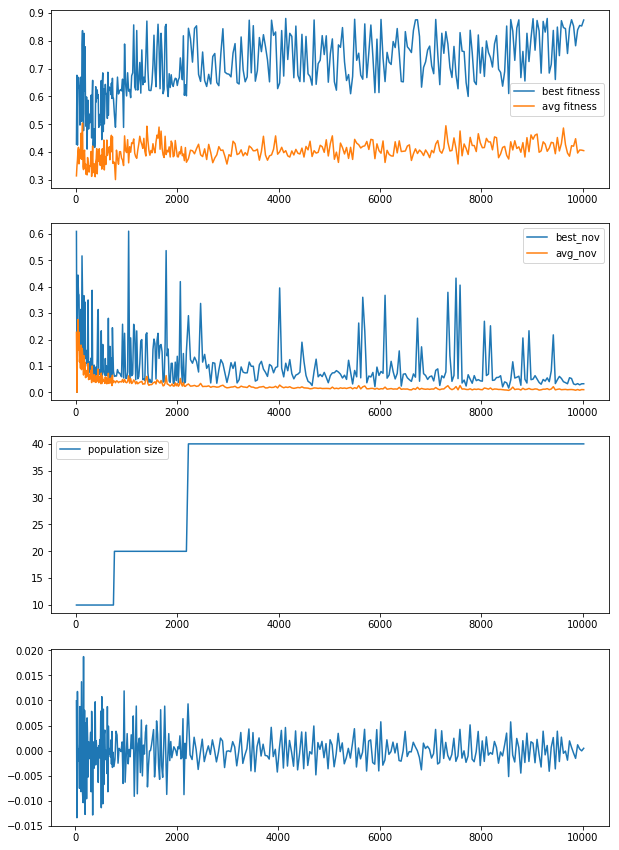

ipop_cmaes_6_4_15-51-23-3815_3889046063


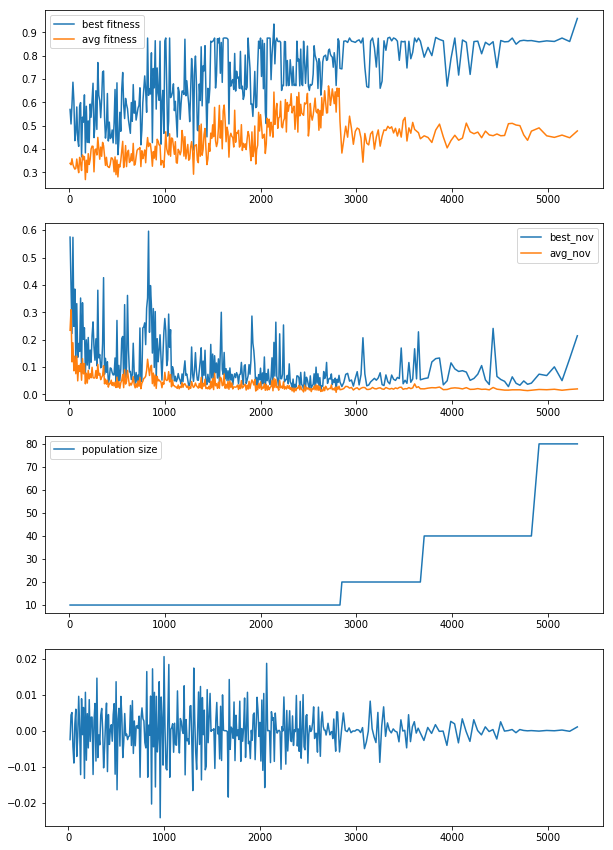

ipop_cmaes_6_4_15-51-19-9184_4178317395


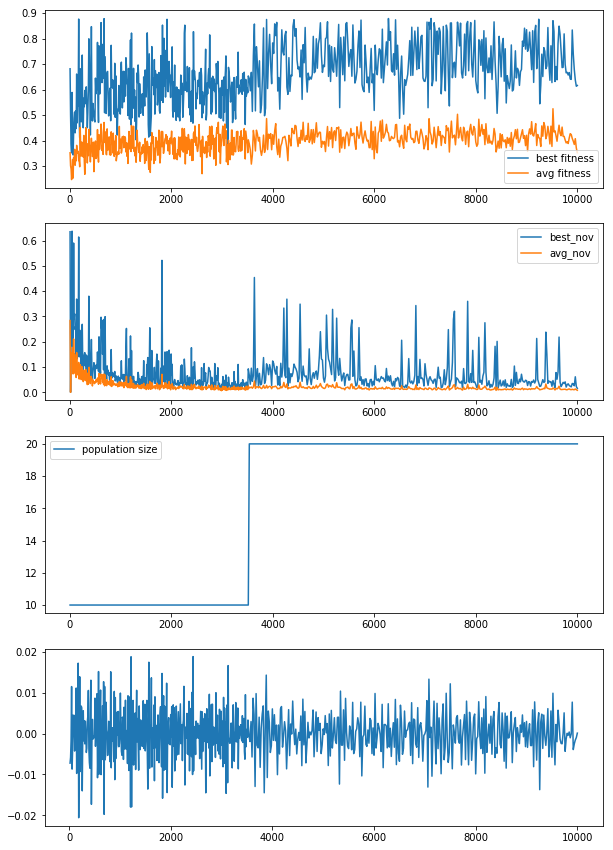

ipop_cmaes_6_4_15-51-32-2149_3395966080


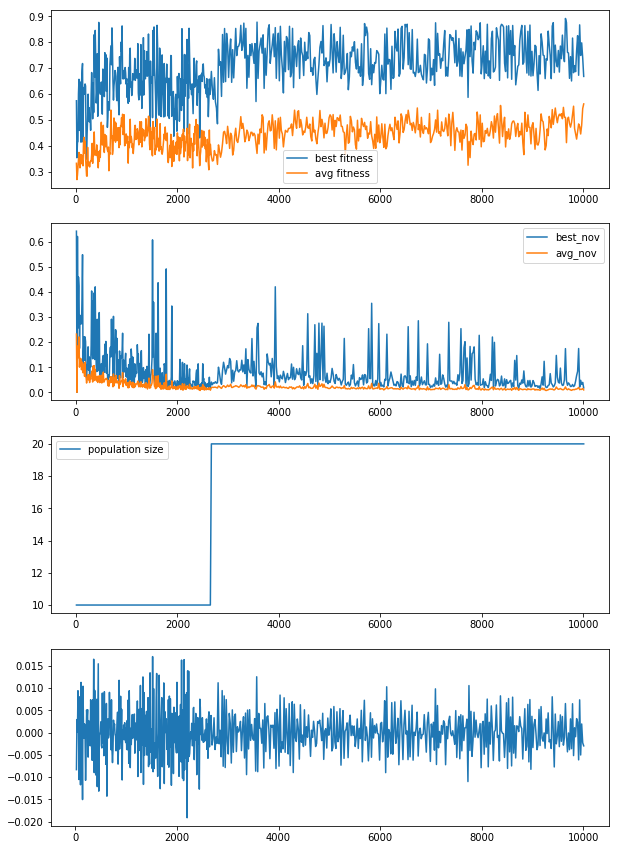

In [11]:
are_ipop_hard = "/home/leni/are-logs/are_ipop_hard/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_hard) :
    if(not os.path.isdir(are_ipop_hard + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_hard + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_hard + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_hard + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_hard + folder,pop_size,1)

easy race 4728.0 2029.038195796225 8869.555196668702 3836.6210080676788
race 5835.0 3439.9687498580565 8395.249685223402 4239.964526765466
middle wall 345.0 184.6753908889866 594.4529023459 288.88714025717854
hard race 9188.0 1487.674695624013 13568.933138652103 2865.3716213636576


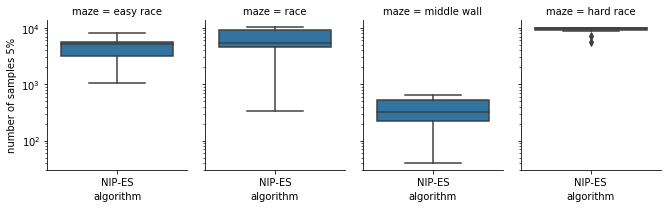

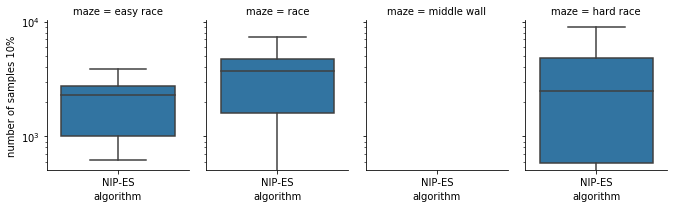

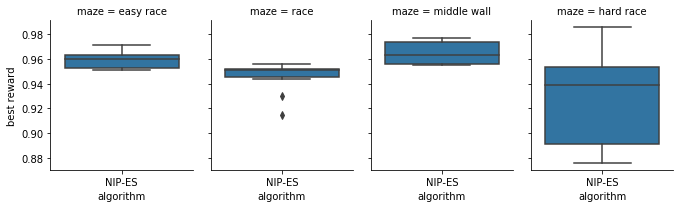

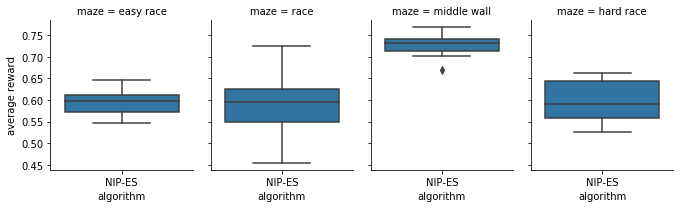

In [9]:
list_dir = [["/home/leni/are-logs/are_ipop_elman_easy/",
            "/home/leni/are-logs/are_ipop_elman_race/",
            "/home/leni/are-logs/are_ipop_elman_middle/",
            "/home/leni/are-logs/are_ipop_elman_hard/"]]
list_label = ["NIP-ES"]
maze_name =  ["easy race","race","middle wall","hard race"]
target = [[0.75,0.75],[0.75,0.75],[0.,0.5],[0.75,0.75]]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90) :
                neval_10 = ne
                break
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[0],maze_name[i]])
    print(maze_name[i],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples 5%",data=d,col="maze",kind="box",aspect=0.8,height=3)
ax1.set(yscale = "log")

ax1 = sns.catplot(x="algorithm",y="number of samples 10%",data=d,col="maze",kind="box",aspect=0.8,height=3)
ax1.set(yscale = "log")


ax1 = sns.catplot(x="algorithm",y="best reward",data=d,col="maze",kind="box",aspect=0.8,height=3)

ax1 = sns.catplot(x="algorithm",y="average reward",data=d,col="maze",kind="box",aspect=0.8,height=3)



ipop_cmaes_8_4_9-12-20-46_199057471


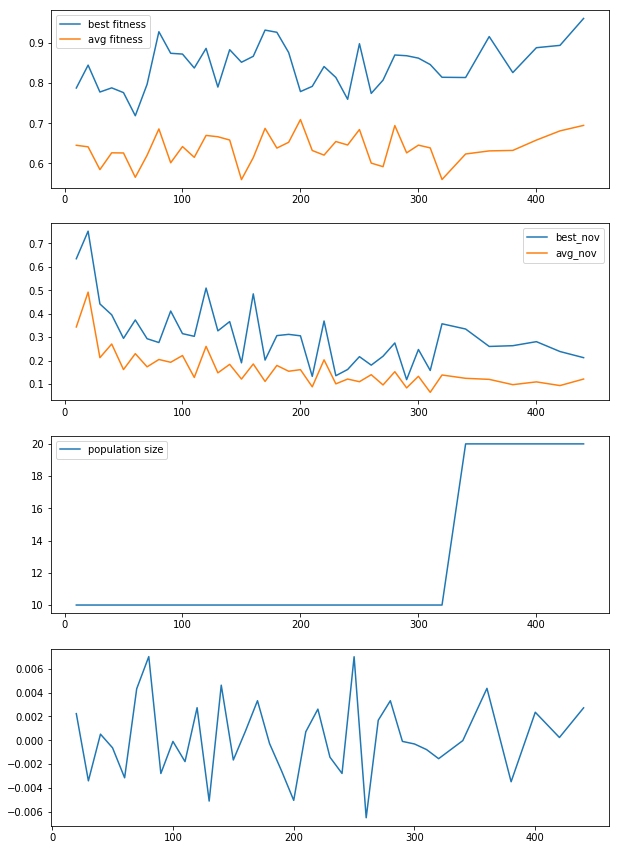

ipop_cmaes_8_4_9-9-57-7572_2728118365


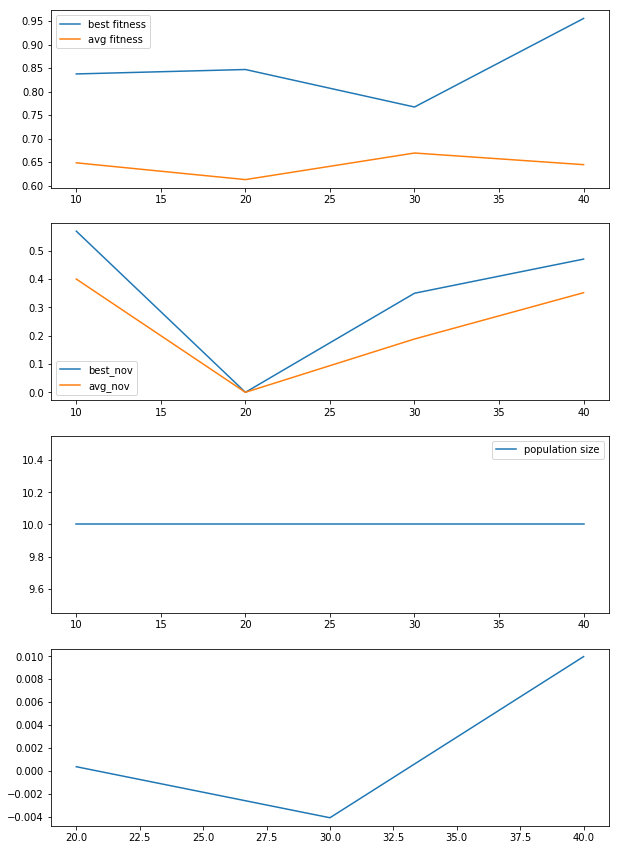

ipop_cmaes_8_4_9-10-15-5518_2671414445


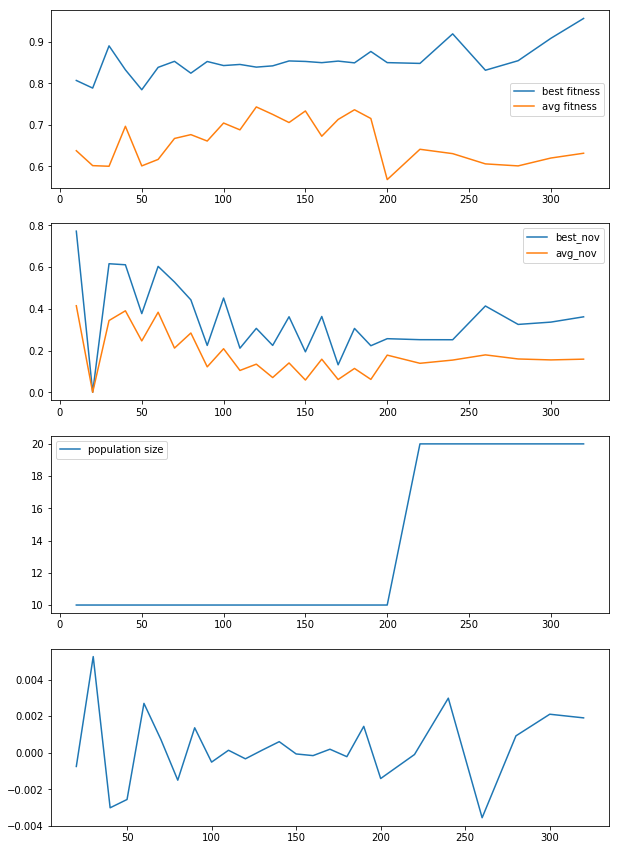

ipop_cmaes_8_4_9-10-4-4534_1198826396


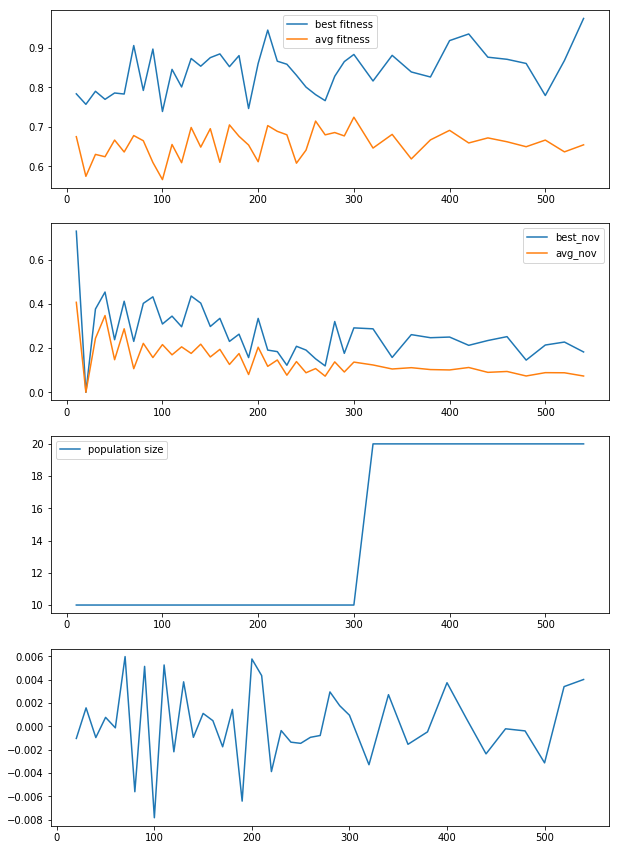

ipop_cmaes_8_4_9-10-4-4579_1181764529


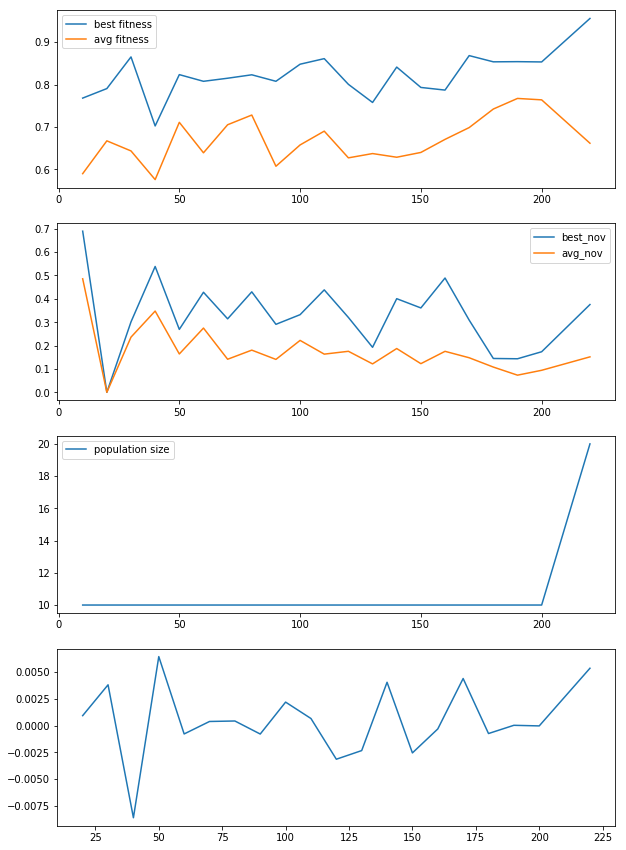

ipop_cmaes_8_4_9-10-16-6688_2560356535


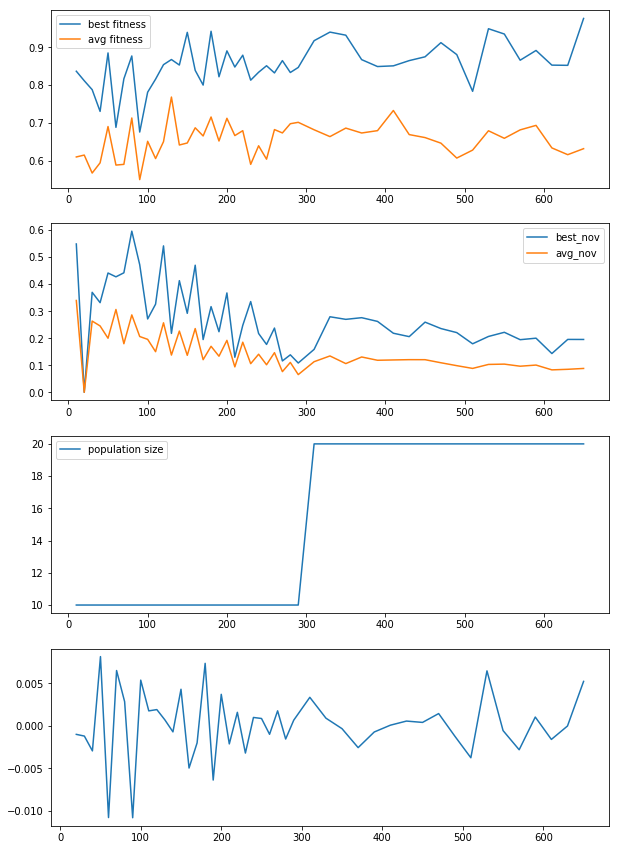

ipop_cmaes_8_4_9-10-12-2356_1568947336


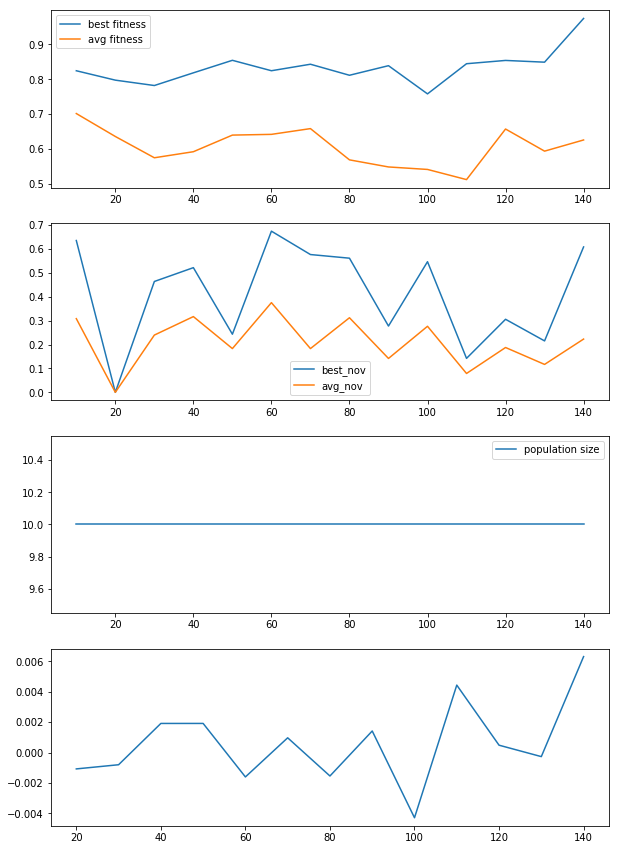

ipop_cmaes_8_4_9-10-1-1507_3352290221


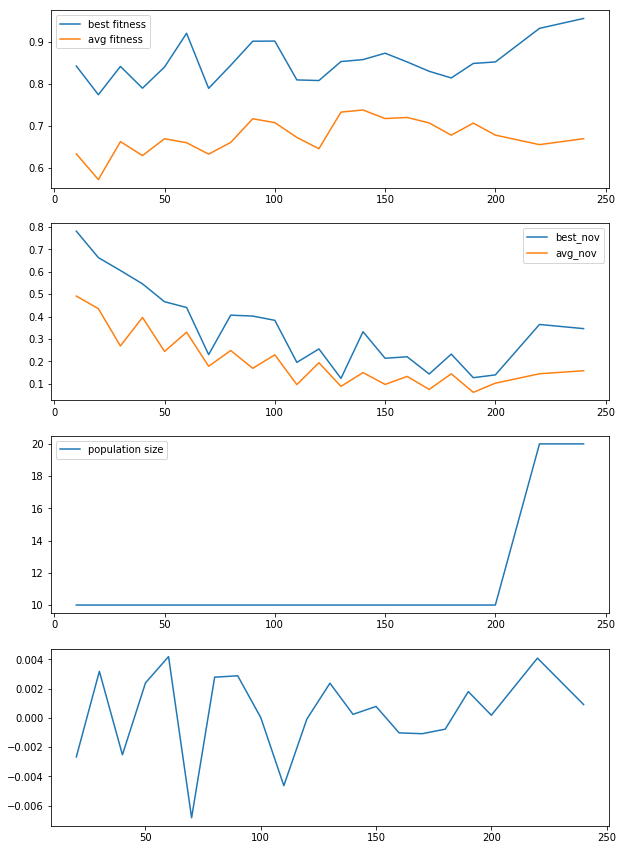

ipop_cmaes_8_4_9-10-14-4358_2097054122


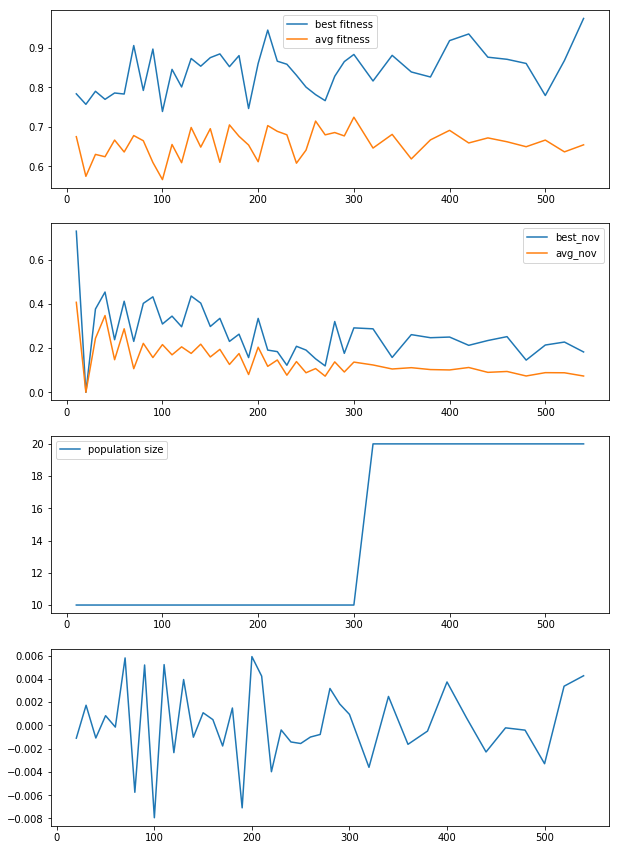

ipop_cmaes_8_4_9-10-2-2551_3078390615


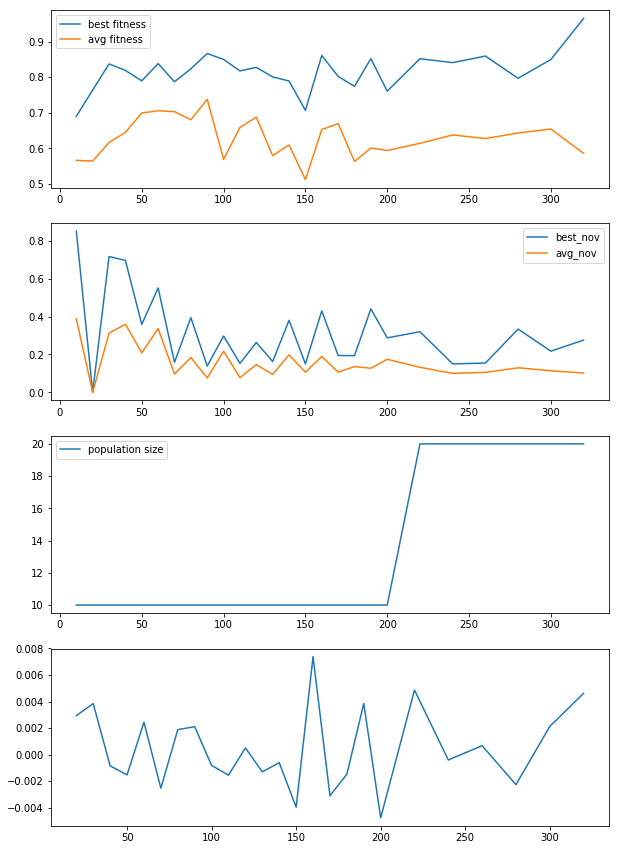

In [5]:
are_ipop_elman_middle = "/home/leni/are-logs/are_ipop_elman_middle/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_elman_middle) :
    if(not os.path.isdir(are_ipop_elman_middle + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_elman_middle + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_elman_middle + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_elman_middle + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_elman_middle + folder,pop_size,1)

hard race 9188.0 1487.674695624013 13568.933138652103 2865.3716213636576
hard race 9722.222222222223 519.6746370519364 10561.846821216111 586.9040758837593
hard race 6308.0 3106.412078266501 7165.3643156665985 3075.860936485624


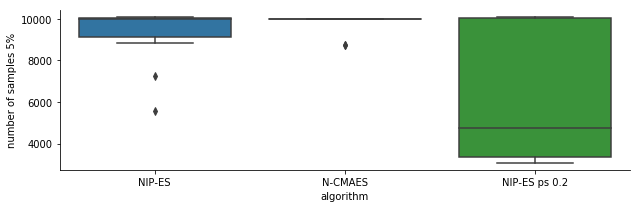

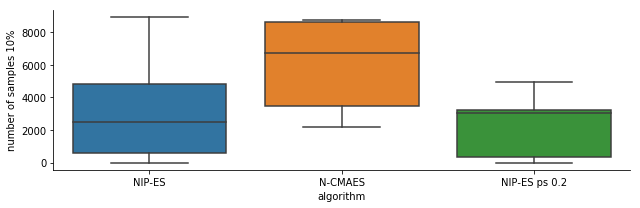

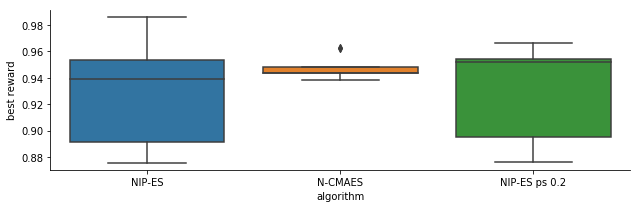

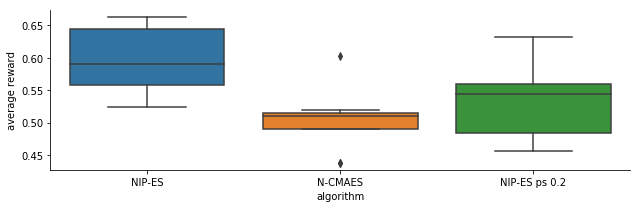

In [35]:
list_dir = [["/home/leni/are-logs/are_ipop_elman_hard/",
            "/home/leni/are-logs/are_cmaes_elman_hard/",
            "/home/leni/are-logs/are_ipop_hard_popstag02/"]]
list_label = ["NIP-ES","N-CMAES","NIP-ES ps 0.2"]
maze_name =  ["hard race"]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90) :
                neval_10 = ne
                break
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[i],maze_name[0]])
    print(maze_name[0],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples 5%",data=d,kind="box",aspect=3,height=3)
#ax1.set(yscale = "log")

ax1 = sns.catplot(x="algorithm",y="number of samples 10%",data=d,kind="box",aspect=3,height=3)#
#ax1.set(yscale = "log")


ax1 = sns.catplot(x="algorithm",y="best reward",data=d,kind="box",aspect=3,height=3)

ax1 = sns.catplot(x="algorithm",y="average reward",data=d,kind="box",aspect=3,height=3)

easy race 2595.0 1230.497866718996 3902.9473717188 1647.3360222099104
easy race 3027.0 2842.2211384760335 5738.646141851397 5371.731605980971
easy race 4807.0 4179.693888312875 5356.833418132301 4161.729090307868
easy race 2225.0 1340.3824081209063 2337.0838053125 1414.7666665133504


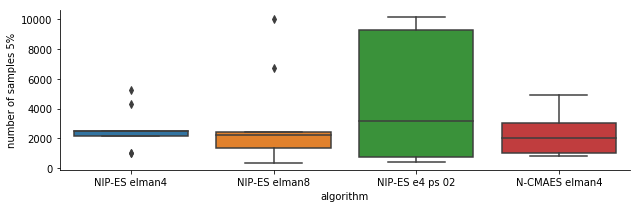

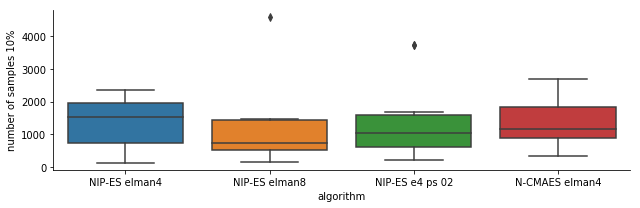

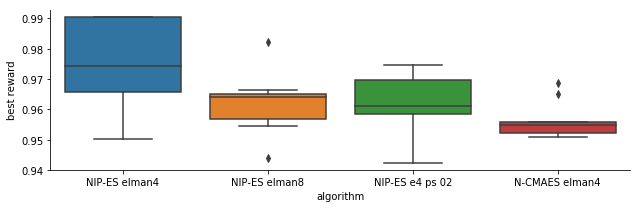

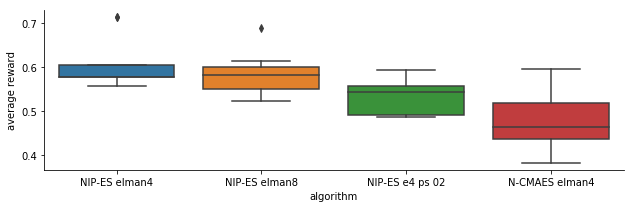

In [33]:
list_dir = [["/home/leni/are-logs/are_ipop_elman4_easy/",
             "/home/leni/are-logs/are_ipop_easy/",
             "/home/leni/are-logs/are_ipop_easy_popstag02/",
            "/home/leni/are-logs/are_cmaes_elman4_easy/"]]
list_label = ["NIP-ES elman4","NIP-ES elman8","NIP-ES e4 ps 02","N-CMAES elman4"]
maze_name =  ["easy race"]
target = [[0.75,0.75]]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90 or ne >= 10000) :
                neval_10 = ne
                break
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[i],maze_name[0]])
    print(maze_name[0],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples 5%",data=d,kind="box",aspect=3,height=3)
#ax1.set(yscale = "log")

ax1 = sns.catplot(x="algorithm",y="number of samples 10%",data=d,kind="box",aspect=3,height=3)#
#ax1.set(yscale = "log")


ax1 = sns.catplot(x="algorithm",y="best reward",data=d,kind="box",aspect=3,height=3)

ax1 = sns.catplot(x="algorithm",y="average reward",data=d,kind="box",aspect=3,height=3)

ipop_cmaes_11_4_15-10-4-4231_487488036


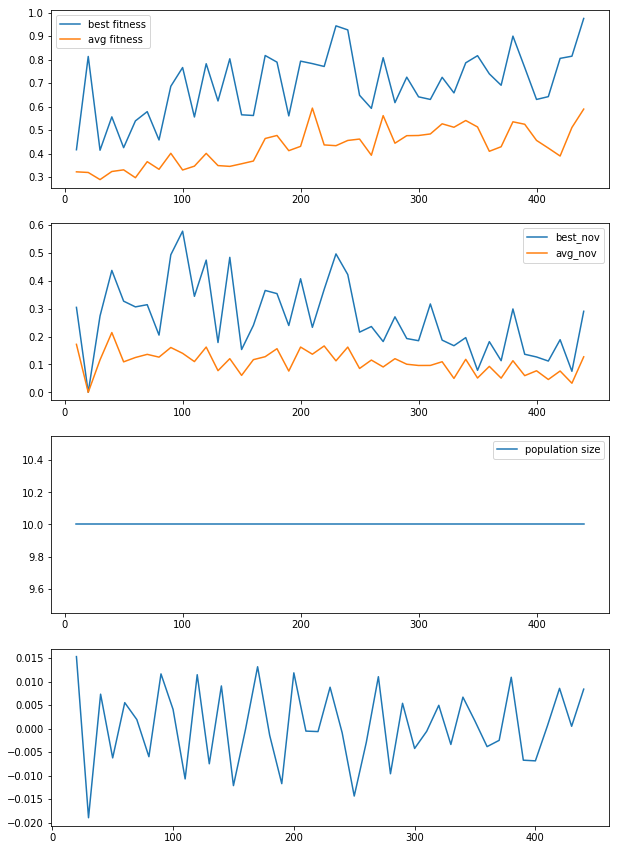

ipop_cmaes_11_4_15-9-54-4864_3753219560


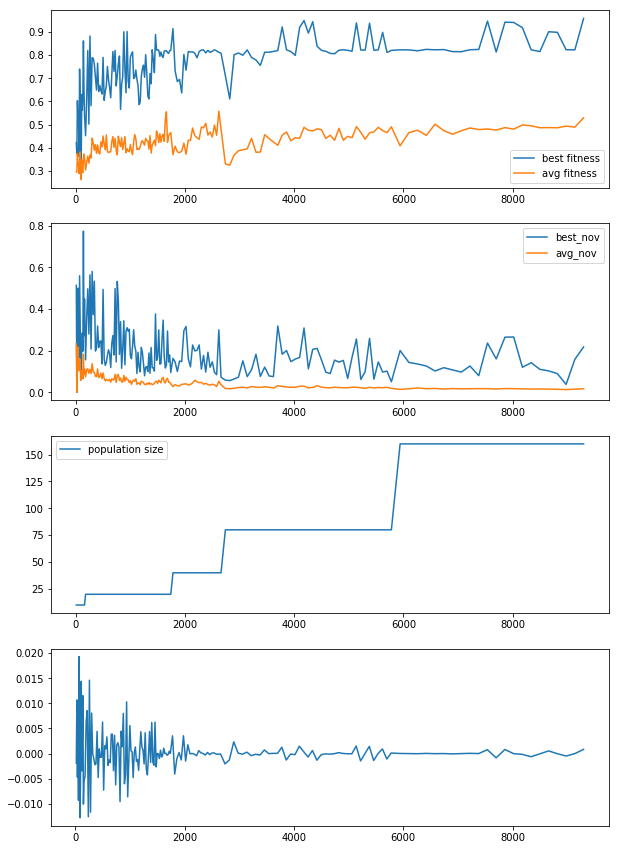

ipop_cmaes_11_4_15-9-57-7996_3156102504


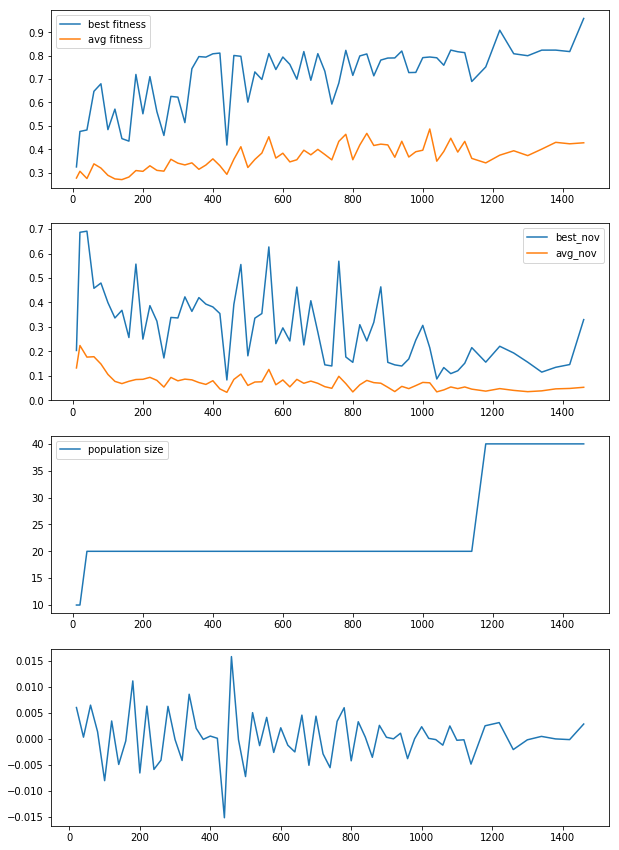

ipop_cmaes_11_4_15-9-58-8953_915306519


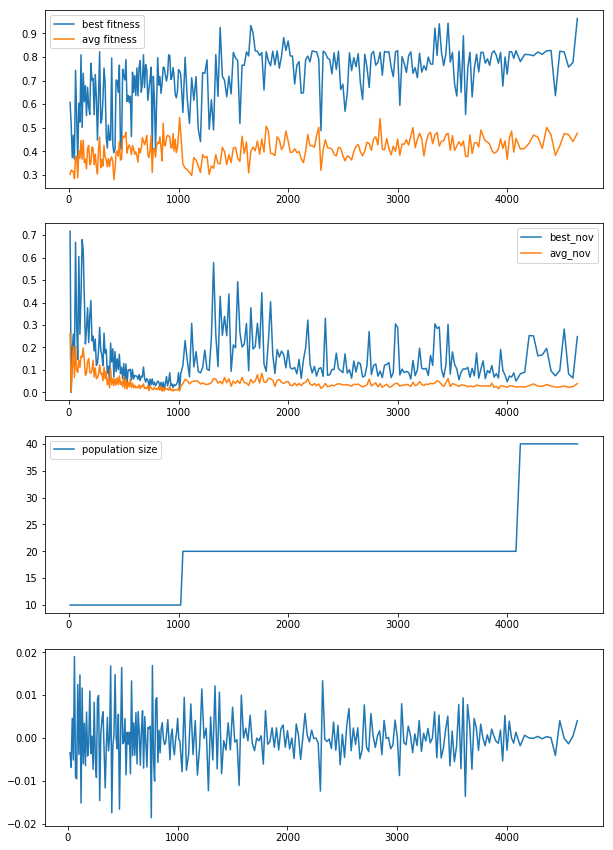

ipop_cmaes_11_4_15-10-4-4994_3133473116


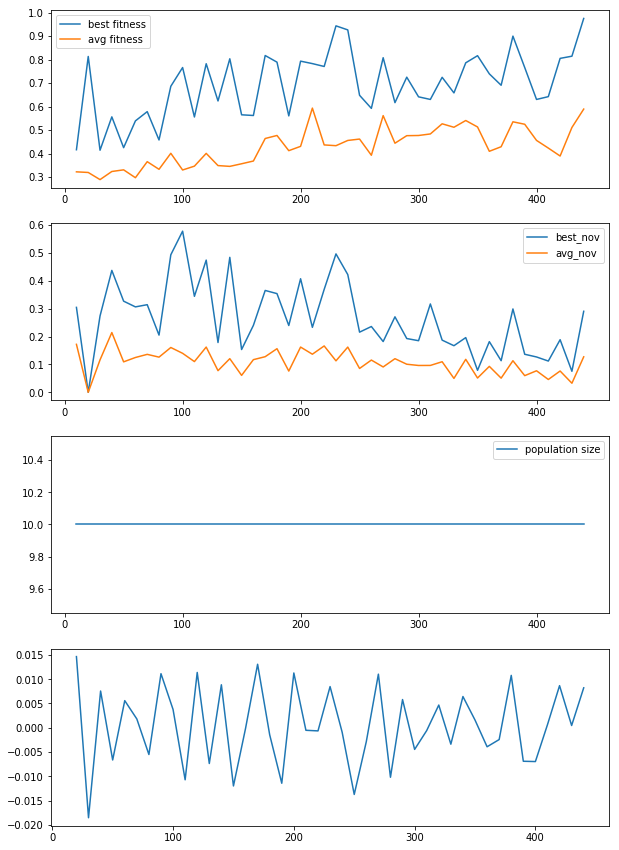

ipop_cmaes_11_4_15-10-7-7094_167646959


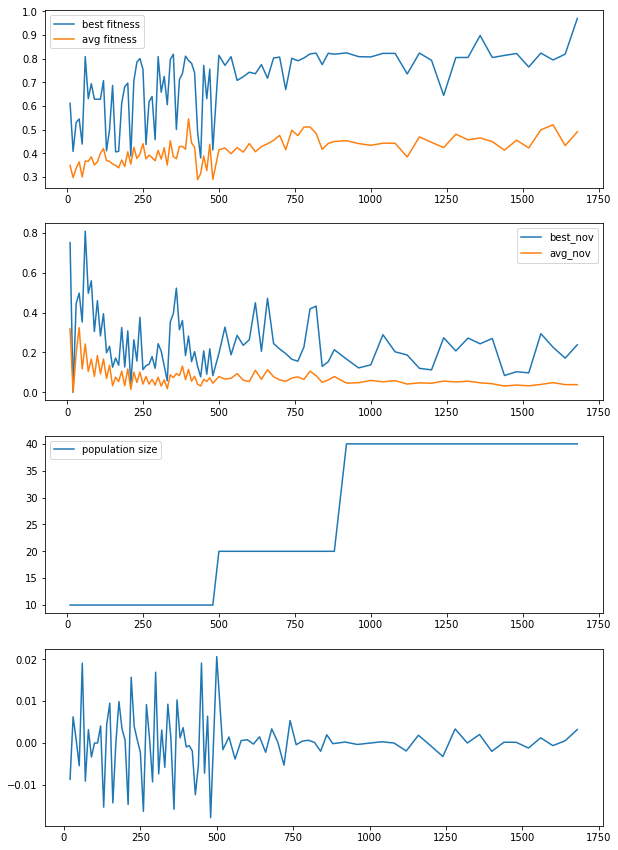

ipop_cmaes_11_4_15-10-0-211_3643600995


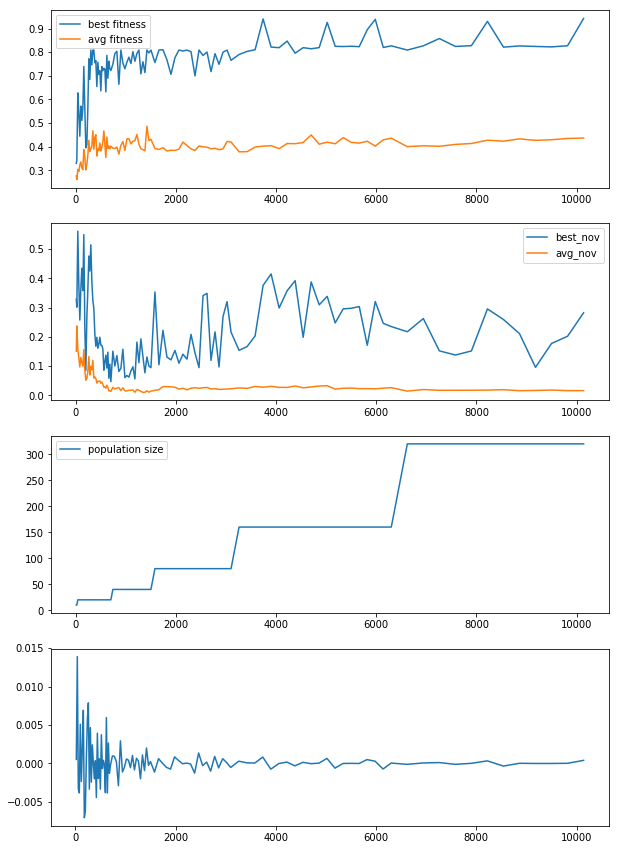

ipop_cmaes_11_4_15-9-59-9710_592447578


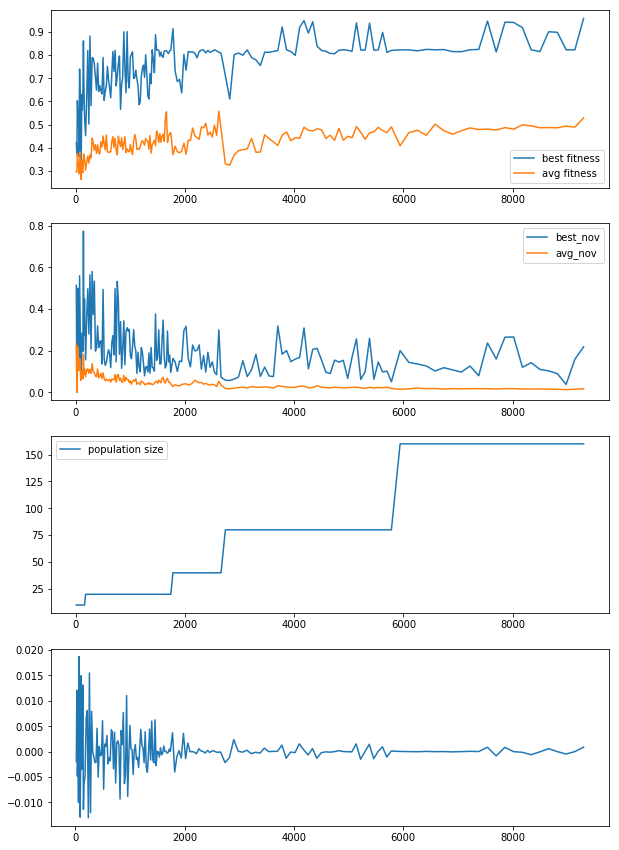

ipop_cmaes_11_4_15-10-2-2496_3519233111


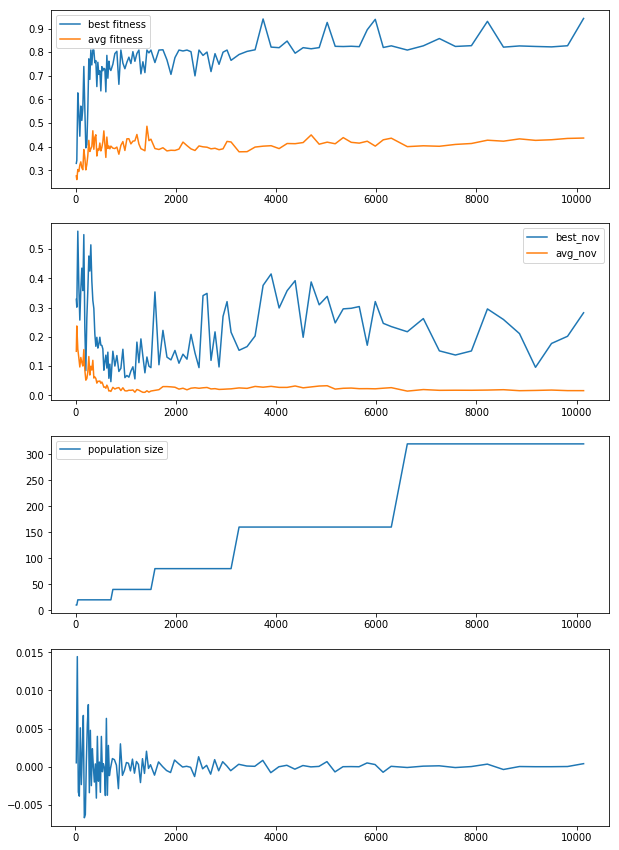

ipop_cmaes_11_4_15-10-6-6678_1184387211


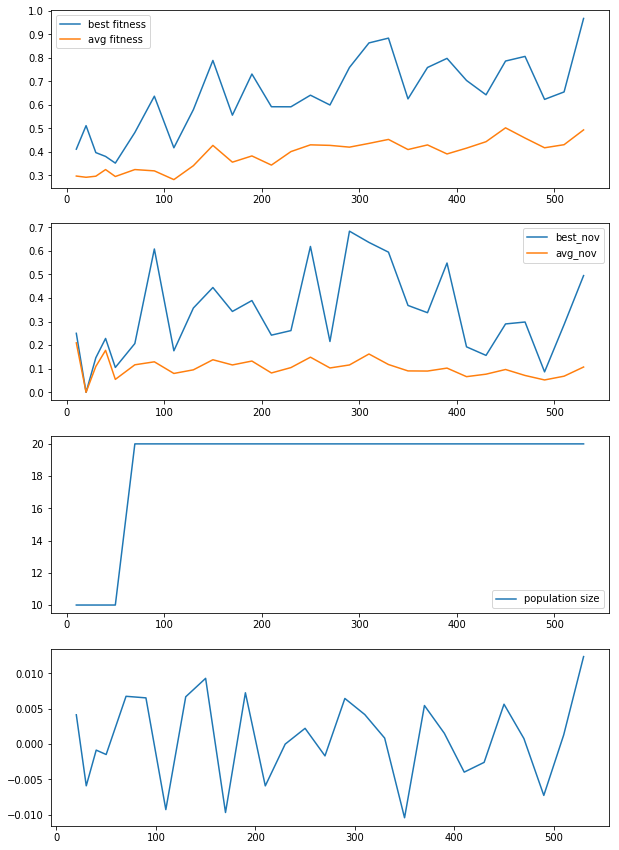

In [17]:
are_ipop_easy_popstag02 = "/home/leni/are-logs/are_ipop_easy_popstag02/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_easy_popstag02) :
    if(not os.path.isdir(are_ipop_easy_popstag02 + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_easy_popstag02 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_easy_popstag02 + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_easy_popstag02 + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    #animation_pop(are_ipop_easy_popstag02 + folder,pop_size,1)

ipop_cmaes_6_4_15-51-4-4298_3869720266


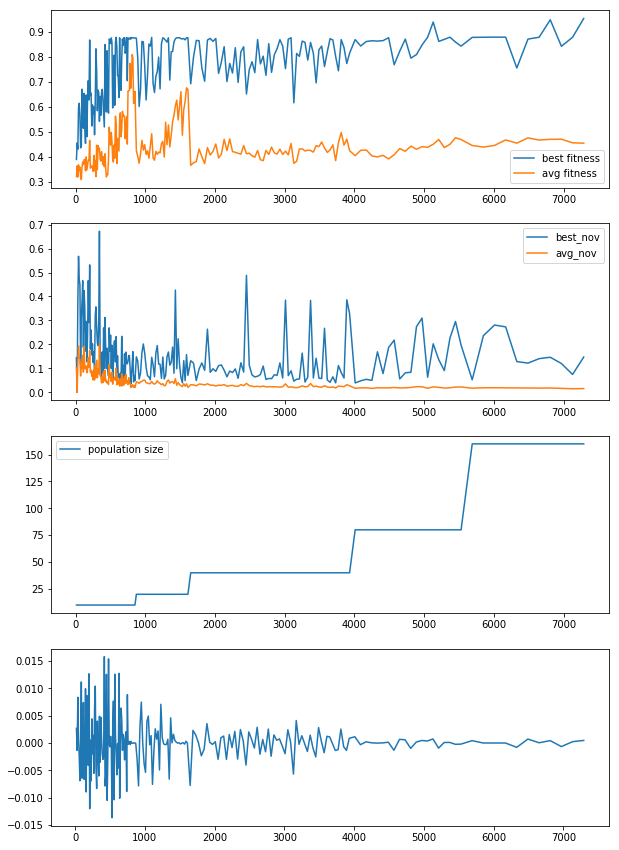

ipop_cmaes_6_4_15-51-36-6472_2428129234


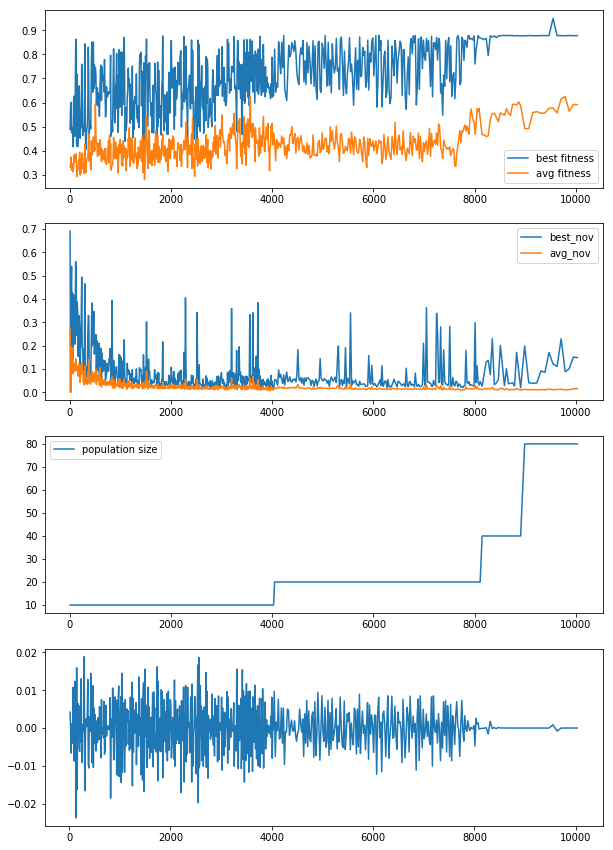

ipop_cmaes_6_4_15-51-14-4237_3085508651


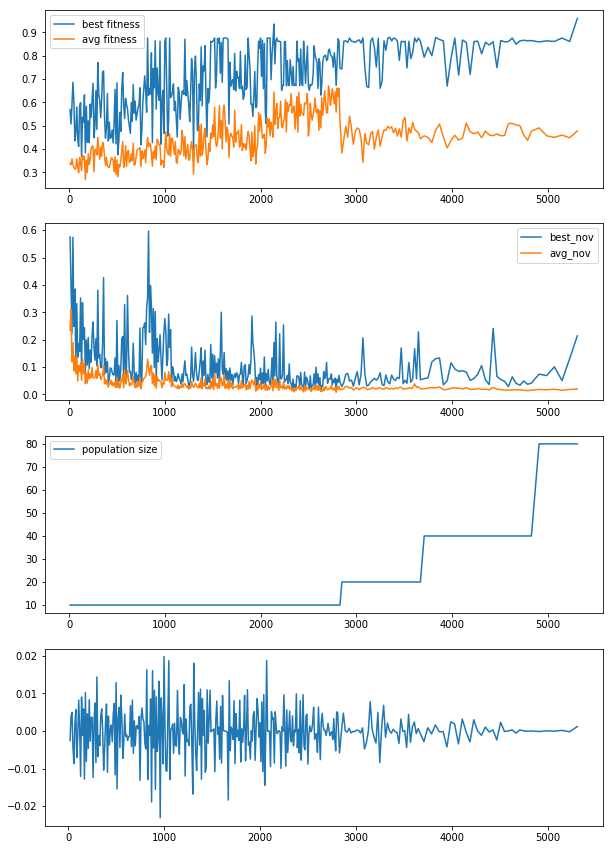

ipop_cmaes_6_4_15-51-35-5046_25665595


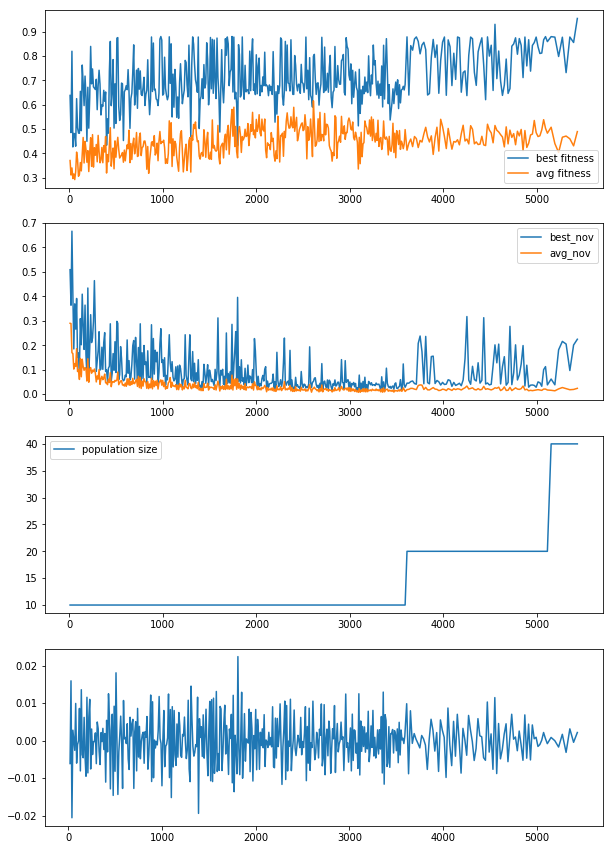

ipop_cmaes_6_4_15-51-26-6153_1320822013


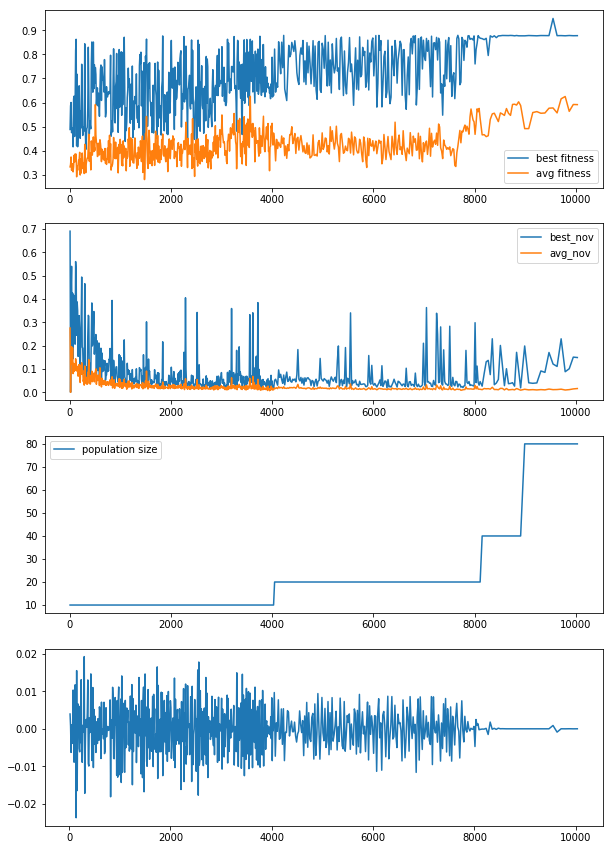

ipop_cmaes_6_4_15-51-18-8536_3178170816


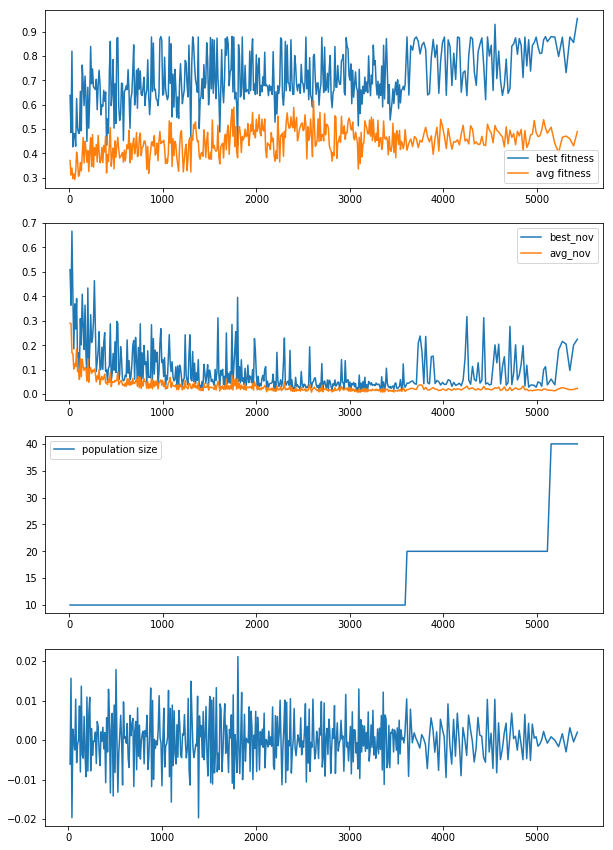

ipop_cmaes_6_4_15-51-34-4204_3972030329


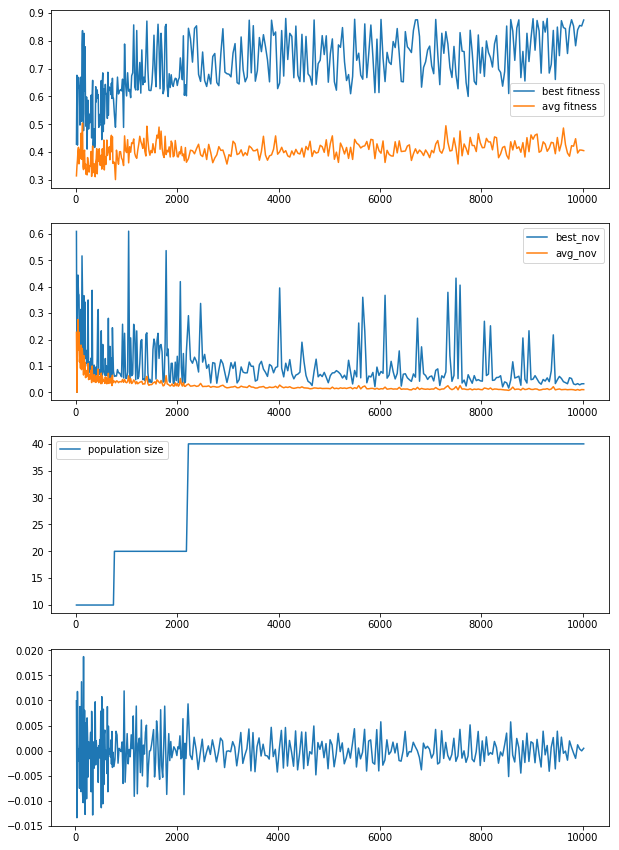

ipop_cmaes_6_4_15-51-23-3815_3889046063


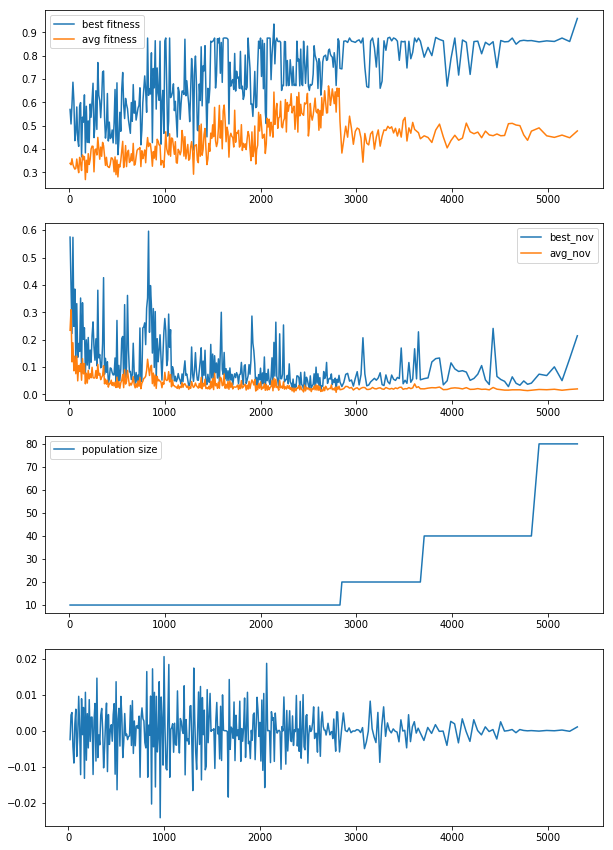

ipop_cmaes_6_4_15-51-19-9184_4178317395


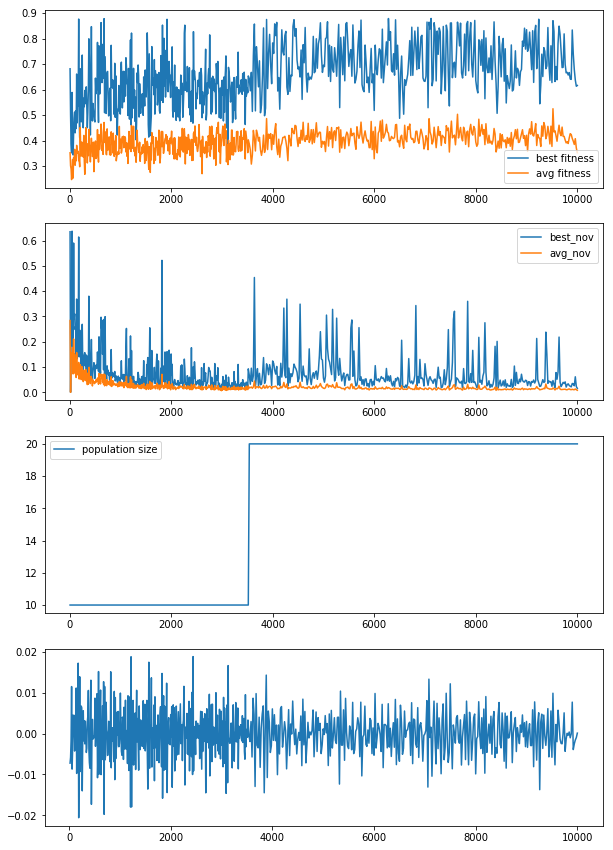

ipop_cmaes_6_4_15-51-32-2149_3395966080


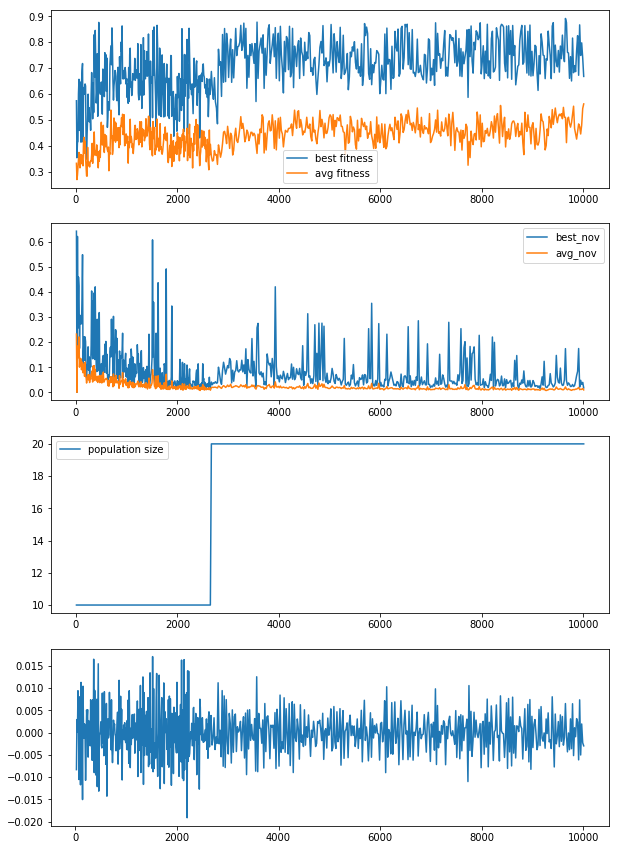

In [20]:
are_ipop_hard = "/home/leni/are-logs/are_ipop_hard/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_hard) :
    if(not os.path.isdir(are_ipop_hard + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_hard + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_hard + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_hard + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    animation_pop(are_ipop_hard + folder,pop_size,1)

race 8566.0 3154.254904093834 8873.971704574602 3192.976075487605
race 6308.0 3106.412078266501 7165.3643156665985 3075.860936485624
race 4807.0 4179.693888312875 5356.833418132301 4161.729090307868


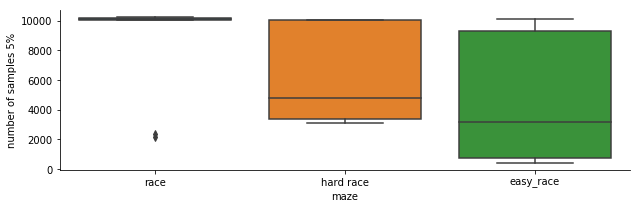

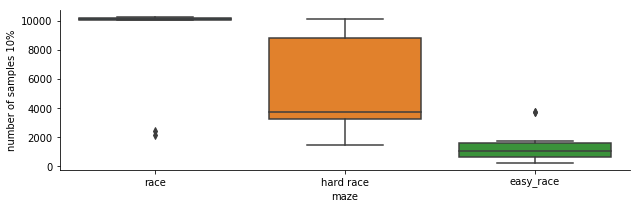

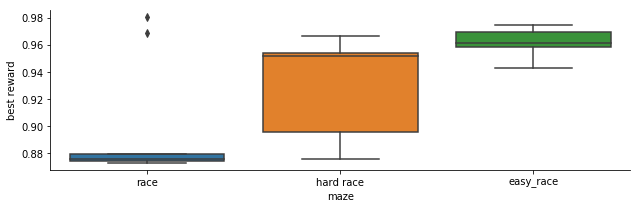

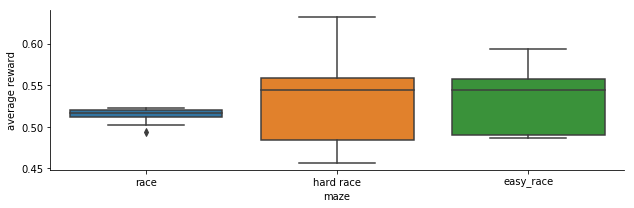

In [32]:
list_dir = [["/home/leni/are-logs/are_ipop_race_popstag02/",
             "/home/leni/are-logs/are_ipop_hard_popstag02/",
             "/home/leni/are-logs/are_ipop_easy_popstag02/"],
            ["/home/leni/are-logs/are_ipop_elman_hard/",
             "/home/leni/are-logs/are_ipop_elman_easy"] ]
list_label = ["NIP-ES","NIP-ES e4 ps 02"]
maze_name =  ["race","hard race","easy_race"]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90 or ne >= 10000) :
                neval_10 = ne
                break
            
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[1],maze_name[i]])
    print(maze_name[0],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="maze",y="number of samples 5%",data=d,kind="box",aspect=3,height=3)
#ax1.set(yscale = "log")

ax1 = sns.catplot(x="maze",y="number of samples 10%",data=d,kind="box",aspect=3,height=3)



ax1 = sns.catplot(x="maze",y="best reward",data=d,kind="box",aspect=3,height=3)

ax1 = sns.catplot(x="maze",y="average reward",data=d,kind="box",aspect=3,height=3)

ipop_cmaes_12_4_7-56-37-7783_778707223


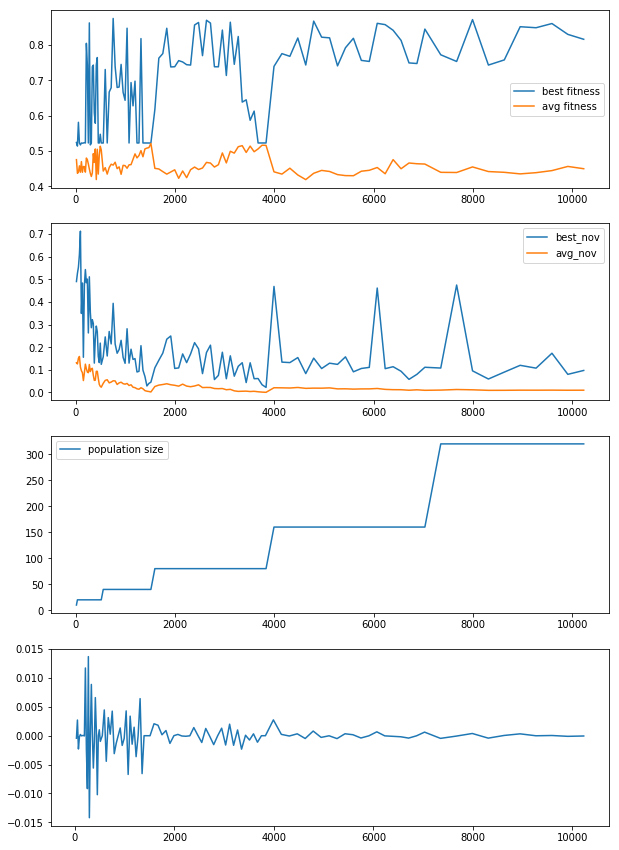

ipop_cmaes_12_4_7-56-12-2900_1552228958


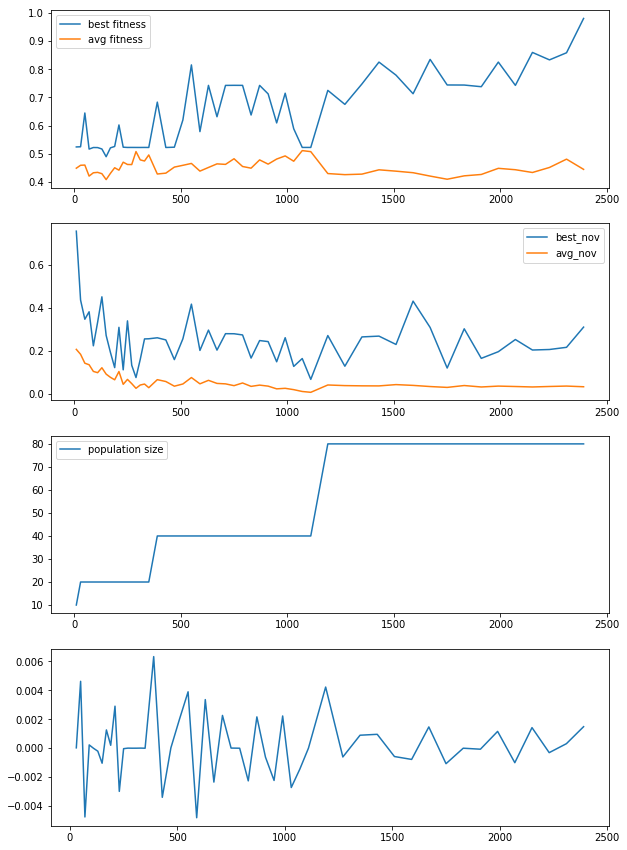

ipop_cmaes_12_4_7-56-44-4885_2458377172


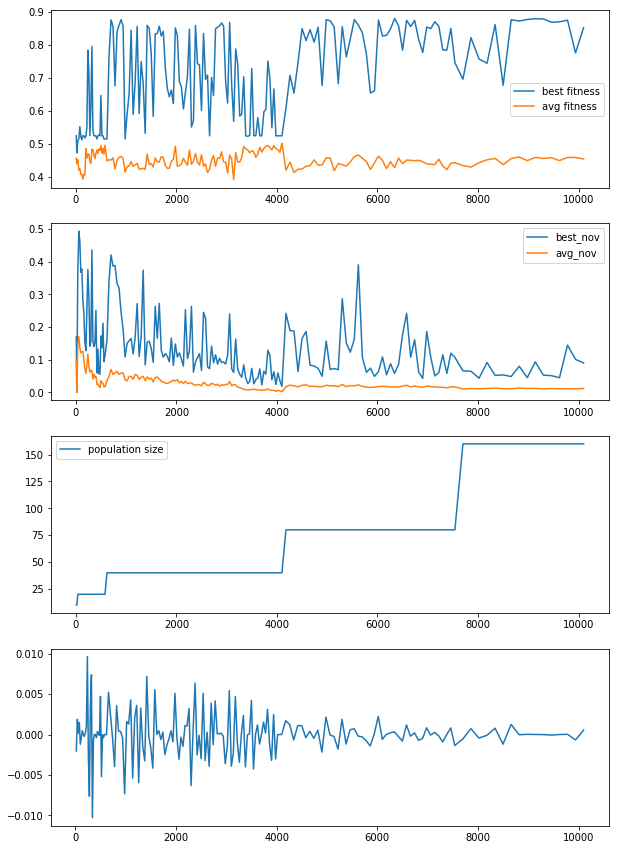

ipop_cmaes_12_4_7-56-48-8826_4246864185


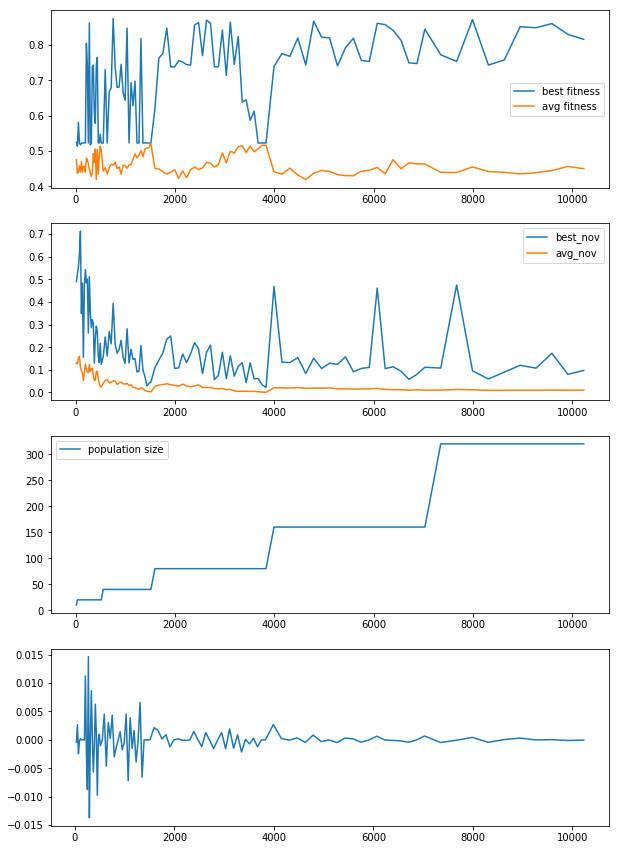

ipop_cmaes_12_4_7-56-26-6069_1260081578


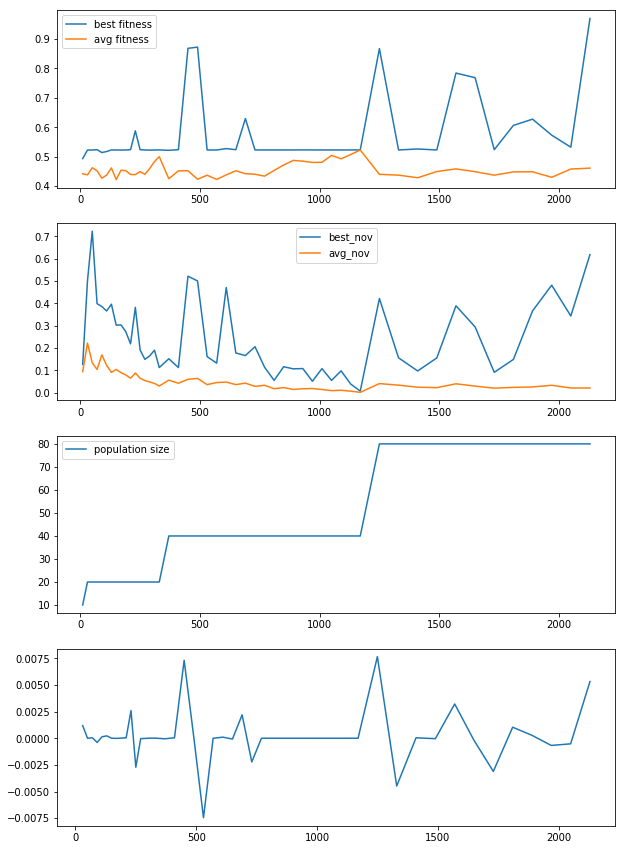

ipop_cmaes_12_4_7-56-31-1738_2209145046


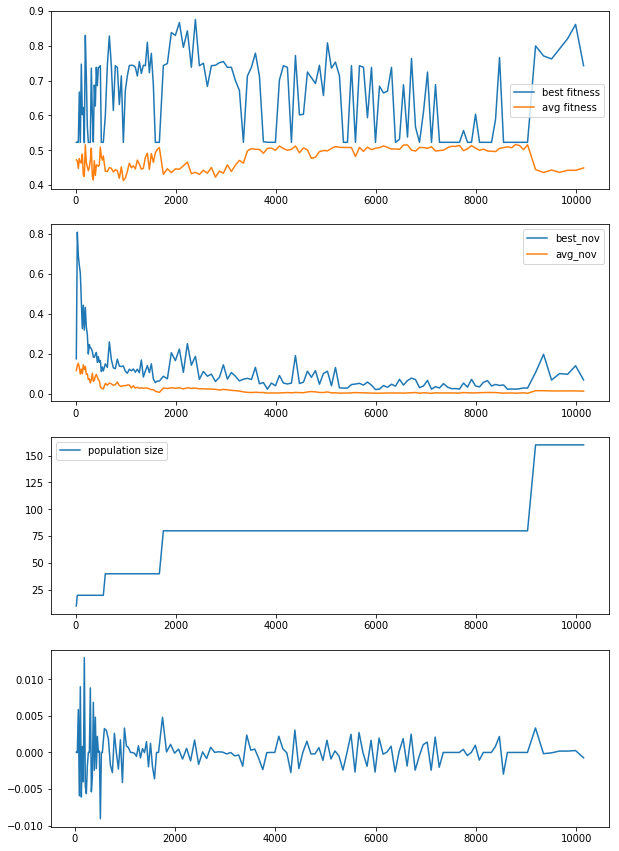

ipop_cmaes_12_4_7-56-46-6804_546786335


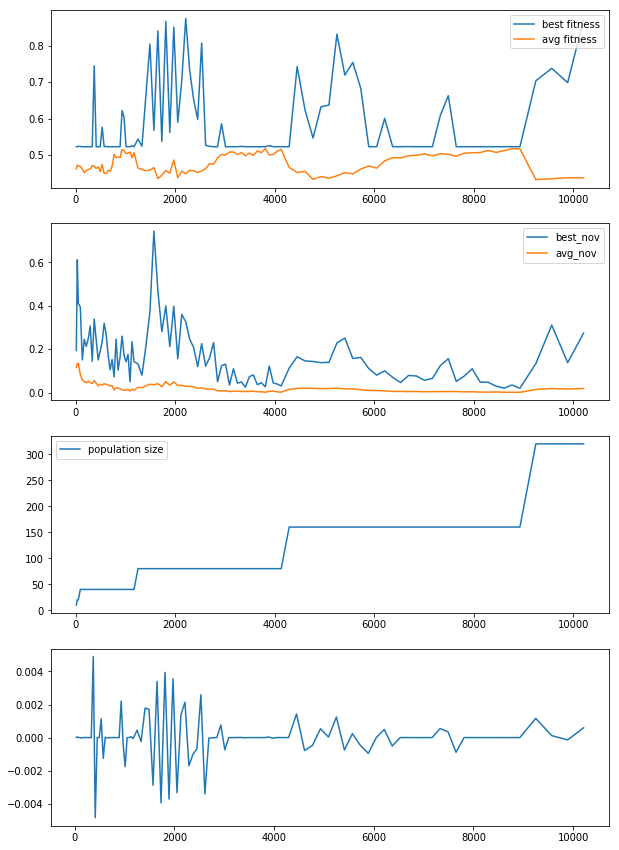

ipop_cmaes_12_4_7-56-21-1795_659005459


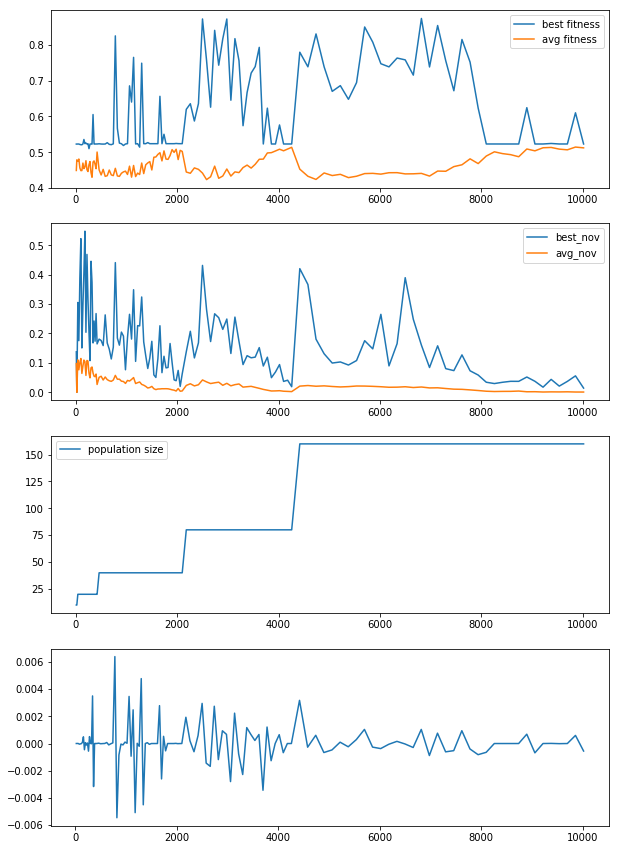

ipop_cmaes_12_4_7-56-30-681_3173688088


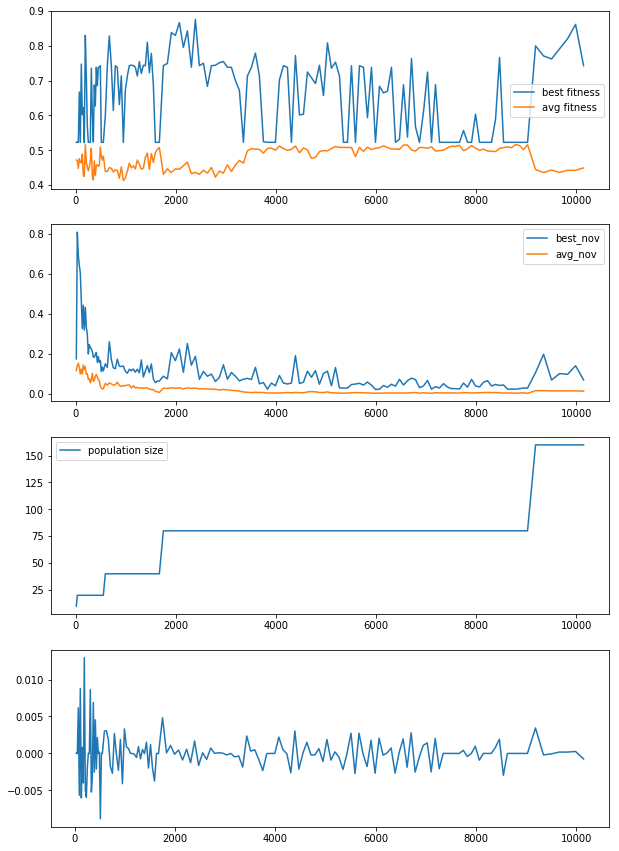

ipop_cmaes_12_4_7-56-40-889_3869737693


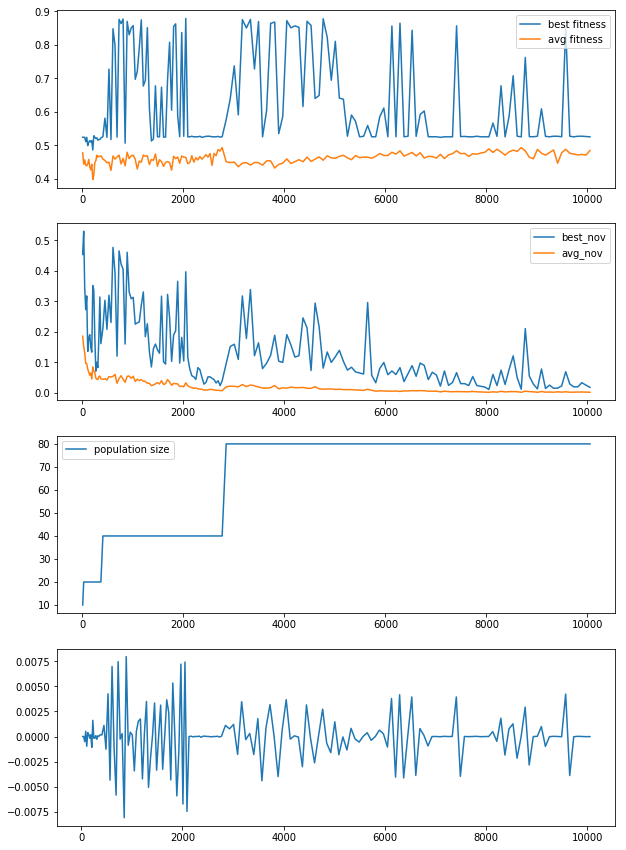

In [24]:
are_ipop_race_popstag02 = "/home/leni/are-logs/are_ipop_race_popstag02/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_race_popstag02) :
    if(not os.path.isdir(are_ipop_race_popstag02 + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_race_popstag02 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_race_popstag02 + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_race_popstag02 + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    #animation_pop(are_ipop_race_popstag02 + folder,pop_size,1)

hard race 6614.0 3057.319741211246 9935.7240900795 3542.3909599884705
hard race 7760.0 3076.8685379781828 10253.2870691805 3802.5824879885026
hard race 6308.0 3106.412078266501 7165.3643156665985 3075.860936485624
hard race 9722.222222222223 519.6746370519364 10561.846821216111 586.9040758837593


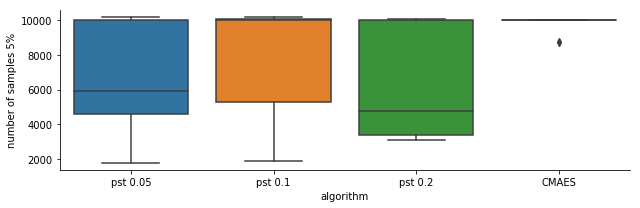

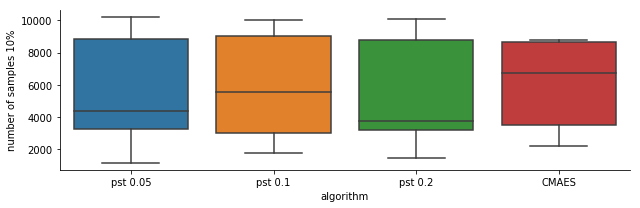

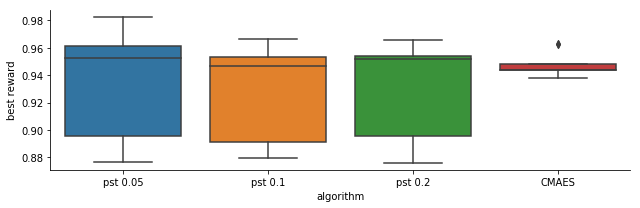

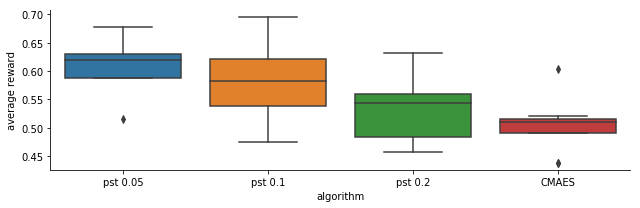

In [4]:
list_dir = [["/home/leni/are-logs/are_ipop_hard_pst005/",
             "/home/leni/are-logs/are_ipop_hard_pst01/",
             "/home/leni/are-logs/are_ipop_hard_popstag02/",
            "/home/leni/are-logs/are_cmaes_elman_hard/"]]
list_label = ["pst 0.05","pst 0.1","pst 0.2","CMAES"]
maze_name =  ["hard race"]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0;
        neval_15 = 0;
        neval_20
        neval_list.append(neval[-1])
        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90 or ne >= 10000) :
                neval_10 = ne
                break
            
        lines.append([max(best_fit),max(avg_fit),neval_10,neval[-1],sum(eval_time),list_label[i],maze_name[0]])
    print(maze_name[0],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["best reward","average reward","number of samples 10%","number of samples 5%","computational time","algorithm","maze"])    
    

ax1 = sns.catplot(x="algorithm",y="number of samples 5%",data=d,kind="box",aspect=3,height=3)
#ax1.set(yscale = "log")

ax1 = sns.catplot(x="algorithm",y="number of samples 10%",data=d,kind="box",aspect=3,height=3)



ax1 = sns.catplot(x="algorithm",y="best reward",data=d,kind="box",aspect=3,height=3)

ax1 = sns.catplot(x="algorithm",y="average reward",data=d,kind="box",aspect=3,height=3)

hard race 6614.0 3057.319741211246 9935.7240900795 3542.3909599884705
hard race 5548.0 3163.7281804858017 9935.7240900795 3542.3909599884705
hard race 1040.0 535.312992556691 9935.7240900795 3542.3909599884705
hard race 7760.0 3076.8685379781828 10253.2870691805 3802.5824879885026
hard race 5722.0 3147.239425274156 10253.2870691805 3802.5824879885026
hard race 777.0 560.6612167789029 10253.2870691805 3802.5824879885026
hard race 6308.0 3106.412078266501 7165.3643156665985 3075.860936485624
hard race 5330.0 3208.2269246423325 7165.3643156665985 3075.860936485624
hard race 712.0 516.9487402054482 7165.3643156665985 3075.860936485624
hard race 9722.222222222223 519.6746370519364 10561.846821216111 586.9040758837593
hard race 6111.111111111111 2573.8835527680494 10561.846821216111 586.9040758837593
hard race 1233.3333333333333 540.0617248673217 10561.846821216111 586.9040758837593


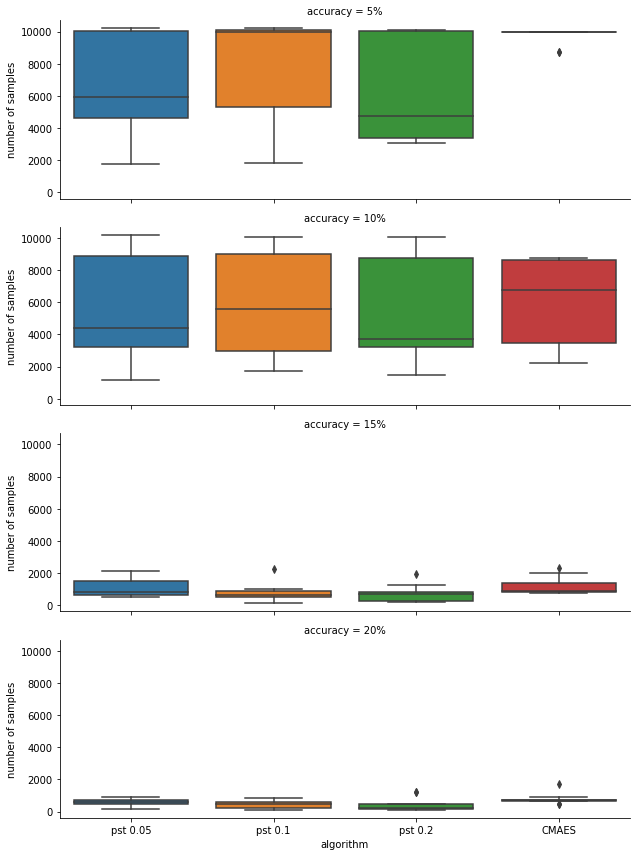

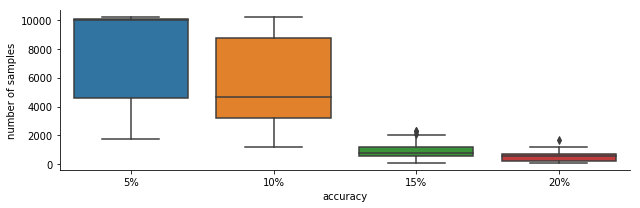

In [8]:
list_dir = [["/home/leni/are-logs/are_ipop_hard_pst005/",
             "/home/leni/are-logs/are_ipop_hard_pst01/",
             "/home/leni/are-logs/are_ipop_hard_popstag02/",
            "/home/leni/are-logs/are_cmaes_elman_hard/"]]
type_exp = ["pst 0.05","pst 0.1","pst 0.2","CMAES"]
maze_name =  ["hard race"]

lines = []
i = 0
for dire in list_dir[0] :
    neval_list = []
    neval_list_10 = []
    neval_list_15 = []
    neval_list_20 = []
    time_list = []
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != "ipop") :
            continue
        neval, best_fit, avg_fit,pop_size = load_all_fitnesses(dire + folder + "/fitnesses.csv")
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0
        neval_15 = 0
        neval_20 = 0
        neval_list.append(neval[-1])

        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90 or ne >= 10000) :
                neval_10 = ne
                break
        for fit,ne in zip(best_fit,neval) :        
            if(fit >= 0.85 or ne >= 10000) :
                neval_15 = ne
                break
        for fit,ne in zip(best_fit,neval) :        
            if(fit >= 0.8 or ne >= 10000) :
                neval_20 = ne
                break
        neval_list_10.append(neval_10)
        neval_list_15.append(neval_15)
        neval_list_20.append(neval_20)
        lines.append([neval[-1],"5%",type_exp[i]])
        lines.append([neval_10,"10%",type_exp[i]])
        lines.append([neval_15,"15%",type_exp[i]])
        lines.append([neval_20,"20%",type_exp[i]])
        
    print(maze_name[0],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    print(maze_name[0],np.mean(neval_list_10),np.std(neval_list_10),np.mean(time_list),np.std(time_list))
    print(maze_name[0],np.mean(neval_list_15),np.std(neval_list_15),np.mean(time_list),np.std(time_list))
    #print(maze_name[0],np.mean(neval_list_20),np.std(neval_list_20),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["number of samples","accuracy","algorithm"])    
    
ax1 = sns.catplot(x="algorithm",y="number of samples",col="accuracy",data=d,kind="box",aspect=3,height=3,col_wrap=1)
ax2 = sns.catplot(x="accuracy",y="number of samples",data=d,kind="box",aspect=3,height=3)

ipop_cmaes_13_4_12-56-52-2262_3577205840


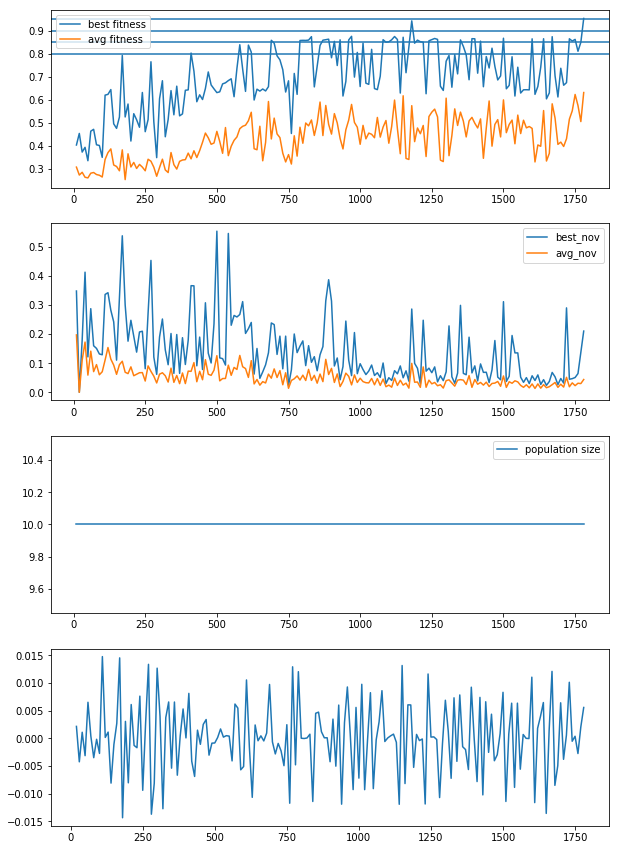

ipop_cmaes_13_4_12-56-22-2931_1238443864


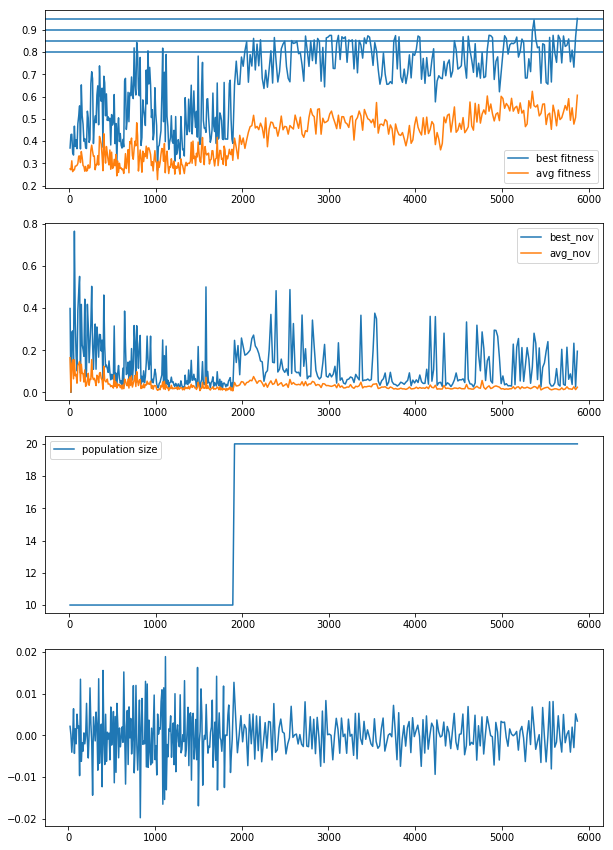

ipop_cmaes_13_4_12-56-26-6061_445521066


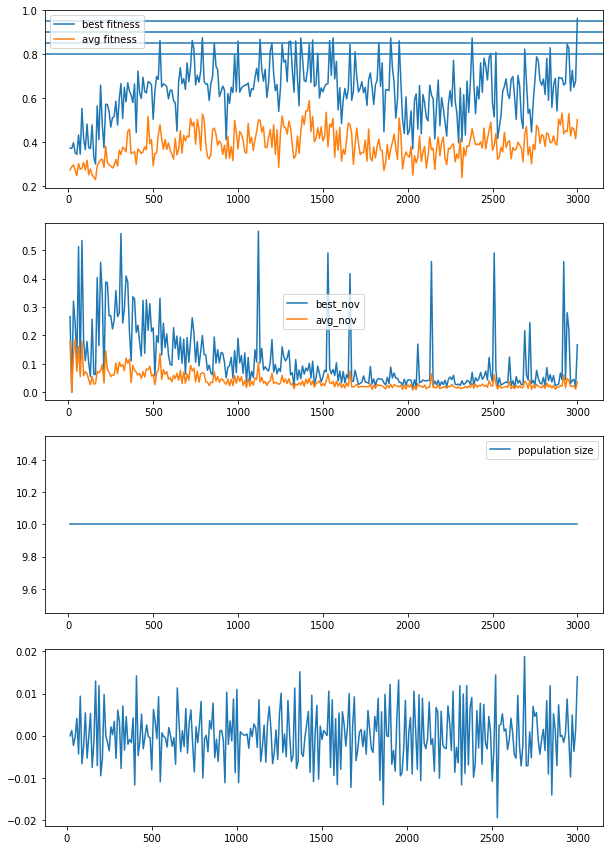

ipop_cmaes_13_4_12-56-27-7003_256187677


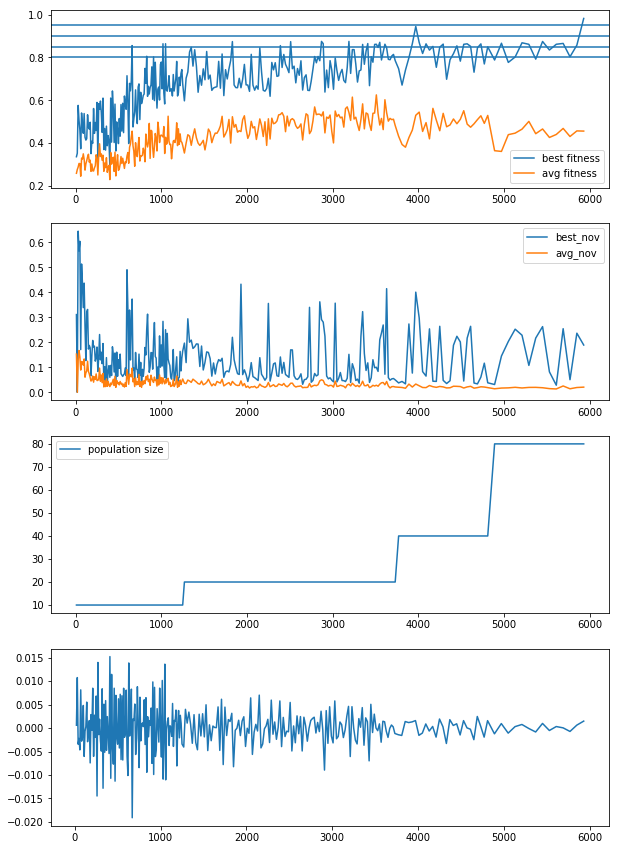

ipop_cmaes_13_4_12-56-23-3180_3380785798


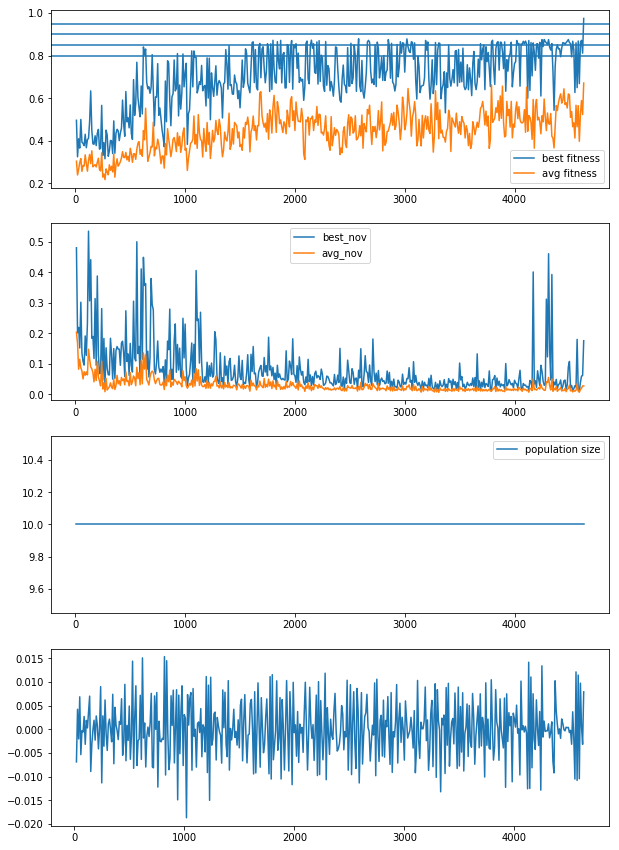

ipop_cmaes_13_4_12-56-50-194_3200019240


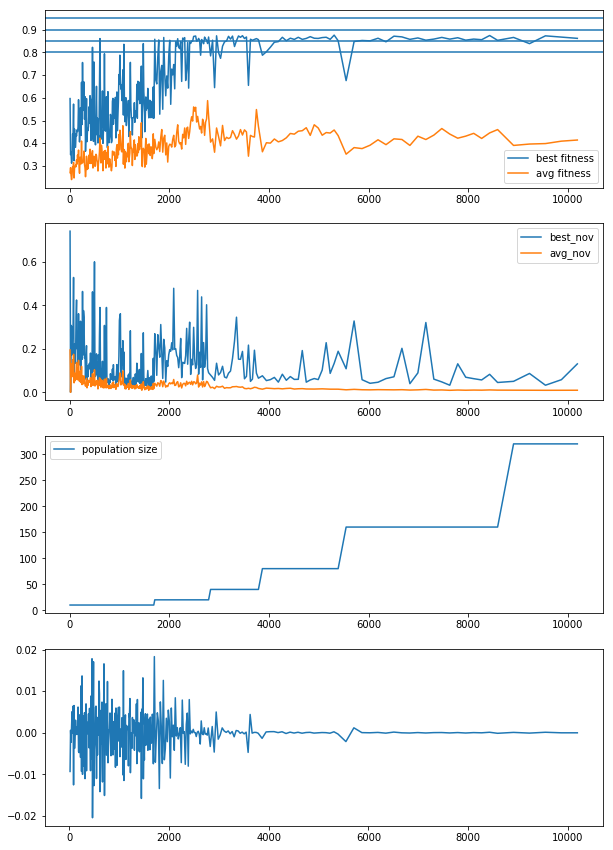

ipop_cmaes_13_4_12-56-33-3214_4048891555


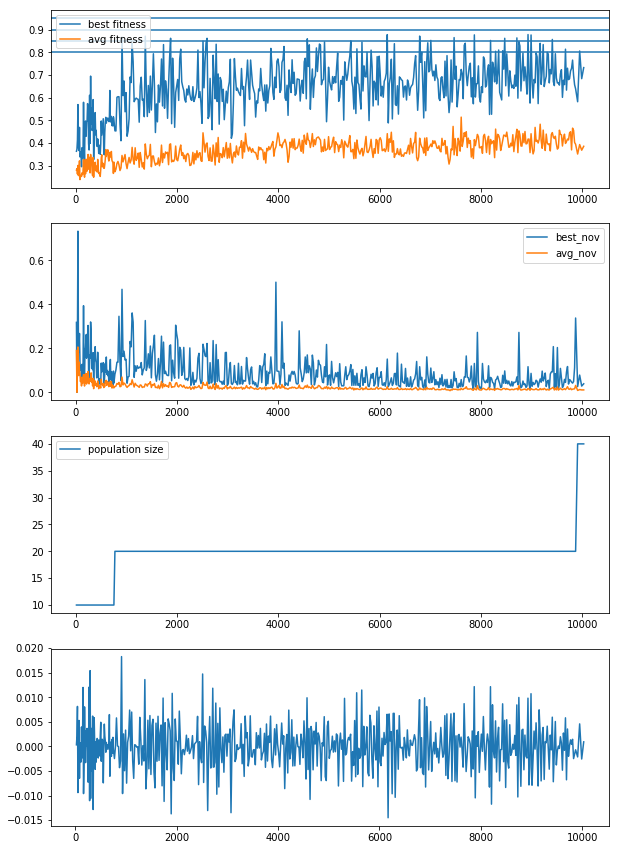

ipop_cmaes_13_4_12-56-17-7554_1356370159


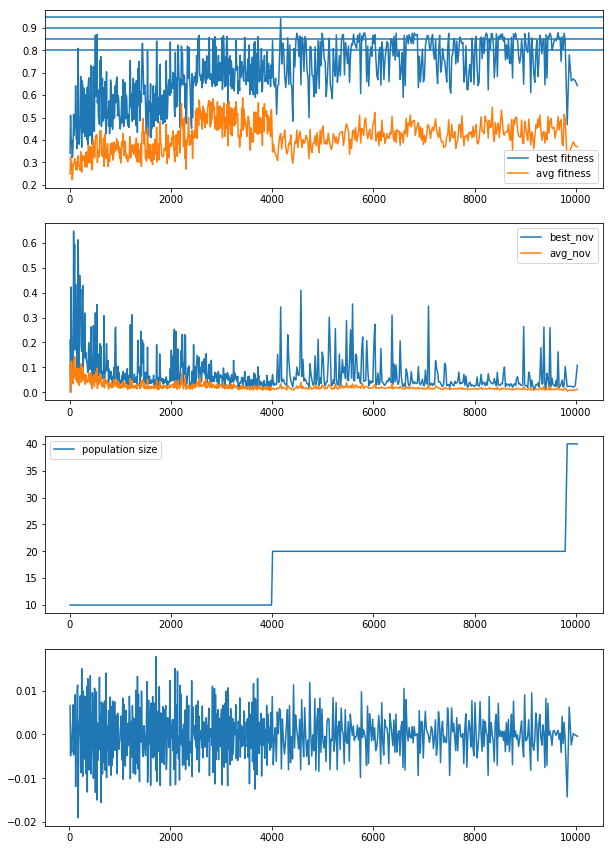

ipop_cmaes_13_4_12-56-34-4247_3017348450


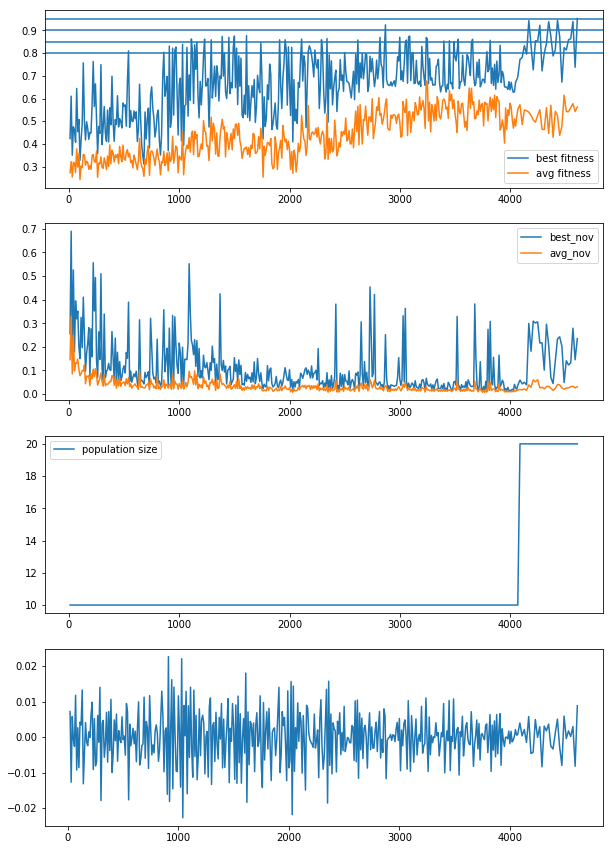

ipop_cmaes_13_4_12-56-32-2748_2911795


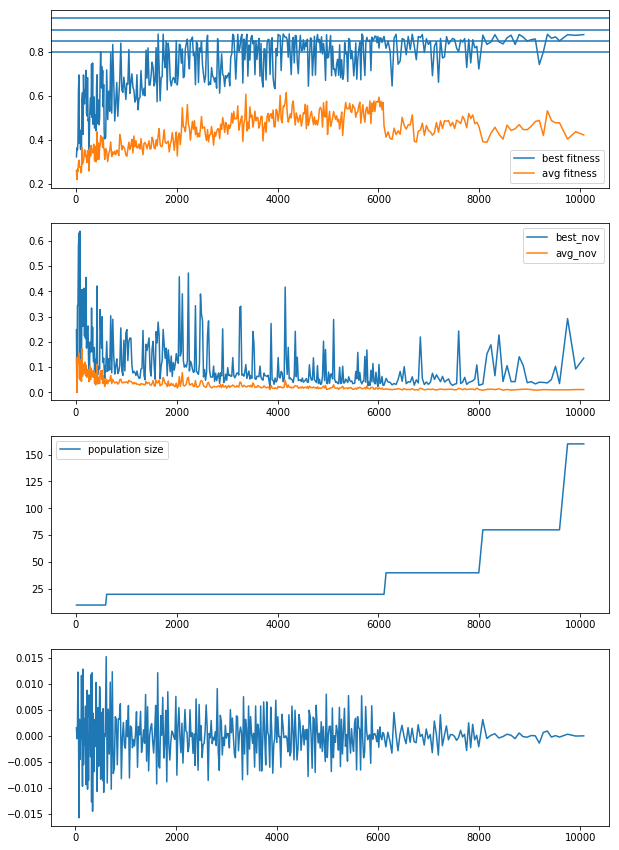

In [10]:
are_ipop_hard_pst005 = "/home/leni/are-logs/are_ipop_hard_pst005/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_hard_pst005) :
    if(not os.path.isdir(are_ipop_hard_pst005 + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_hard_pst005 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_hard_pst005 + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_hard_pst005 + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax1.axhline(y=0.95)
    ax1.axhline(y=0.9)
    ax1.axhline(y=0.85)
    ax1.axhline(y=0.80)
    
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    #animation_pop(are_ipop_hard_pst005 + folder,pop_size,1)

ipop_cmaes_13_4_12-57-22-2347_489160468


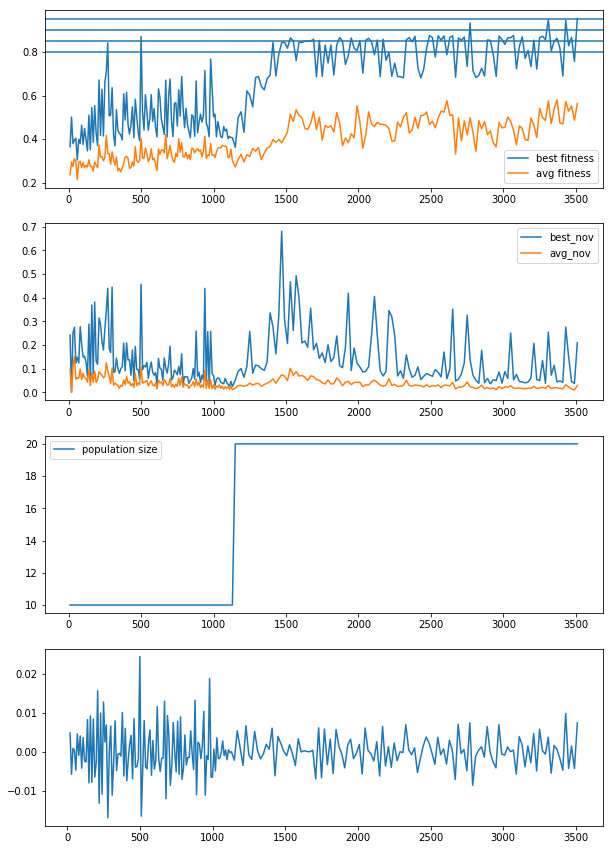

ipop_cmaes_13_4_12-57-21-1512_2654255441


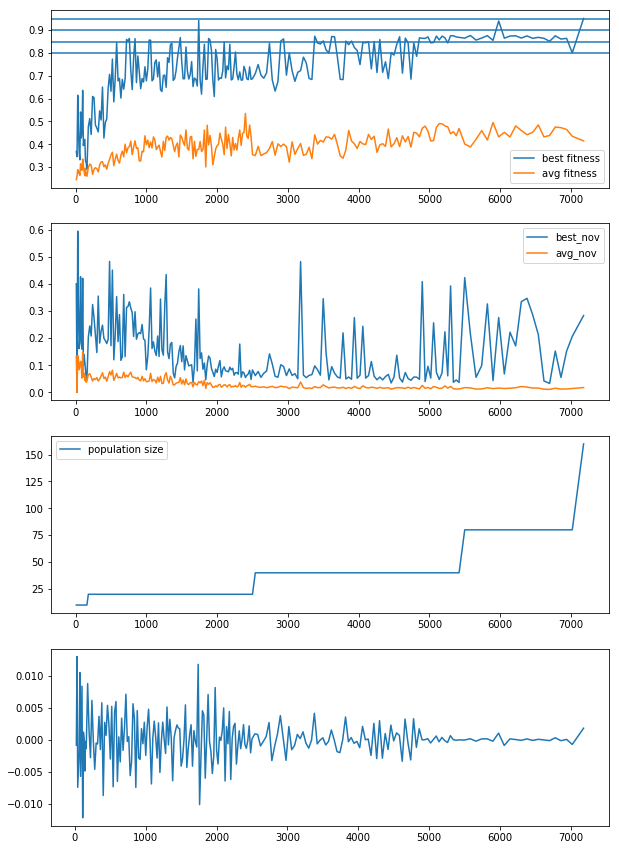

ipop_cmaes_13_4_12-57-8-8371_3551441793


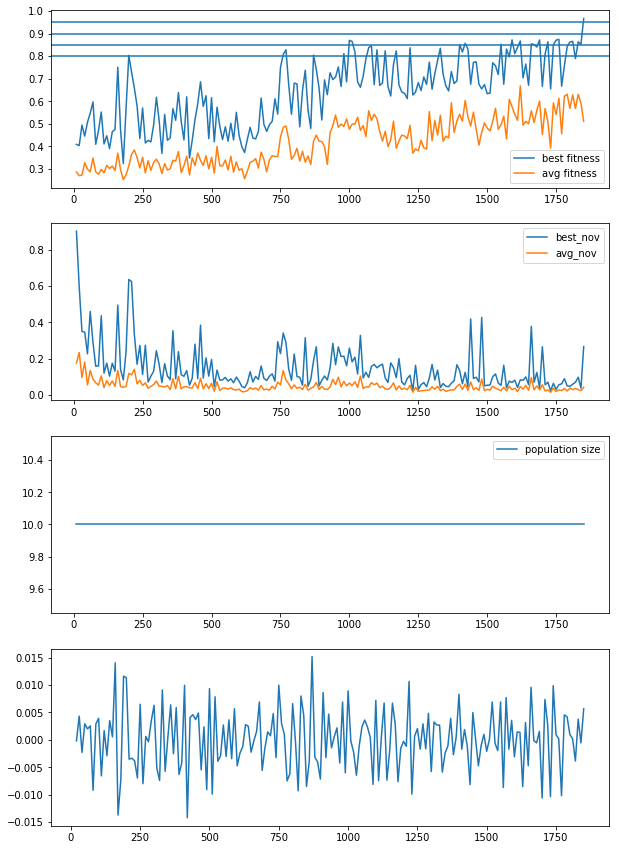

ipop_cmaes_13_4_12-57-19-9193_1929882217


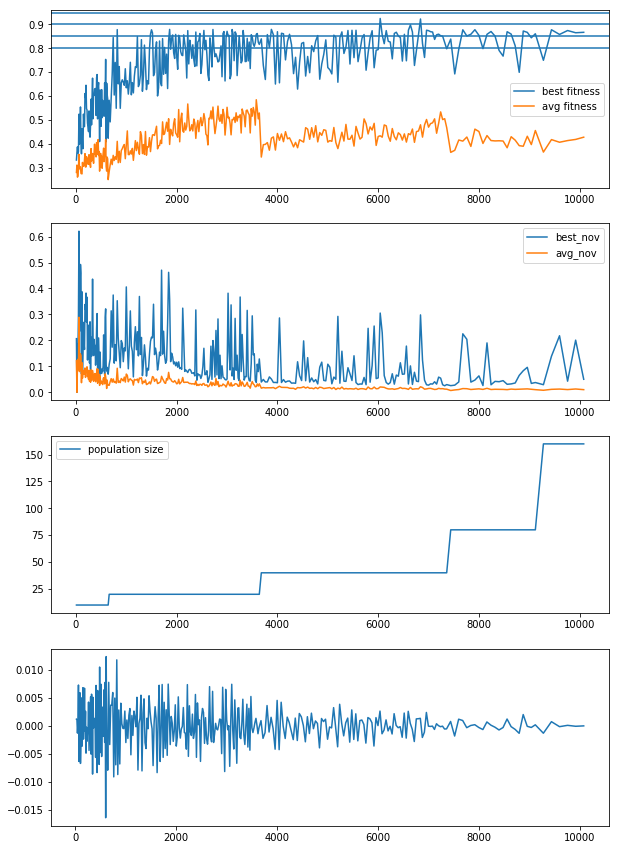

ipop_cmaes_13_4_13-55-13-3864_1652028754


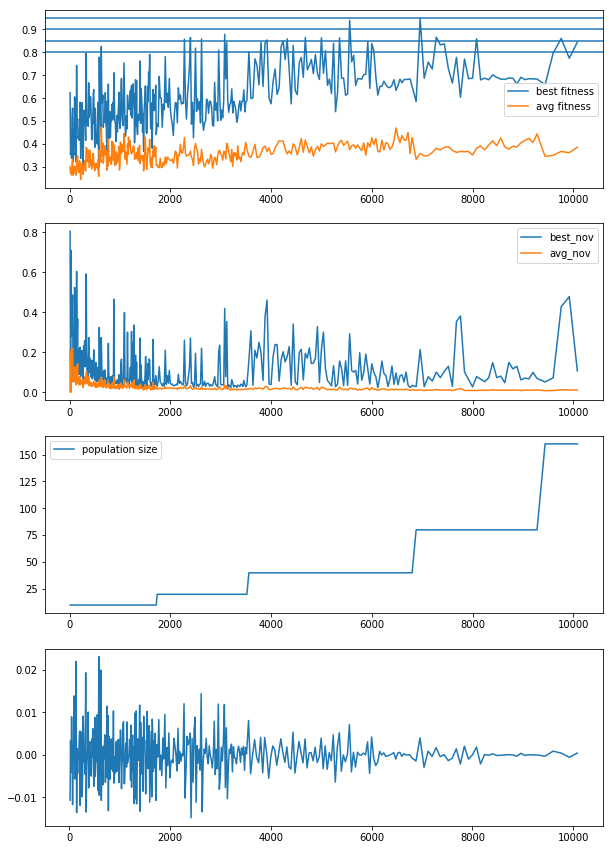

ipop_cmaes_13_4_12-57-11-1310_1919578855


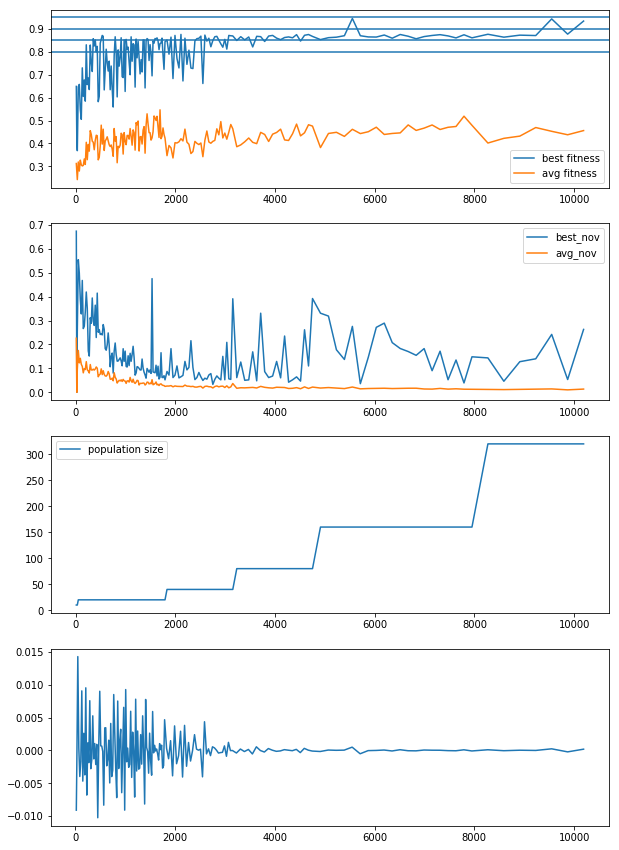

ipop_cmaes_13_4_12-57-19-9791_962288292


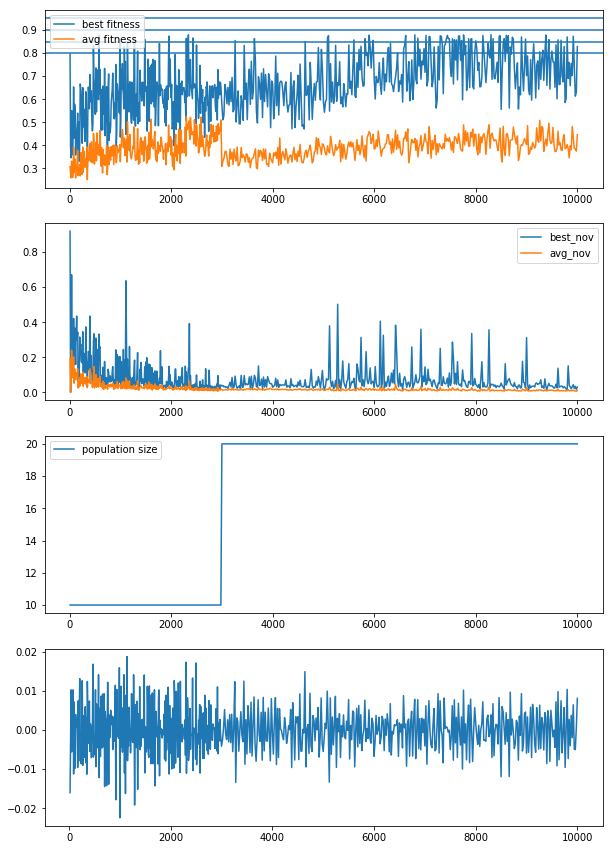

ipop_cmaes_13_4_12-56-59-9442_2249097192


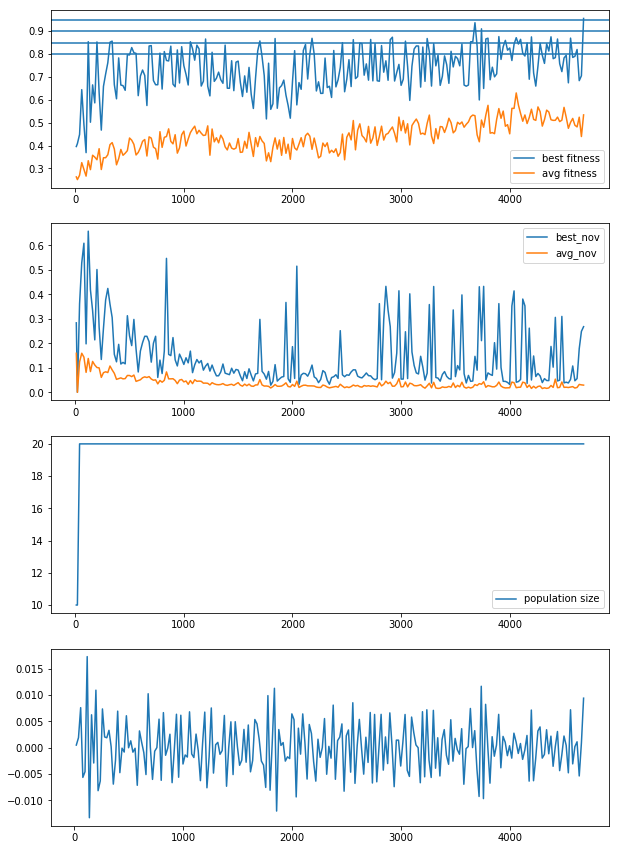

ipop_cmaes_13_4_12-56-59-9283_4261622062


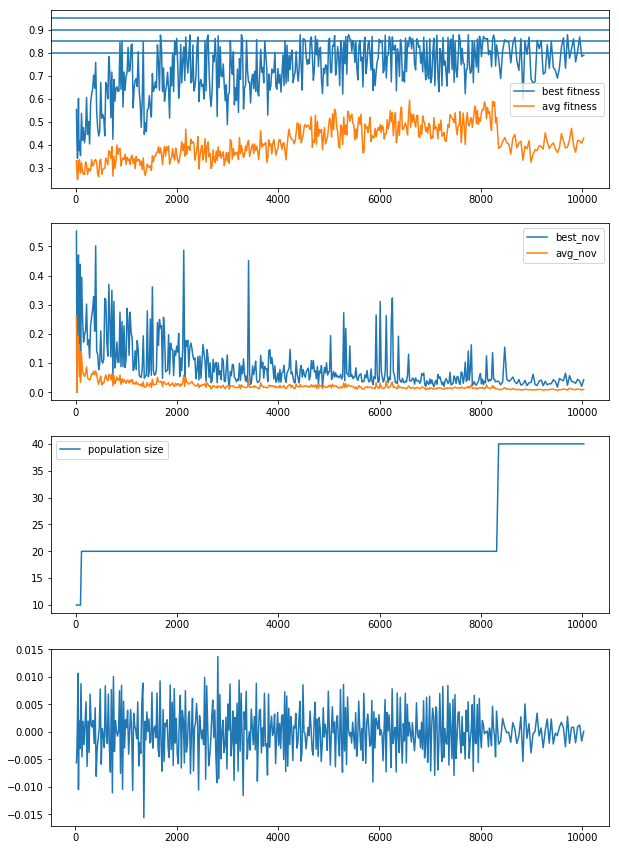

ipop_cmaes_13_4_12-57-8-8426_542474176


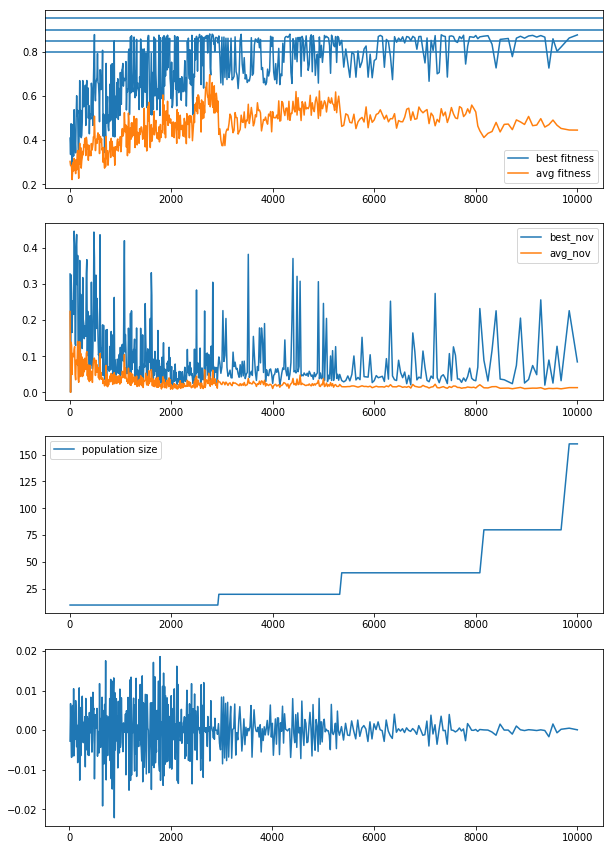

In [21]:
are_ipop_hard_pst01 = "/home/leni/are-logs/are_ipop_hard_pst01/"
x_vec = []
y_vec = []
for folder in os.listdir(are_ipop_hard_pst01) :
    if(not os.path.isdir(are_ipop_hard_pst01 + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fitnesses(are_ipop_hard_pst01 + folder + "/fitnesses.csv")
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_ipop_hard_pst01 + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_ipop_hard_pst01 + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax1.axhline(y=0.95)
    ax1.axhline(y=0.9)
    ax1.axhline(y=0.85)
    ax1.axhline(y=0.80)
    
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    #animation_pop(are_ipop_hard_pst005 + folder,pop_size,1)

/home/leni/are-logs/are_ipop_elman4_easy/
5% easy race 2636.125 1244.4820923279692 3902.9473717188 1647.3360222099104
10% easy race 1720.075 938.3291669904544 3902.9473717188 1647.3360222099104
15% easy race 723.525 666.7397116754033 3902.9473717188 1647.3360222099104
20% easy race 487.175 278.94300605141547 3902.9473717188 1647.3360222099104
/home/leni/are-logs/are_ipop_multi/
5% multi maze 173.125 258.69449283856045 289.92515309830003 351.0543707737026
10% multi maze 21.525 36.513601917641594 289.92515309830003 351.0543707737026
15% multi maze 36.9 31.82455812733305 289.92515309830003 351.0543707737026
20% multi maze 18.45 12.802245896716716 289.92515309830003 351.0543707737026
/home/leni/are-logs/are_cmabo_easy/
5% easy race 1949.375 1602.3836785005644 8506.7790675766 14186.259144015346
10% easy race 863.3 999.6634733749153 8506.7790675766 14186.259144015346
15% easy race 767.825 655.9268542490086 8506.7790675766 14186.259144015346
20% easy race 438.0 281.2209985047347 8506.77906757

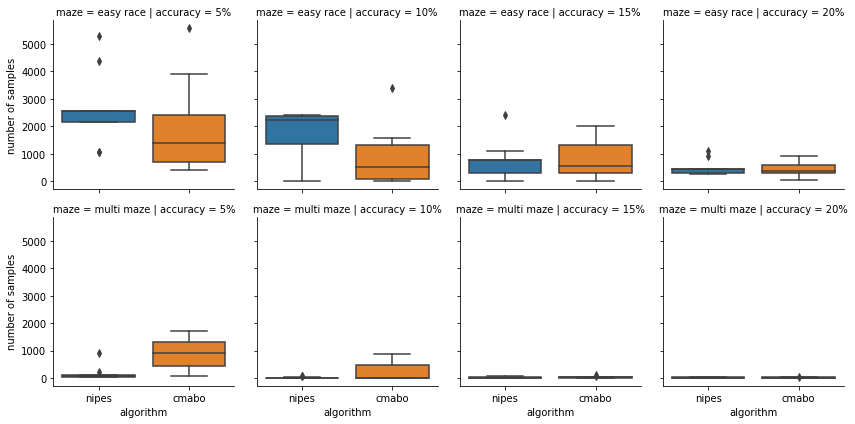

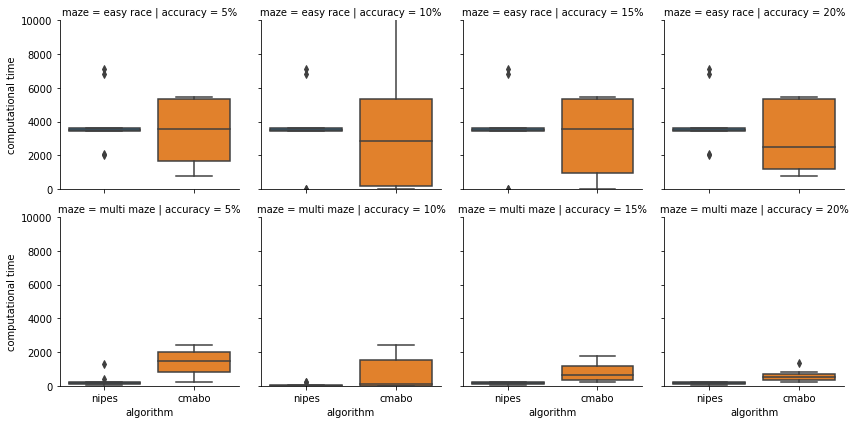

In [60]:
list_dir = ["/home/leni/are-logs/are_ipop_elman4_easy/",
            "/home/leni/are-logs/are_ipop_multi/",
             "/home/leni/are-logs/are_cmabo_easy/",
            # "/home/leni/are-logs/are_cmabo_easy_norestart/",
            "/home/leni/are-logs/are_cmabo_multi/"]
type_exp = ["nipes","cmabo norestart","cmabo"]
maze_name =  ["easy race", "multi maze"]
prefix = ["ipop","cmabo","cmabo"]
target = [[0.75,0.75],[0,-0.5]]
lines = []
i = 0
idx = [[0,0],[0,1],[2,0],[2,1]]
for dire in list_dir :
    neval_list = []
    neval_list_10 = []
    neval_list_15 = []
    neval_list_20 = []
    time_list = []
    print(dire)
    for folder in os.listdir(dire) :
        if(not os.path.isdir(dire + folder) or folder.split("_")[0] != prefix[idx[i][0]]) :
            continue
            
        neval, best_fit, avg_fit,pop_size = load_all_fit_from_fpos(dire + folder + "/final_pos.csv",target[idx[i][1]])
        nbeval, eval_time = load_eval_time(dire + folder + "/eval_durations.csv")
        neval_10 = 0
        neval_15 = 0
        neval_20 = 0
        neval_list.append(neval[-1])

        time_list.append(sum(eval_time))
        for fit,ne in zip(best_fit,neval) :
            if(fit >= 0.90 or ne >= 10000) :
                neval_10 = ne
                break
        for fit,ne in zip(best_fit,neval) :        
            if(fit >= 0.85 or ne >= 10000) :
                neval_15 = ne
                break
        for fit,ne in zip(best_fit,neval) :        
            if(fit >= 0.8 or ne >= 10000) :
                neval_20 = ne
                break
        neval_list_10.append(neval_10)
        neval_list_15.append(neval_15)
        neval_list_20.append(neval_20)
        lines.append([sum(eval_time),neval[-1],"5%",type_exp[idx[i][0]],maze_name[idx[i][1]]])
        lines.append([sum(eval_time[:int(neval_10)]),neval_10,"10%",type_exp[idx[i][0]],maze_name[idx[i][1]]])
        lines.append([sum(eval_time[:int(neval_15)]),neval_15,"15%",type_exp[idx[i][0]],maze_name[idx[i][1]]])
        lines.append([sum(eval_time[:int(neval_20)]),neval_20,"20%",type_exp[idx[i][0]],maze_name[idx[i][1]]])
        
    print("5%",maze_name[idx[i][1]],np.mean(neval_list),np.std(neval_list),np.mean(time_list),np.std(time_list))
    print("10%",maze_name[idx[i][1]],np.mean(neval_list_10),np.std(neval_list_10),np.mean(time_list),np.std(time_list))
    print("15%",maze_name[idx[i][1]],np.mean(neval_list_15),np.std(neval_list_15),np.mean(time_list),np.std(time_list))
    print("20%",maze_name[idx[i][1]],np.mean(neval_list_20),np.std(neval_list_20),np.mean(time_list),np.std(time_list))
    i+=1
    
d = pd.DataFrame(data=lines,columns=["computational time","number of samples","accuracy","algorithm","maze"])    
    
ax1 = sns.catplot(x="algorithm",y="number of samples",col="accuracy",row="maze",data=d,kind="box",aspect=1,height=3)
ax2 = sns.catplot(x="algorithm",y="computational time",col="accuracy",row="maze",data=d,kind="box",aspect=1,height=3)
ax2.set(ylim=[1,10000])

cmabo_20_4_8-12-25-5389_2755529020


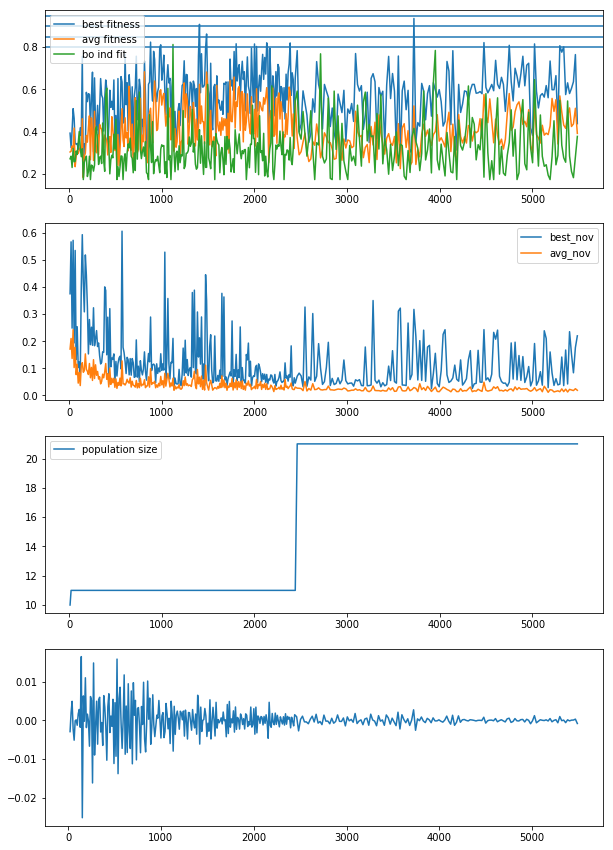

cmabo_20_4_8-14-31-1774_1877665747


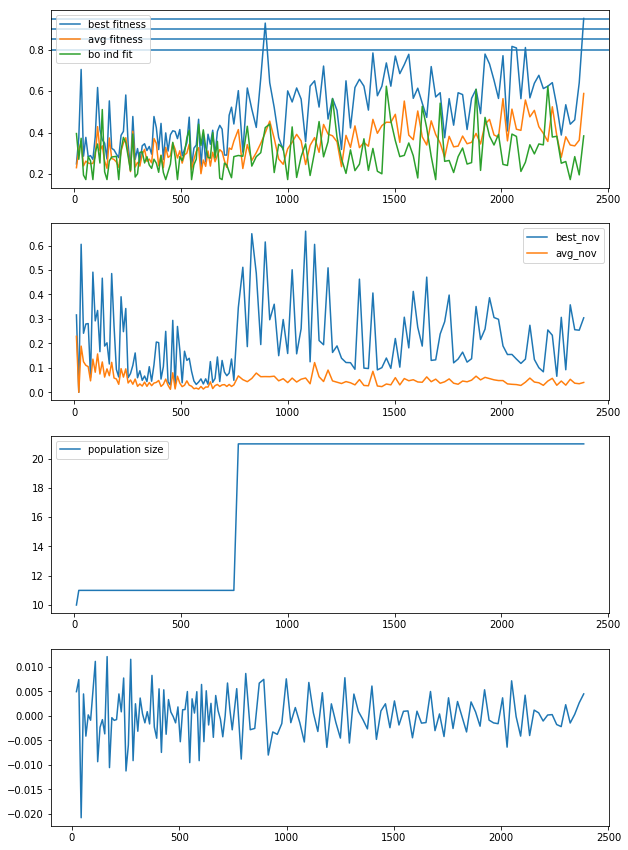

cmabo_20_4_8-12-14-4239_1424442191


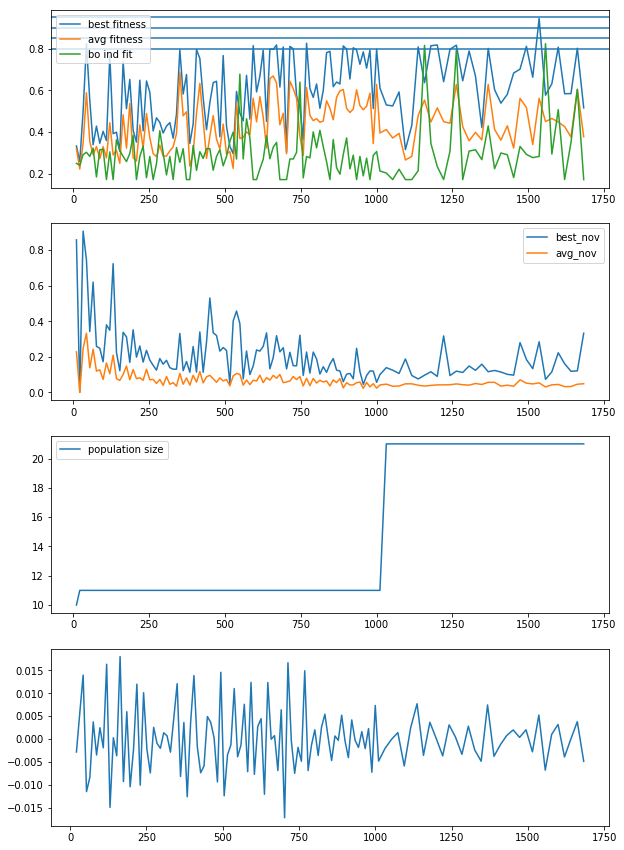

cmabo_20_4_8-12-23-3122_3551954333


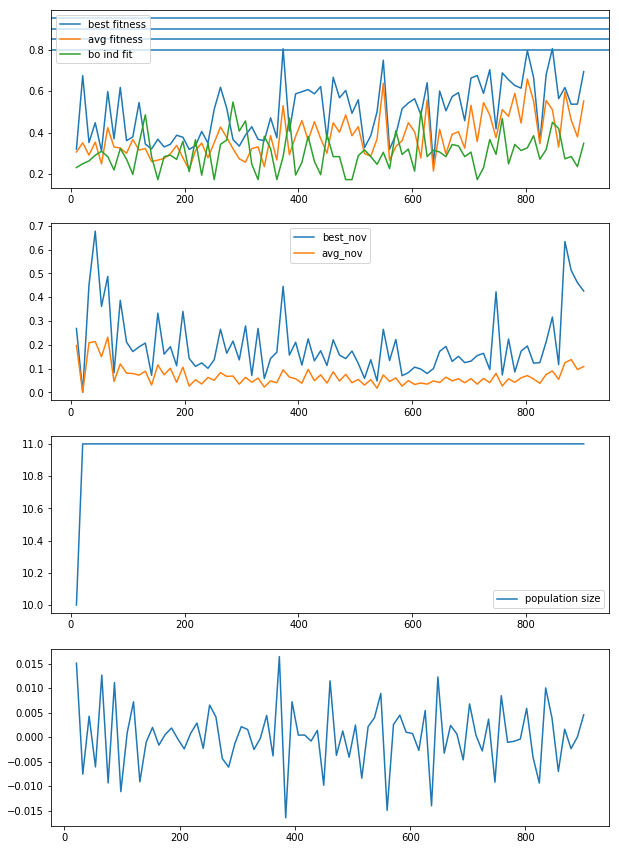

cmabo_20_4_8-14-57-7406_3270837832


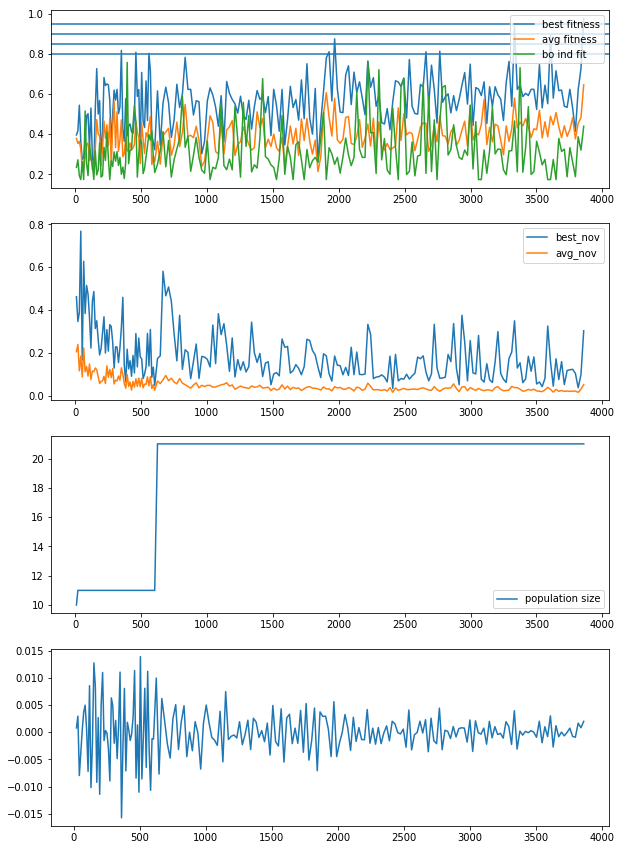

cmabo_20_4_8-12-32-2255_3388869569


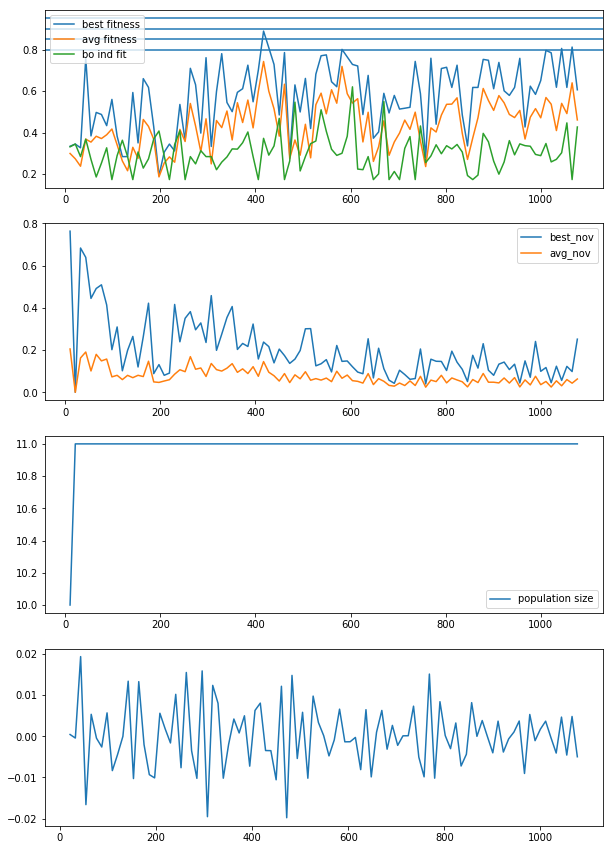

cmabo_20_4_8-12-8-8009_2565399685


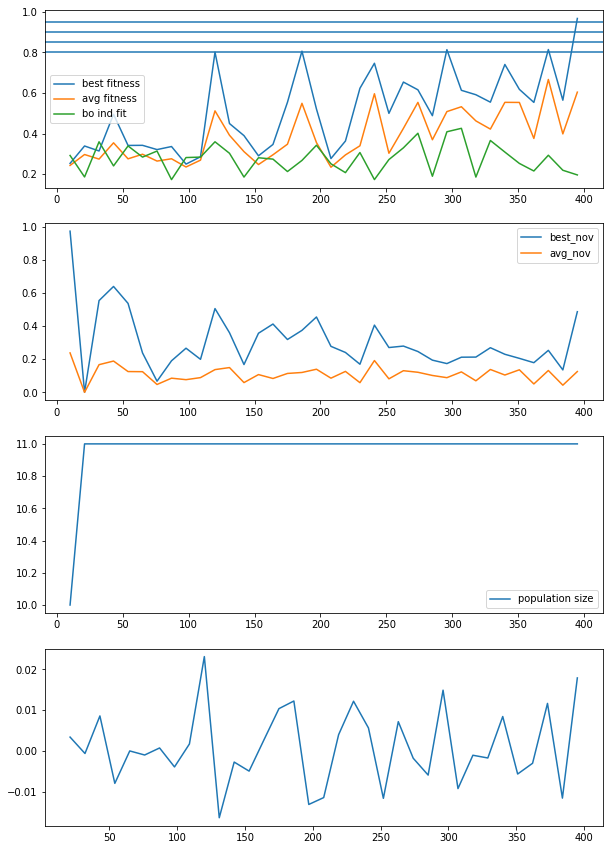

cmabo_20_4_8-12-22-2755_2449584486


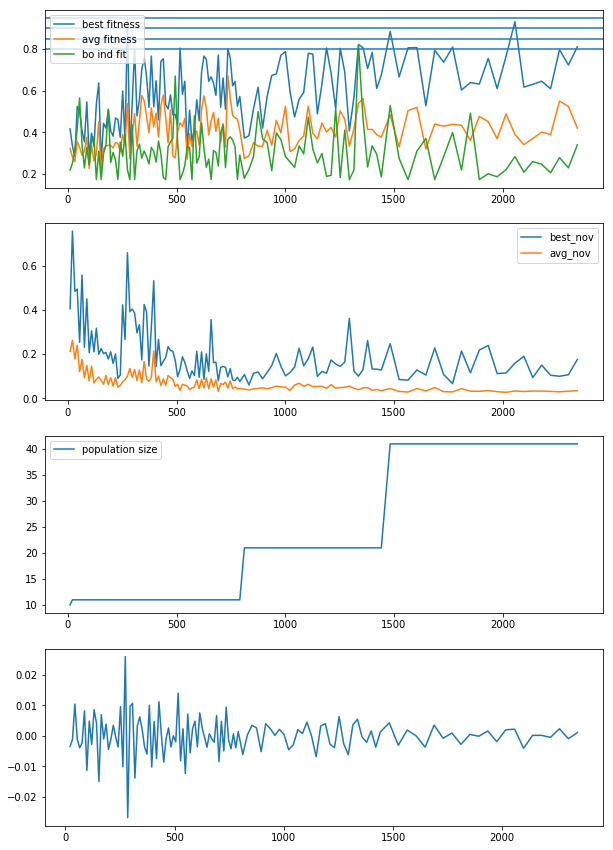

cmabo_20_4_8-11-55-5710_1905708809


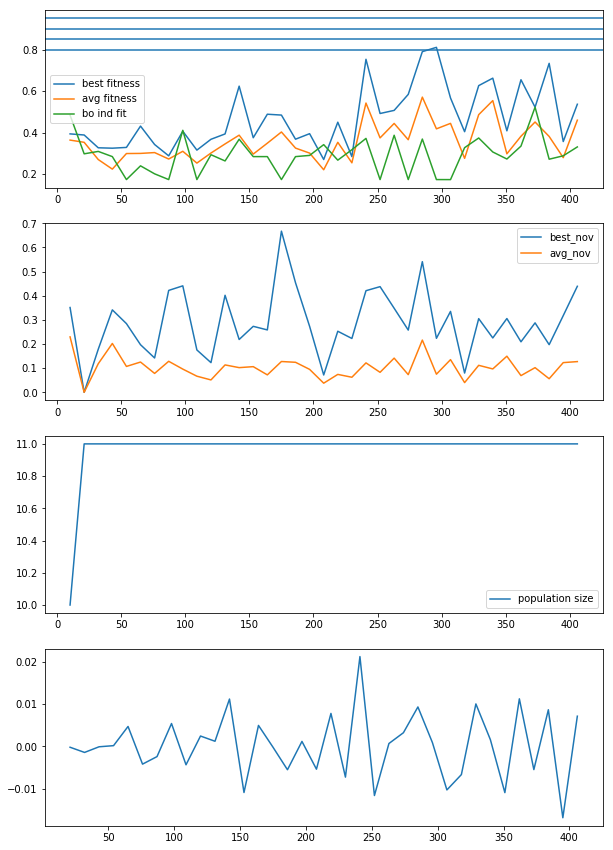

cmabo_20_4_8-12-33-3997_617612116


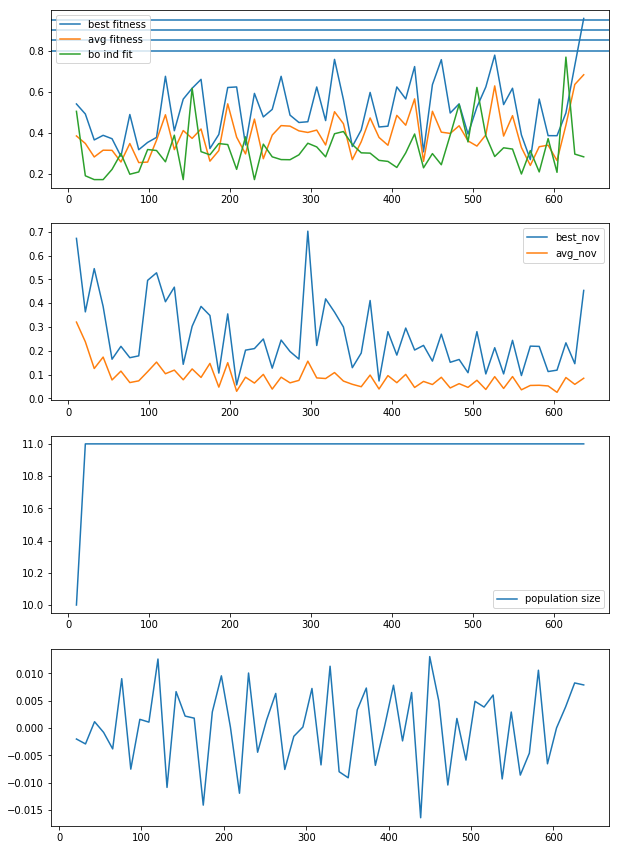

In [63]:
are_cmabo_easy = "/home/leni/are-logs/are_cmabo_easy/"
x_vec = []
y_vec = []
for folder in os.listdir(are_cmabo_easy) :
    if(not os.path.isdir(are_cmabo_easy + folder)) :
        continue
    print(folder)
    neval, best_fit, avg_fit,pop_size = load_all_fit_from_fpos(are_cmabo_easy + folder + "/final_pos.csv",[0.75,0.75])
    x, y = load_obs(are_cmabo_easy + folder + "/bo_data.csv")
    fitnesses = rewards(zip(x,y),[0.75,0.75])
    neval, best_nov, avg_nov,pop_size = load_all_fitnesses(are_cmabo_easy + folder + "/novelty.csv")
    nbeval, eval_time = load_eval_time(are_cmabo_easy + folder + "/eval_durations.csv");

    
    gain = [(best_fit[i] - best_fit[i-1])/eval_time[i-1] for i in range(1,len(best_fit))]

    fig = plt.figure(figsize=[10,15])
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,3)
    ax3 = fig.add_subplot(4,1,2)
    ax4 = fig.add_subplot(4,1,4)

#    ax1.set_ylim(0.4,1)
#    ax3.set_ylim(0.0,0.5)
    ax1.plot(neval,best_fit,label="best fitness")
    
    ax1.plot(neval,avg_fit,label="avg fitness")
    ax1.plot(neval,fitnesses,label="bo ind fit")
    ax1.axhline(y=0.95)
    ax1.axhline(y=0.9)
    ax1.axhline(y=0.85)
    ax1.axhline(y=0.80)
    
    ax2.plot(neval,pop_size,label="population size")
    ax3.plot(neval,best_nov,label="best_nov")
    ax3.plot(neval,avg_nov,label="avg_nov")
    ax4.plot(neval[1:],gain,label='gain')
   # ax5.plot(eval_durations)

    
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()
    #animation_pop(are_ipop_hard_pst005 + folder,pop_size,1)